In [1]:
import os
os.chdir('../..')
!ls

product_impacts


In [2]:
import pandas as pd
import numpy as np
import math
import glob

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import matplotlib.ticker as ticker
from matplotlib.gridspec import GridSpec
import matplotlib.collections as mcoll 
from mpl_toolkits.axes_grid1 import make_axes_locatable
import textwrap

import statsmodels.formula.api as smf
import statsmodels.api as sm

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
%config InlineBackend.figure_format = 'retina'

In [3]:
products_cats = pd.read_csv('../../SFS/environmental_impacts/Products_dat/products_categories.csv')

/var/folders/hz/lt88gkws0n58xdkp66k3nk340000gn/T/ipykernel_83794/641388362.py:1: DtypeWarning: Columns (2,5,6,7,8,9,10,11,12,29,30,31) have mixed types. Specify dtype option on import or set low_memory=False.
  products_cats = pd.read_csv('../../SFS/environmental_impacts/Products_dat/products_categories.csv')


In [4]:
products_cats.shape

(1154955, 37)

In [5]:
products_cats['database'].value_counts()

database
openfoodfacts    912480
fooddb           242475
Name: count, dtype: int64

In [6]:
products_cats[products_cats['ingredients_text'].notnull()]['database'].value_counts()

database
openfoodfacts    641839
fooddb           211869
Name: count, dtype: int64

In [7]:
products_cats[products_cats['ingredients_text'].isna()]['database'].value_counts()

database
openfoodfacts    270641
fooddb            30606
Name: count, dtype: int64

In [8]:
products_cats[(products_cats['ingredients_text'].notnull()) & (products_cats[['product_name', 'ingredients_text', 'country']].duplicated())]['database'].value_counts()

database
fooddb           56716
openfoodfacts    10168
Name: count, dtype: int64

In [9]:
products_cats[(products_cats['ingredients_text'].notnull()) & (products_cats[['product_name', 'country']].duplicated())]['database'].value_counts()

database
openfoodfacts    153829
fooddb            91675
Name: count, dtype: int64

In [10]:
products_cats[products_cats['ingredients_text'].notnull()].shape

(853708, 37)

In [11]:
products_cats[products_cats['ingredients_text'].notnull()]['country'].nunique()

76

In [12]:
df_list = []
for fname in glob.glob(os.path.join('../../SFS/environmental_impacts/Managed_Data', "Total_Impacts_By_Product_sourcing*.csv")):
    df = pd.read_csv(fname)
    df_list.append(df)

impacts = pd.concat(df_list, axis=0, ignore_index=True)

In [13]:
impacts = products_cats.merge(impacts.drop('product_name', axis=1), left_on='product_id', 
                              right_on='id').drop('id', axis=1)

In [14]:
impacts.shape

(790054, 130)

In [15]:
impacts['database'].value_counts()

database
openfoodfacts    590049
fooddb           200005
Name: count, dtype: int64

In [16]:
preds = []

for prefix in ['eng/', 'non_eng/']:
    pred = pd.read_csv(f'../../SFS/openfoodfacts/all/predictions/{prefix}predictions_nn.csv')

    # pred = pred[(pred['parentcategory_prob']>0.8)
    #                   & ((pred['subfoodgroup_prob'].isna()) | (pred['subfoodgroup_prob']>0.8))]
    
    preds.append(pred)

off = pd.concat(preds, axis=0, ignore_index=True)
fdb = pd.read_csv('../../SFS/NDNS UK/predictions/all_predictions_15Oct2024.csv').drop('product_name', axis=1).rename(columns={
    'product_list_name': 'product_name',
    'parentcategory_pred': 'parentcategory', 
    'mainfoodgroup_pred': 'mainfoodgroup', 
    'subfoodgroup_pred': 'subfoodgroup'
    })

cols = ['product_id', 'product_name', 'ingredients_text', 'parentcategory', 'mainfoodgroup', 'subfoodgroup',
        'parentcategory_prob', 'subfoodgroup_prob']
categories = pd.concat([off, fdb], axis=0, ignore_index=True)
categories = categories[cols]

In [17]:
df_list = []
for fname in glob.glob(os.path.join('../../SFS/environmental_impacts/Outputs', "FoodDB and OFF percent composition by ingredient*.csv")):
    df = pd.read_csv(fname, low_memory=False)
    df_list.append(df)

composition = pd.concat(df_list, axis=0, ignore_index=True)

/var/folders/hz/lt88gkws0n58xdkp66k3nk340000gn/T/ipykernel_83794/3985298522.py:6: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  composition = pd.concat(df_list, axis=0, ignore_index=True)


In [18]:
composition['percent'] = pd.to_numeric(composition['percent'], errors='coerce')

In [19]:
composition['id'].nunique() # almost the same as the number of products in products_cat containing ingredients

853677

In [20]:
products_cats[(products_cats['product_id'].isin(
    composition[~composition['id'].isin(impacts['product_id'].unique())]['id'].unique()
))]['database'].value_counts() # products for which impacts weren't estimated despite having composition info

database
openfoodfacts    51777
fooddb           11846
Name: count, dtype: int64

In [21]:
comp_75 = composition[(composition['id'].isin(impacts['product_id'].unique()))]
comp_75 = comp_75[(comp_75['Food_Category'].notnull())]
comp_75 = comp_75.groupby('id')[['percent']].sum().reset_index()

In [22]:
impacts[(impacts['product_id'].isin(comp_75[comp_75['percent']<=75]['id'].unique()))]['database'].value_counts()

database
openfoodfacts    98186
fooddb           23560
Name: count, dtype: int64

In [23]:
# removing products with less than 75% composition identified
impacts = impacts[impacts['product_id'].isin(comp_75[comp_75['percent']>75]['id'].unique())].reset_index(drop=True)

In [24]:
impacts['database'].value_counts()

database
openfoodfacts    491837
fooddb           176445
Name: count, dtype: int64

In [25]:
impacts = impacts[impacts['product_name'].notnull()] # removing 2 products where product name is null

In [26]:
# removing products with negative composition (466 - 243 fooddb 223 off)
impacts = impacts[~impacts['product_id'].isin(composition[composition['percent']<0]['id'].unique())]

In [27]:
# removing 1 product with total compostion = ~1400%
impacts = impacts[impacts['product_id']!=291120242535179]

In [28]:
impacts[(impacts['ingredients_text'].notnull()) & (impacts[['product_name', 'ingredients_text', 'country']].duplicated())]['database'].value_counts()

database
fooddb           47721
openfoodfacts     8399
Name: count, dtype: int64

In [29]:
impacts[(impacts['ingredients_text'].notnull()) & (impacts[['product_name', 'country']].duplicated())]['database'].value_counts()

database
openfoodfacts    106172
fooddb            71972
Name: count, dtype: int64

In [30]:
# checking if impacts for duplicated products are fairly similar

d1 = impacts[(impacts.duplicated(subset=['product_name', 'country'], keep=False))].drop_duplicates(['product_name', 'country'], keep='first')
d2 = impacts[(impacts.duplicated(subset=['product_name', 'country'], keep=False))].drop_duplicates(['product_name', 'country'], keep='last')
cols = ['product_name', 'country', 'mean_Land', 'mean_GHG', 'mean_Eut', 'mean_WatScar', 'mean_Biodiversity']
d = d1[cols].rename(columns={
    'mean_Land': 'mean_Land1', 
    'mean_GHG': 'mean_GHG1', 
    'mean_Eut': 'mean_Eut1', 
    'mean_WatScar': 'mean_WatScar1', 
    'mean_Biodiversity': 'mean_Biodiversity1'
}).merge(d2[cols].rename(columns={
    'mean_Land': 'mean_Land2', 
    'mean_GHG': 'mean_GHG2', 
    'mean_Eut': 'mean_Eut2', 
    'mean_WatScar': 'mean_WatScar2', 
    'mean_Biodiversity': 'mean_Biodiversity2'
}))

print(f'Land corr: {d['mean_Land1'].corr(d['mean_Land2'])}')
print(f'GHG corr: {d['mean_GHG1'].corr(d['mean_GHG2'])}')
print(f'Eut corr: {d['mean_Eut1'].corr(d['mean_Eut2'])}')
print(f'Watscar corr: {d['mean_WatScar1'].corr(d['mean_WatScar2'])}')
print(f'Biodiversity corr: {d['mean_Biodiversity1'].corr(d['mean_Biodiversity2'])}')

Land corr: 0.8984001616671967
GHG corr: 0.9326033101582314
Eut corr: 0.8720635857860015
Watscar corr: 0.9106502398745507
Biodiversity corr: 0.8970486568907798


In [31]:
# removing duplicated product names
impacts = impacts.drop_duplicates(subset=['product_name', 
                                          # 'ingredients_text', 
                                          'country'])

In [32]:
impacts['database'].value_counts()

database
openfoodfacts    385419
fooddb           104250
Name: count, dtype: int64

In [33]:
impacts[(impacts['mean_Land']==0)
       & (impacts['mean_GHG']<=0)
       & (impacts['mean_Eut']==0) 
       & (impacts['mean_WatScar']==0)
       & (impacts['mean_Biodiversity']==0)]['database'].value_counts()

database
openfoodfacts    4789
fooddb           1547
Name: count, dtype: int64

In [34]:
# removing products where all impacts are 0
impacts = impacts[(impacts['mean_Land']>0)
                 | (impacts['mean_GHG']>0)
                 | (impacts['mean_Eut']>0) 
                 | (impacts['mean_WatScar']>0)
                 | (impacts['mean_Biodiversity']>0)]

In [35]:
impacts['database'].value_counts()

database
openfoodfacts    380630
fooddb           102703
Name: count, dtype: int64

In [36]:
impacts.shape

(483333, 130)

#### categorizing, cleaning, and normalizing for figures

In [37]:
cat_map = pd.read_csv('../../SFS/environmental_impacts/Products_dat/cat_map.csv')

In [38]:
impacts = impacts.merge(cat_map)

In [39]:
# correcting misclassifications where possible (if missclassifications are obvious and composition looks correct)
cols = ['groups', 'labels', 'ID']

impacts.loc[impacts['product_name'].str.lower().str.contains('biltong'), cols] = cat_map[cat_map['labels']=='Beef and lamb'][cols].values[0]

impacts.loc[(impacts['labels']=='Bread') & (impacts['mean_GHG']>2) 
    & (~impacts['product_id'].isin([26751131, 291120242089877])), cols] = cat_map[cat_map['labels']=='Dairy products'][cols].values[0]

impacts.loc[impacts['product_id'].isin(composition[(composition['id'].isin(impacts[(impacts['labels']=='Beans and pulses') 
                                    & (impacts['mean_GHG']>0.5)]['product_id'].unique())) 
            & (composition['Food_Category']=='Coffee')]['id'].unique()), cols] = cat_map[cat_map['labels']=='Coffee'][cols].values[0]

impacts.loc[impacts['product_id'].isin(composition[(composition['id'].isin(impacts[(impacts['labels']=='Vegetables and vegetable dishes') 
                                    & (impacts['mean_GHG']>1)]['product_id'].unique()))
        & (composition['Food_Category'].isin([
            'Coffee']))]['id'].unique()), cols] = cat_map[cat_map['labels']=='Coffee'][cols].values[0]

impacts.loc[impacts['product_id'].isin(composition[(composition['id'].isin(impacts[(impacts['labels']=='Vegetables and vegetable dishes') 
                                    & (impacts['mean_GHG']>1)]['product_id'].unique()))
        & (composition['Food_Category'].isin(['Cheese', 'Animal Fats']))
        & (composition['percent']>80)]['id'].unique()), cols] = cat_map[cat_map['labels']=='Dairy products'][cols].values[0]

ids = impacts[impacts['groups'].isin(['Fruits, Vegetables, and Nuts'])]['product_id'].unique()
composition_sub = composition[composition['id'].isin(ids)].groupby(['id', 'Food_Category'])[['percent']].sum().reset_index()
impacts.loc[(impacts['product_id'].isin(composition_sub[(composition_sub['percent']>20) 
                                        & (composition_sub['Food_Category'].isin([
                                            'Fish (farmed)', 'Crustaceans (farmed)', 'Poultry Meat', 'Pig Meat', 
                                            'Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)', 'Lamb & Mutton']))]['id'].unique()))
            & (impacts['product_id'].isin(ids)), cols] = cat_map[cat_map['labels']=='Meat dishes'][cols].values[0]

# cereals with lots of meat - choice of meat doesnt matter (this will get resolved later)
# pizza, pasta, rice, bread, other cereals, breakfast cereals with more than 20% meat can be moved to meat categories
ids = impacts[impacts['labels'].isin(['Pizza', 'Pasta', 'Rice', 'Other cereals', 'Bread', 'Breakfast cereals'])]['product_id'].unique()
composition_sub = composition[composition['id'].isin(ids)].groupby(['id', 'Food_Category'])[['percent']].sum().reset_index()
impacts.loc[(impacts['product_id'].isin(composition_sub[(composition_sub['percent']>20) 
                                        & (composition_sub['Food_Category'].isin(['Fish (farmed)', 'Crustaceans (farmed)']))]['id'].unique()))
            & (impacts['product_id'].isin(ids)), cols] = cat_map[cat_map['labels']=='Seafood'][cols].values[0]
impacts.loc[(impacts['product_id'].isin(composition_sub[(composition_sub['percent']>20) 
                                        & (composition_sub['Food_Category'].isin(['Poultry Meat', 'Pig Meat']))]['id'].unique()))
            & (impacts['product_id'].isin(ids)), cols] = cat_map[cat_map['labels']=='Poultry and pig meat'][cols].values[0]
impacts.loc[(impacts['product_id'].isin(composition_sub[(composition_sub['percent']>20) 
                                        & (composition_sub['Food_Category'].isin(['Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)', 'Lamb & Mutton']))]['id'].unique()))
            & (impacts['product_id'].isin(ids)), cols] = cat_map[cat_map['labels']=='Beef and lamb'][cols].values[0]

# cakes and pastries with no sugar and any meat can be moved to meat dishes 
ids = impacts[impacts['labels'].isin(['Cakes, pastries and puddings'])]['product_id'].unique()
composition_sub = composition[composition['id'].isin(ids)].groupby(['id', 'Food_Category'])[['percent']].sum().reset_index()
impacts.loc[(impacts['product_id'].isin(composition_sub[(composition_sub['Food_Category'].isin(['Fish (farmed)', 'Crustaceans (farmed)',
                                                                                               'Poultry Meat', 'Pig Meat',
                                                                                               'Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)', 
                                                                                               'Lamb & Mutton']))]['id'].unique()))
            & (impacts['product_id'].isin(ids))
            & (~impacts['product_id'].isin(composition_sub[(composition_sub['Food_Category'].isin([
                'Beet Sugar', 'Cane Sugar']))]['id'].unique())), cols] = cat_map[cat_map['labels']=='Meat dishes'][cols].values[0]

# if compoition of meat tpye is < thresh%, it will get resolved later
impacts.loc[impacts['product_id'].isin([291120242299240, 291120241661367, 291120241806078, 
                                        291120241877822, 291120241820545, 11928912, 
                                        291120241646880, 291120241905809, 291120241792361,
                                        291120241563722]), cols] = cat_map[cat_map['labels']=='Beef and lamb'][cols].values[0] 

impacts.loc[impacts['product_id'].isin([11940244, 31664703]), cols] = cat_map[cat_map['labels']=='Poultry and pig meat'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120241987307, 11915790, 11965089, 
                                        11915790, 26752544, 26786406, 
                                        26717802, 11916005]), cols] = cat_map[cat_map['labels']=='Liver and other meat products'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120241791421]), cols] = cat_map[cat_map['labels']=='Meat dishes'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120242372572, 291120241932019, 291120241750018,
                                       291120241962623, 291120241962624]), cols] = cat_map[cat_map['labels']=='Seafood'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120241975040, 291120242338098]), cols] = cat_map[cat_map['labels']=='Tea'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120242272798]), cols] = cat_map[cat_map['labels']=='Coffee'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120241756812, 26771920, 291120242168737, 291120242298797, 
                                        291120242315457, 291120241762311, 291120242168737, 291120241959767, 
                                        291120242009781, 291120241816428, 291120242255846, 291120242506046, 
                                        291120242506047, 291120242063883, 291120242567757, 291120242063883, 
                                        291120242063884, 291120242063885, 291120242065437, 291120242081760, 
                                        291120242100555, 291120242504979, 291120242506054, 291120242506056]), cols] = cat_map[cat_map['labels']=='Nuts and seeds'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120241650582, 291120241749709, 11902752, 11929846, 
                                        291120241652521, 291120241726456, 291120241741073, 
                                        291120241842596, 291120241868328, 291120241836208, 
                                        291120242362876, 291120242347938, 291120242347939, 
                                        291120242347940, 291120242347941, 291120241935883,
                                        291120241553544, 291120241553547, 291120241590369]), cols] = cat_map[cat_map['labels']=='Chocolate confectionery'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120241878392, 291120242342784, 291120242319780, 
                                        291120242459897, 291120241845224, 291120241798416,
                                        291120241874155]), cols] = cat_map[cat_map['labels']=='Dairy products'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120242203380]), cols] = cat_map[cat_map['labels']=='Nutrition powders and supplements'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120241745342, 291120242359135]), cols] = cat_map[cat_map['labels']=='Cakes, pastries and puddings'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120242105115, 291120242105114]), cols] = cat_map[cat_map['labels']=='Biscuits'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120242264329]), cols] = cat_map[cat_map['labels']=='Other cereals'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120241623797, 291120241795300, 291120241805253, 
                                        291120241805254, 291120241823929]), cols] = ['Meat, Dairy, and Eggs', 'Dairy alternatives', '3J']

impacts.loc[impacts['product_id'].isin([291120241722592]), cols] = cat_map[cat_map['labels']=='Sugar, preserves, and spreads'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120241606439, 291120241795671, 
                                        291120242448641]), cols] = cat_map[cat_map['labels']=='Sugar confectionery'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120241891762]), cols] = cat_map[cat_map['labels']=='Vegetables and vegetable dishes'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120241617790]), cols] = cat_map[cat_map['labels']=='Beans and pulses'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120241966208, 291120242541287, 
                                        291120242180902]), cols] = cat_map[cat_map['labels']=='Fresh or canned fruit'][cols].values[0]

impacts.loc[impacts['product_id'].isin([26753415, 291120241550706, 291120241786996, 
                                        291120241794173, 291120241812943, 
                                        291120241764707, 291120241812944, 291120241812962, 
                                        291120241763633, 291120241680664]), cols] = cat_map[cat_map['labels']=='Savoury snacks'][cols].values[0]

impacts.loc[impacts['product_id'].isin([26767210, 291120242299240, 291120241868227, 
                                        291120241658580, 291120242094378, 291120242204470, 
                                        291120242069487, 291120242069489, 291120242081740]), cols] = cat_map[cat_map['labels']=='Cooking fats and oils'][cols].values[0]

impacts.loc[impacts['product_id'].isin([291120241583975, 291120241593335, 291120241598849, 291120241598850,
                                        291120241598851, 291120241621476, 291120241660151, 291120241687580,
                                        291120241705827, 291120241712060, 291120241712105, 291120241712106,
                                        291120241712115, 291120241712150, 291120241712328, 291120241712332,
                                        291120241712745, 291120241715449, 291120241728954, 291120241728996,
                                        291120241729046, 291120241729060, 291120241729067, 291120241729080,
                                        291120241729093, 291120241729109, 291120241729301, 291120242387021,
                                        291120242333814, 291120241574656, 291120241688281]), cols] = cat_map[cat_map['labels']=='Soup and toddler foods'][cols].values[0]

In [40]:
# misclassified products and/or incorrect composition estimations (based on manual checking)

impacts.loc[(impacts['labels']=='Nuts and seeds') & (impacts['mean_WatScar']<10), 'labels'] = 'mis'


# classified into meat dishes but contain no animal products / no animal products were identified by composition algrithm
id_mis = composition[(composition['id'].isin(impacts[(impacts['labels']=='Meat dishes')]['product_id'].unique()))
    & (composition['Food_Category'].isin(['Fish (farmed)', 'Crustaceans (farmed)', 'Poultry Meat', 'Pig Meat', 'Animal Fats',
                                          'Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)', 'Lamb & Mutton']))]['id'].unique()
impacts.loc[(impacts['labels']=='Meat dishes') & (~impacts['product_id'].isin(id_mis)), 'labels'] = 'mis'


# classified into meat alternatives but contain animal products / animal products were identified by classification algorithm
id_mis = composition[(composition['id'].isin(impacts[(impacts['labels']=='Meat alternatives')]['product_id'].unique())) 
    & (composition['Food_Category'].isin(['Fish (farmed)', 'Crustaceans (farmed)', 'Poultry Meat', 'Pig Meat', 'Animal Fats',
                                          'Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)', 'Lamb & Mutton']))]['id'].unique()
impacts.loc[impacts['product_id'].isin(id_mis), 'labels'] = 'mis'


# removing bisucits if they contain more than 10% meat
ids = impacts[impacts['labels'].isin(['Biscuits'])]['product_id'].unique()
composition_sub = composition[composition['id'].isin(ids)].groupby(['id', 'Food_Category'])[['percent']].sum().reset_index()
impacts.loc[(impacts['product_id'].isin(composition_sub[(composition_sub['percent']>10) 
                                        & (composition_sub['Food_Category'].isin([
    'Fish (farmed)', 'Crustaceans (farmed)', 'Poultry Meat', 'Pig Meat', 
    'Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)', 'Lamb & Mutton']))]['id'].unique()))
            & (impacts['product_id'].isin(ids)), 'labels'] = 'mis'


# removing cake and pastry items containing more thatn 10% meat and sugar at the same time
ids = impacts[impacts['labels'].isin(['Cakes, pastries and puddings'])]['product_id'].unique()
composition_sub = composition[composition['id'].isin(ids)].groupby(['id', 'Food_Category'])[['percent']].sum().reset_index()
impacts.loc[(impacts['product_id'].isin(composition_sub[(composition_sub['percent']>10) 
                                        & (composition_sub['Food_Category'].isin([
    'Fish (farmed)', 'Crustaceans (farmed)', 'Poultry Meat', 'Pig Meat', 
    'Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)', 'Lamb & Mutton']))]['id'].unique()))
            & (impacts['product_id'].isin(ids))
            & (impacts['product_id'].isin(composition_sub[(composition_sub['Food_Category'].isin([
                'Beet Sugar', 'Cane Sugar']))]['id'].unique())), 'labels'] = 'mis'


# products with less than 10% meat but classified into sausages, burgers, kebabs, liver, meat products (if anything these belong in meat dishes) 
ids = impacts[impacts['labels'].isin(['Sausages, burgers and kebabs', 'Liver and other meat products'])]['product_id'].unique()
composition_sub = composition[composition['id'].isin(ids)].groupby(['id', 'Food_Category'])[['percent']].sum().reset_index()
id_true = composition_sub[(composition_sub['percent']>10) 
                          & (composition_sub['Food_Category'].isin(['Fish (farmed)', 'Crustaceans (farmed)', 
                                                                   'Poultry Meat', 'Pig Meat', 
                                                                   'Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)', 
                                                                   'Lamb & Mutton']))]['id'].unique()
impacts.loc[impacts['product_id'].isin(composition_sub[~composition_sub['id'].isin(id_true)]['id'].unique()), 'labels'] = 'mis'


id_mis = [291120241844129, 291120241590984, 291120241620810, 291120241812419, 291120241823317, 291120242369190,
          291120242504040, 291120242504041, 11938171, 291120241559552, 291120241772764, 291120241665243, 
          26682999, 291120241735994, 291120241665244, 291120241726797, 291120241735994, 291120241784444, 
          291120241790396, 26751131, 291120242531059, 291120242169771, 291120242155040, 291120242167480, 
          291120242088839, 291120242088840, 291120242134756, 291120242224187, 291120242224265, 291120242224270,
          291120242224271, 291120242224272, 291120242224273, 291120242240887, 291120242347755, 291120242347756, 
          291120242347759, 291120242457104, 291120242513916, 291120242513917, 291120241788427, 291120242049322, 
          291120242091898, 291120242101596, 291120242302040, 291120242345202, 291120242345203, 291120242352701, 
          291120242577941, 291120242073784, 291120242073785, 291120242079449, 11971135, 11963202, 26706213, 
          26749601, 26780937, 26679950, 26679955, 26680295, 26753996, 26675482, 26736579, 26736583, 26814267, 
          31591050, 31618474, 31680765, 31605376, 31705748, 31624214, 31624229, 291120241740550, 11925097, 
          11925103, 11925114, 11926558, 11884327, 11884366, 26678468, 26688777, 291120242152201, 291120241542513,
          291120242267827, 291120242267828, 291120242081739, 291120241945118, 291120241653620, 291120242358495, 
          291120242129361, 26848731, 291120241713305, 291120242334362, 291120242334363, 291120242334364, 
          291120242098810, 291120241775340, 291120241945312, 291120241640759]
impacts.loc[impacts['product_id'].isin(id_mis), 'labels'] = 'mis'




In [41]:
# split dairy and dairy alternatives

ids = impacts[impacts['labels'].isin(['Dairy products'])]['product_id'].unique()
composition_sub = composition[composition['id'].isin(ids)]
milk_ids = composition_sub[composition_sub['Food_Category'].isin(['Milk', 'Cheese', 'Butter, Cream & Ghee'])]['id'].unique()
vegan_milk_ids = set(composition_sub[(composition_sub['Food_Category'].isin([
    'Other Fruit', 'Nuts','Other Pulses', 'Oatmeal', 'Rice',
    'Cereals & Oilcrops Misc.', 'Palm Oil', 'Soybean Oil', 
    'Wheat & Rye (Bread)', 'Sunflower Oil', 'Soymilk']))]['id'].unique()).difference(set(milk_ids))
vegan_milk_ids = vegan_milk_ids.difference(composition_sub[(composition_sub['Food_Category'].isin([
    'Eggs', 'Fish (farmed)', 'Poultry Meat',
    'Lamb & Mutton', 'Bovine Meat (dairy herd)',
    'Milk Chocolate', 'Bovine Meat (beef herd)']))]['id'].unique())

impacts.loc[impacts['product_id'].isin(vegan_milk_ids), cols] = ['Meat, Dairy, and Eggs', 'Dairy alternatives', '3J']

impacts.loc[(impacts['product_id'].isin(ids))
           & (~impacts['product_id'].isin(vegan_milk_ids))
           & (~impacts['product_id'].isin(milk_ids)), 'labels'] = 'mis'

In [42]:
# split meat and meat dishes based on 40% threshold
thresh = 40

# first get dishes with less than thresh% meat categorized in separate meat categories and move those to meat dishes
ids_meat = impacts[impacts['labels'].isin(['Poultry and pig meat', 'Seafood', 'Beef and lamb'])]['product_id'].unique()
composition_sub = composition[composition['id'].isin(ids_meat)].groupby(['id', 'Food_Category'])[['percent']].sum().reset_index()

id_true = composition_sub[composition_sub['Food_Category'].isin(['Fish (farmed)', 'Crustaceans (farmed)', 
                                                                 'Poultry Meat', 'Pig Meat', 
                                                                 'Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)', 
                                                                 'Lamb & Mutton'])]['id'].unique()
id_false = composition_sub[~composition_sub['id'].isin(id_true)]['id'].unique()

impacts.loc[impacts['product_id'].isin(id_false), 'labels'] = 'mis'

# assign beef and lamb
impacts.loc[(impacts['product_id'].isin(composition_sub[(composition_sub['percent']>thresh)
                                       & (composition_sub['Food_Category'].isin([
                                           'Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)', 
                                           'Lamb & Mutton']))]['id'].unique()))
            & (impacts['product_id'].isin(id_true)), cols] = cat_map[cat_map['labels']=='Beef and lamb'][cols].values[0]

# get rest of the ids
id_true = set(id_true).difference(set(composition_sub[(composition_sub['percent']>thresh)
                                      & (composition_sub['Food_Category'].isin([
                                          'Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)', 
                                          'Lamb & Mutton']))]['id'].unique()))

# assing pig and poultry
impacts.loc[(impacts['product_id'].isin(composition_sub[(composition_sub['percent']>thresh)
                                       & (composition_sub['Food_Category'].isin([
                                           'Poultry Meat', 'Pig Meat']))]['id'].unique()))
            & (impacts['product_id'].isin(id_true)), cols] = cat_map[cat_map['labels']=='Poultry and pig meat'][cols].values[0]

# get rest of the ids
id_true = set(id_true).difference(set(composition_sub[(composition_sub['percent']>thresh)
                                      & (composition_sub['Food_Category'].isin([
                                          'Poultry Meat', 'Pig Meat']))]['id'].unique()))

# assign seafood
impacts.loc[(impacts['product_id'].isin(composition_sub[(composition_sub['percent']>thresh)
                                       & (composition_sub['Food_Category'].isin([
                                           'Fish (farmed)', 
                                           'Crustaceans (farmed)']))]['id'].unique()))
            & (impacts['product_id'].isin(id_true)), cols] = cat_map[cat_map['labels']=='Seafood'][cols].values[0]
# get rest of the ids
id_true = set(id_true).difference(set(composition_sub[(composition_sub['percent']>thresh)
                                      & (composition_sub['Food_Category'].isin([
                                          'Fish (farmed)', 
                                          'Crustaceans (farmed)']))]['id'].unique()))

impacts.loc[impacts['product_id'].isin(id_true), cols] = cat_map[cat_map['labels']=='Meat dishes'][cols].values[0]

In [43]:
# now get meat dishes with more than thresh% meat of one type and assign to respective meat categories
ids_meat_dishes = impacts[impacts['labels'].isin(['Meat dishes'])]['product_id'].unique()
composition_sub = composition[composition['id'].isin(ids_meat_dishes)].groupby(['id', 'Food_Category'])[['percent']].sum().reset_index()

# no need to identify misallocations here since we've already done that for this category earlier

# assign beef and lamb
impacts.loc[(impacts['product_id'].isin(composition_sub[(composition_sub['percent']>thresh)
                                       & (composition_sub['Food_Category'].isin([
                                           'Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)', 
                                           'Lamb & Mutton']))]['id'].unique()))
            & (impacts['product_id'].isin(ids_meat_dishes)), cols] = cat_map[cat_map['labels']=='Beef and lamb'][cols].values[0]

# get rest of the ids
ids_meat_dishes = set(ids_meat_dishes).difference(set(composition_sub[(composition_sub['percent']>thresh)
                                                     & (composition_sub['Food_Category'].isin([
                                                         'Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)', 
                                                         'Lamb & Mutton']))]['id'].unique()))

# assing pig and poultry
impacts.loc[(impacts['product_id'].isin(composition_sub[(composition_sub['percent']>thresh)
                                       & (composition_sub['Food_Category'].isin([
                                           'Poultry Meat', 'Pig Meat']))]['id'].unique()))
            & (impacts['product_id'].isin(ids_meat_dishes)), cols] = cat_map[cat_map['labels']=='Poultry and pig meat'][cols].values[0]

# get rest of the ids
ids_meat_dishes = set(ids_meat_dishes).difference(set(composition_sub[(composition_sub['percent']>thresh)
                                                     & (composition_sub['Food_Category'].isin([
                                                           'Poultry Meat', 'Pig Meat']))]['id'].unique()))

# assign seafood
impacts.loc[(impacts['product_id'].isin(composition_sub[(composition_sub['percent']>thresh)
                                       & (composition_sub['Food_Category'].isin([
                                           'Fish (farmed)', 
                                           'Crustaceans (farmed)']))]['id'].unique()))
            & (impacts['product_id'].isin(ids_meat_dishes)), cols] = cat_map[cat_map['labels']=='Seafood'][cols].values[0]

In [44]:
impacts[impacts['labels']=='mis'].shape

(8378, 133)

In [45]:
impacts = impacts[impacts['labels']!='mis']

In [46]:
impacts['database'].value_counts()

database
openfoodfacts    373849
fooddb           101106
Name: count, dtype: int64

In [47]:
impacts[impacts['labels']!='mis']['country'].nunique()

74

In [48]:
impacts.shape

(474955, 133)

In [49]:
# set(products_cats['country'].unique()).difference(set(impacts['country'].unique()))

In [50]:
impacts[['mean_Land', 'mean_GHG', 'mean_Biodiversity', 'mean_Eut',  'mean_WatScar']].corr() # doesnt matter that these are not normalized for corrs

,mean_Land,mean_GHG,mean_Biodiversity,mean_Eut,mean_WatScar
mean_Land,1.000000,0.620981,0.704681,0.794788,0.238827
mean_GHG,0.620981,1.000000,0.514991,0.444084,0.315151
mean_Biodiversity,0.704681,0.514991,1.000000,0.627361,0.102487
mean_Eut,0.794788,0.444084,0.627361,1.000000,0.183671
mean_WatScar,0.238827,0.315151,0.102487,0.183671,1.000000


In [51]:
# impacts.groupby('labels')[['mean_Land', 'mean_GHG', 'mean_Eut', 'mean_WatScar', 'mean_Biodiversity']].corr()

In [52]:
# normalizing + aggregating across percentiles to compare range
impacts1 = impacts.copy()

# normalizing individual scores 
score_columns = ['Land', 
                 'GHG', 
                 'Eut', 
                 'WatScar',
                 'Biodiversity', 
                 # 'Acidification', 
                 # 'WaterUse'
                ]

for score_col in score_columns:
    cols = [f'mean_{score_col}', 
            f'min.impact_{score_col}', 
            f'max.impact_{score_col}', 
            f'lower_fifth.impact_{score_col}', 
            f'lower_tenth.impact_{score_col}', 
            f'lower_twentyfifth.impact_{score_col}', 
            f'fifty.impact_{score_col}',
            f'upper_seventyfifth.impact_{score_col}', 
            f'upper_ninety.impact_{score_col}', 
            f'upper_ninetyfifth.impact_{score_col}'
           ]
    
    min_score = impacts1[f'mean_{score_col}'].min() #min(impacts1[[col for col in cols]].min())
    max_score = impacts1[f'mean_{score_col}'].max() #max(impacts1[[col for col in cols]].max())
    
    for col in cols:
        impacts1[f'{col}_norm'] = 100 * (impacts1[col] - min_score) / (max_score - min_score)


# aggregating scores and then normalizing again
cols = ['mean', 
        'min.impact', 
        'max.impact', 
        'lower_fifth.impact', 
        'lower_tenth.impact', 
        'lower_twentyfifth.impact', 
        'fifty.impact',
        'upper_seventyfifth.impact', 
        'upper_ninety.impact', 
        'upper_ninetyfifth.impact']

for col in cols:
    impacts1[f'{col}_norm_agg'] = impacts1[[f'{col}_{score_col}_norm' for score_col in score_columns]].mean(axis=1)

cols = ['mean_norm_agg', 
        'min.impact_norm_agg', 
        'max.impact_norm_agg', 
        'lower_fifth.impact_norm_agg', 
        'lower_tenth.impact_norm_agg', 
        'lower_twentyfifth.impact_norm_agg', 
        'fifty.impact_norm_agg',
        'upper_seventyfifth.impact_norm_agg', 
        'upper_ninety.impact_norm_agg', 
        'upper_ninetyfifth.impact_norm_agg']   

min_score = impacts1['mean_norm_agg'].min() #min(impacts1[[col for col in cols]].min()) 
max_score = impacts1['mean_norm_agg'].max() #max(impacts1[[col for col in cols]].max())

for col in cols:
    impacts1[col] = 100 * (impacts1[col] - min_score) / (max_score - min_score)
    impacts1[col] = impacts1[col] + 0.01 # the outcome changes A LOT based on this - due to infinites

# impacts1 = impacts1[(impacts1['upper_ninetyfifth.impact_norm_agg']==0) | (impacts1['fifty.impact_norm_agg']!=0)] # to remove 1 product that causes infinites 

print('when comparing upper and lower quantiles to medians')

print('mean percentage differences')
print(((impacts1['fifty.impact_norm_agg'] - impacts1['lower_fifth.impact_norm_agg']) / impacts1['lower_fifth.impact_norm_agg']).mean()*100)
print(((impacts1['fifty.impact_norm_agg'] - impacts1['lower_twentyfifth.impact_norm_agg']) / impacts1['lower_twentyfifth.impact_norm_agg']).mean()*100)
print(((impacts1['upper_seventyfifth.impact_norm_agg'] - impacts1['fifty.impact_norm_agg']) / impacts1['fifty.impact_norm_agg']).mean()*100)
print(((impacts1['upper_ninetyfifth.impact_norm_agg'] - impacts1['fifty.impact_norm_agg']) / impacts1['fifty.impact_norm_agg']).mean()*100)

print('median percentage differences')
print(((impacts1['fifty.impact_norm_agg'] - impacts1['lower_fifth.impact_norm_agg']) / impacts1['lower_fifth.impact_norm_agg']).median()*100)
print(((impacts1['fifty.impact_norm_agg'] - impacts1['lower_twentyfifth.impact_norm_agg']) / impacts1['lower_twentyfifth.impact_norm_agg']).median()*100)
print(((impacts1['upper_seventyfifth.impact_norm_agg'] - impacts1['fifty.impact_norm_agg']) / impacts1['fifty.impact_norm_agg']).median()*100)
print(((impacts1['upper_ninetyfifth.impact_norm_agg'] - impacts1['fifty.impact_norm_agg']) / impacts1['fifty.impact_norm_agg']).median()*100)

print('\nwhen comparing upper and lower quantiles to means')
print('mean percentage differences')
print(((impacts1['mean_norm_agg'] - impacts1['lower_fifth.impact_norm_agg']) / impacts1['lower_fifth.impact_norm_agg']).mean()*100)
print(((impacts1['mean_norm_agg'] - impacts1['lower_twentyfifth.impact_norm_agg']) / impacts1['lower_twentyfifth.impact_norm_agg']).mean()*100)
print(((impacts1['upper_seventyfifth.impact_norm_agg'] - impacts1['fifty.impact_norm_agg']) / impacts1['mean_norm_agg']).mean()*100)
print(((impacts1['upper_ninetyfifth.impact_norm_agg'] - impacts1['fifty.impact_norm_agg']) / impacts1['mean_norm_agg']).mean()*100)

print('median percentage differences')
print(((impacts1['mean_norm_agg'] - impacts1['lower_fifth.impact_norm_agg']) / impacts1['lower_fifth.impact_norm_agg']).median()*100)
print(((impacts1['mean_norm_agg'] - impacts1['lower_twentyfifth.impact_norm_agg']) / impacts1['lower_twentyfifth.impact_norm_agg']).median()*100)
print(((impacts1['upper_seventyfifth.impact_norm_agg'] - impacts1['fifty.impact_norm_agg']) / impacts1['mean_norm_agg']).median()*100)
print(((impacts1['upper_ninetyfifth.impact_norm_agg'] - impacts1['fifty.impact_norm_agg']) / impacts1['mean_norm_agg']).median()*100)

when comparing upper and lower quantiles to medians
mean percentage differences
98.2358600407494
35.70479585347171
32.285745256291875
137.69907048473215
median percentage differences
45.47606560238688
13.815374544607453
14.787050629111398
64.89624513633233

when comparing upper and lower quantiles to means
mean percentage differences
124.39410586763013
57.47886827461056
21.59180069551826
93.53577659012147
median percentage differences
70.06009076965617
31.263153135739696
13.19365778541881
58.69716687075759


In [53]:
# something related to the normalization of individual indicators within all the percentiles causes the 95th percentile to be smaller than the 5th (in extreme cases)
print((impacts1['upper_ninetyfifth.impact_norm_agg'] - impacts1['lower_fifth.impact_norm_agg']).describe())
print((impacts1['upper_ninetyfifth.impact_norm_agg'] - impacts1['lower_fifth.impact_norm_agg']).quantile(0.99))
print(impacts1[(impacts1['upper_ninetyfifth.impact_norm_agg'] - impacts1['lower_fifth.impact_norm_agg'])>20].shape)

count    474955.000000
mean          4.400693
std           8.687361
min          -0.424741
25%           0.601441
50%           1.495259
75%           3.959742
max         217.655262
dtype: float64
38.5550933930008
(21758, 193)


In [54]:
# normalizing all mean scores in both the with and without sourcing datasets (with the mins and maxs across mean columns in the sourcing datasets) 
# this ensures that the sourcing impacts go from 0 t0 100, but the global ones do not (some of them cross 100)
# but that is okay because we want the global impacts to be comparable to the sourcing ones, we are not trying to analyse or interpret the global impacts on their own
# also this ensures that the sourcing impacts stay interpretable - as those are the ones being used for majority of the analysis

df_list = []
for fname in glob.glob(os.path.join('../../SFS/environmental_impacts/Managed_Data', "Total_Impacts_By_Product_global*.csv")):
    df = pd.read_csv(fname)
    df_list.append(df)

impacts_global = pd.concat(df_list, axis=0, ignore_index=True)

impacts_global = products_cats.merge(impacts_global.drop('product_name', axis=1), left_on='product_id', 
                              right_on='id').drop('id', axis=1)

impacts_global = impacts_global.merge(impacts[['product_id', 'labels', 'groups', 'ID']])

# normalizing individual scores
score_columns = ['Land', 
                 'GHG', 
                 'Eut', 
                 'WatScar',
                 'Biodiversity', 
                 # 'Acidification', 
                 # 'WaterUse'
                ]

for score_col in score_columns:
    
    min_score = impacts[f'mean_{score_col}'].min() #min(impacts[f'mean_{score_col}'].min(), impacts_global[f'mean_{score_col}'].min()) 
    max_score = impacts[f'mean_{score_col}'].max() #max(impacts[f'mean_{score_col}'].max(), impacts_global[f'mean_{score_col}'].max())
    
    impacts[f'mean_{score_col}_norm'] = 100 * (impacts[f'mean_{score_col}'] - min_score) / (max_score - min_score)
    impacts_global[f'mean_{score_col}_norm'] = 100 * (impacts_global[f'mean_{score_col}'] - min_score) / (max_score - min_score)

# aggregating scores and then normalizing again
impacts['mean_norm_agg'] = impacts[[f'mean_{score_col}_norm' for score_col in score_columns]].mean(axis=1)
impacts_global['mean_norm_agg'] = impacts_global[[f'mean_{score_col}_norm' for score_col in score_columns]].mean(axis=1) 

min_score = impacts['mean_norm_agg'].min() #min(impacts['mean_norm_agg'].min(), impacts_global['mean_norm_agg'].min()) 
max_score = impacts['mean_norm_agg'].max() #max(impacts['mean_norm_agg'].max(), impacts_global['mean_norm_agg'].max())

impacts['mean_norm_agg'] = 100 * (impacts['mean_norm_agg'] - min_score) / (max_score - min_score)
impacts_global['mean_norm_agg'] = 100 * (impacts_global['mean_norm_agg'] - min_score) / (max_score - min_score)

In [55]:
# impacts['Department'].value_counts()

In [56]:
# impacts['Shelf'].value_counts() 

In [57]:
impacts['groups'].value_counts()

groups
Meat, Dairy, and Eggs           120016
Cereals and Cereal Products     113695
Fruits, Vegetables, and Nuts     77682
Miscellaneous Items              67690
Sugar and Confectionery          51667
Non-Alcoholic Beverages          44205
Name: count, dtype: int64

In [58]:
# impacts['labels'].value_counts()

#### normalized and aggregated scores (for main fig showing all regions and categories)

In [59]:
order_df = impacts[['country', 'groups', 'labels', 'ID', 'product_id', 'mean_norm_agg']]

order_df = order_df.groupby('groups')[['mean_norm_agg']].mean().reset_index().sort_values(
    by=['mean_norm_agg']).reset_index(drop=True).drop('mean_norm_agg', axis=1).merge(
    order_df.groupby(['groups','labels', 'ID'])[['mean_norm_agg']].mean().reset_index().sort_values(
        by=['mean_norm_agg']).reset_index(drop=True))

In [60]:
country_groups = pd.read_csv('../../SFS/FAOSTAT/country_groups.csv')

In [61]:
df_plot = impacts[['country', 'groups', 'labels', 'ID', 'product_id', 'mean_norm_agg']]
df_plot = df_plot.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
                        right_on='Country').drop('Country', axis=1)
df_plot.loc[df_plot['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
df_plot.loc[df_plot['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

df_plot.loc[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df_plot[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

df_plot.loc[df_plot['country'].isin(['Americas']), 'country'] = 'Latin America'
df_plot.loc[df_plot['country'].isin(['Europe']), 'country'] = 'Other Europe'

# remove category-country combinations when number of products is less than 30 - removes about 100 products
df = df_plot.groupby(['country', 'labels'])[['product_id']].nunique().reset_index()
df_plot = df_plot[~df_plot['product_id'].isin(df_plot.merge(df[df['product_id']<30][['country', 'labels']])['product_id'].unique())]

In [62]:
df_plot['country'].value_counts()

country
USA and Canada    146263
UK and Ireland    121578
France             91723
Other Europe       68816
Germany            25045
Latin America       7920
Oceania             6973
Asia                4166
Africa              1957
Name: count, dtype: int64

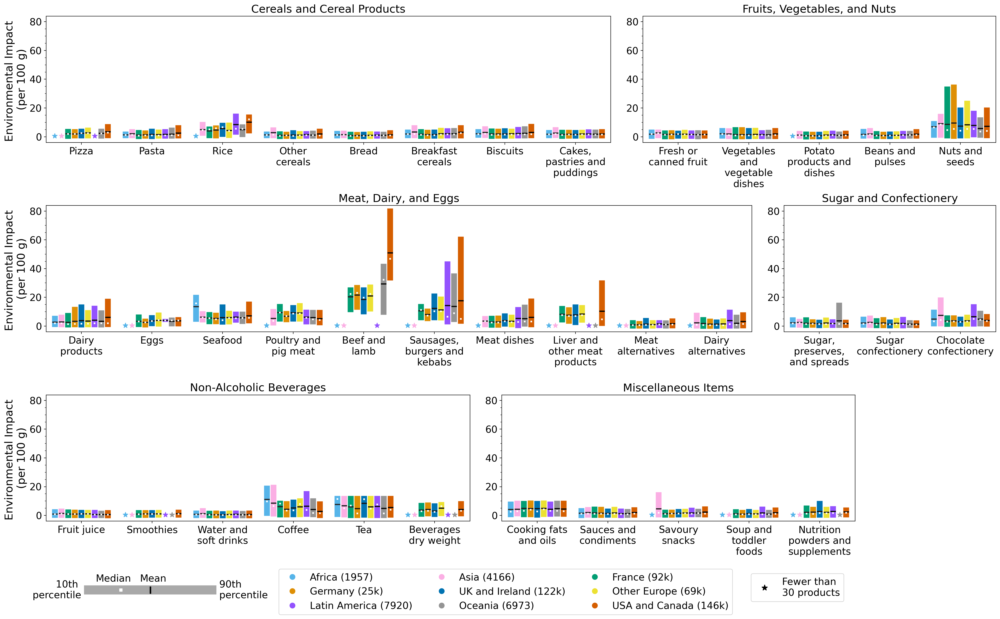

In [63]:
### order
groups = ['Cereals and Cereal Products', 'Fruits, Vegetables, and Nuts',
          'Meat, Dairy, and Eggs', 'Sugar and Confectionery', 
          'Non-Alcoholic Beverages', 'Miscellaneous Items']

countries_order = ['Africa', 'Asia', 'France', 'Germany', 'UK and Ireland',
                   'Other Europe', 'Latin America', 'Oceania',
                   'USA and Canada']

# n rows
groups_split = np.array_split(groups, 3)

fig = plt.figure(figsize=(28, 15))

# outer GridSpec with 3 rows
# defining a second column as the last row has fewer categories than the first 2 
outer_gs = GridSpec(
    nrows=3, ncols=2,
    width_ratios=[11.5, 2],  
    height_ratios=[1, 1, 1],
    wspace=0, hspace=0.5
)

master_ax = None

def wrap_tick_labels(ax, width=10):
    labels = ax.get_xticklabels()
    ticks = ax.get_xticks()  
    ax.set_xticks(ticks)
    wrapped_labels = []
    for lbl in labels:
        # textwrap.fill wraps the string to the given width
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_xticklabels(wrapped_labels, rotation=0)

for row_idx, row_groups in enumerate(groups_split):
    
    # For each row, compute width ratios based on the number of labels per group
    width_ratios = []
    for grp in row_groups:
        n_labels = len(order_df[order_df['groups'] == grp]['labels'].unique())
        width_ratios.append(n_labels)
    
    # subgridspec for this row
    if row_idx!=2:
        inner_gs = outer_gs[row_idx, :].subgridspec(
            1, len(row_groups),
            width_ratios=width_ratios,
            wspace=0.07
        )
    else:
        inner_gs = outer_gs[row_idx, 0].subgridspec(
            1, len(row_groups),
            width_ratios=width_ratios,
            wspace=0.082
        )
    
    for col_idx, grp in enumerate(row_groups):
        # If we haven't assigned a master axis yet, do so now.
        if master_ax is None:
            ax = fig.add_subplot(inner_gs[col_idx])
            master_ax = ax   
        else:
            # sharey=master_ax ensures all subplots share the same y-scale
            ax = fig.add_subplot(inner_gs[col_idx], 
                                 sharey=master_ax
                                )
        
        # Subset data for this group
        data = df_plot[
            (df_plot['groups'] == grp)
        ]
         
        # Determine the x-label order for this group
        order = order_df[order_df['groups'] == grp].sort_values(by='ID')['labels'].values
        dodge = 0.75
        palette = sns.color_palette(["#56b4e9", "#fbafe4", "#029e73", "#de8f05", "#0173b2", "#ece133", 
                                         #"#cc78bc", 
                                         "#9352fe",  "#949494", "#d55e00", #"#d7a377"
                                        ])
        country_colors = dict(zip(countries_order, palette))
        
        
        sns.pointplot(
            x='labels',
            y='mean_norm_agg',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            capsize=0,
            errorbar=('pi', 80),
            err_kws={'linewidth': 9.5},
            markers=".",
            markersize=5,
            linestyles='none',
            dodge=dodge,
            palette = palette,
            ax=ax
        )

        # adding this for eggs in latin america - since its a single point it was not visible - so adding a flat line for means in original colors
        sns.pointplot(
            x='labels',
            y='mean_norm_agg',
            estimator='mean',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            errorbar=None,
            markers="_",
            markersize=9,
            markeredgewidth=5,
            linestyles='none',
            dodge=dodge,
            ax=ax,
            palette=palette,
            legend=False
        )

        sns.pointplot(
            x='labels',
            y='mean_norm_agg',
            estimator='mean',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            errorbar=None,
            markers="_",
            markersize=9,
            markeredgewidth=2,
            linestyles='none',
            dodge=dodge,
            ax=ax,
            palette='dark:black',
            legend=False
        )

        sns.pointplot(
            x='labels',
            y='mean_norm_agg',
            estimator='median',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            errorbar=None,
            markers="s",
            markersize=1,
            markeredgewidth=2,
            linestyles='none',
            dodge=dodge,
            ax=ax,
            palette=sns.color_palette(["white"] * 9),
            legend=False
        )

        # to ensure same margins irrespective of widths
        ax.set_xlim(-0.5, len(order) - 0.5)

        # add symbols for missing bars 
        for i, label_i in enumerate(order):
            for j, country_j in enumerate(countries_order):
                # Check if there is data
                subset = data[(data['labels'] == label_i) & (data['country'] == country_j)]
                if subset.empty:
                    d = dodge + 0.1
                    x_coord = i - d/2 + d/(2*len(countries_order)) + (j * d/len(countries_order))  
                    y_coord = 0.5         
                    ax.scatter(
                        [x_coord], [y_coord],
                        color=country_colors[country_j],
                        marker="*",
                        s=70
                    )
        
        # Remove the subplot legend
        if ax.get_legend() is not None:
            ax.get_legend().remove()
        
        # Wrap x-axis labels
        wrap_tick_labels(ax, width=12)

        # tick label font size
        ax.tick_params(axis='both', which='major', labelsize=16)
        # Enable minor ticks on the y-axis
        ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
        # Style the minor ticks (shorter length, no labels)
        ax.tick_params(axis='y', which='minor', length=2, labelsize=0)
        
        # Clear x-axis label text, keep the subplot title
        ax.set_xlabel("")
        ax.set_title(grp, fontsize=18)
        
        # Only set y-label on the leftmost subplot in each row
        if col_idx == 0:
            ax.set_ylabel("Environmental Impact \n(per 100 g)", fontsize=18)
        else:
            ax.set_ylabel("")

# legend
reorder=lambda hl,nc:(sum((lis[i::nc]for i in range(nc)),[])for lis in hl)
handles_labels = master_ax.get_legend_handles_labels()

def short_num(n):
    if n >= 10000:
        return f"{round(n/1000)}k"
    else:
        return str(n)

handles_labels = (handles_labels[0], [f'{c} ({short_num(len(df_plot[df_plot['country']==c]))})' for c in handles_labels[1]])

fig.legend(
    *reorder(handles_labels, 3),
    fontsize=16,
    markerscale=3,
    loc='lower center',
    bbox_to_anchor=(0.5, -0.04),
    ncol=3
)

# legend for fewer than 30 products
missing_handle = matplotlib.lines.Line2D(
    [], [], color="black", marker="*", linestyle="None",
    markersize=10, label="Missing"
)

fig.legend(
    [missing_handle],
    ["Fewer than \n30 products"], fontsize=16,
    loc="lower right",  
    bbox_to_anchor=(0.78, -0.02)
)

# legend for bar style
leg_ax = fig.add_axes([0.15, -0.02, 0.12, 0.05])  #[left, bottom, width, height] 
leg_ax.set_xlim(0, 1)
leg_ax.set_ylim(0, 1)

# draw the grey 10th–90th percentile bar
leg_ax.hlines(
    y=0.5,
    xmin=0.05,
    xmax=0.95,
    colors='darkgrey',
    linewidth=15
)

# draw the mean line
leg_ax.vlines(
    x=0.5,
    ymin=0.39,
    ymax=0.61,
    colors='black',
    linewidth=2.5
)

# draw the median square
leg_ax.scatter(
    [0.3],
    [0.5],
    marker='s',
    s=20,
    color='white',
    zorder=3
)

# label the ends and the markers
leg_ax.text(
    0.03, 0.5, '10th \npercentile',
    va='center', ha='right', fontsize=16
)
leg_ax.text(
    0.97, 0.5, '90th \npercentile',
    va='center', ha='left', fontsize=16
)
leg_ax.text(
    0.43, 0.7, 'Mean',
    va='bottom', ha='left', fontsize=16
)
leg_ax.text(
    0.37, 0.7, 'Median',
    va='bottom', ha='right', fontsize=16
)
leg_ax.axis('off') # turn off all spines/ticks for the legend axes

plt.savefig('../../Product impacts paper/figures/main_fig.jpg', bbox_inches='tight', dpi=300)
plt.show()

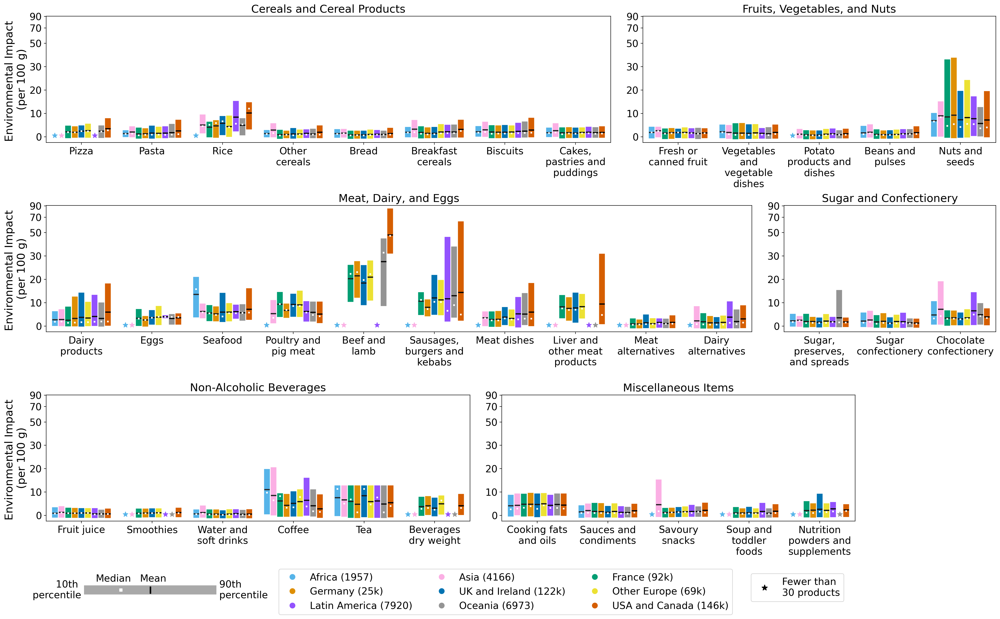

In [64]:
### order
groups = ['Cereals and Cereal Products', 'Fruits, Vegetables, and Nuts',
          'Meat, Dairy, and Eggs', 'Sugar and Confectionery', 
          'Non-Alcoholic Beverages', 'Miscellaneous Items']

countries_order = ['Africa', 'Asia', 'France', 'Germany', 'UK and Ireland',
                   'Other Europe', 'Latin America', 'Oceania',
                   'USA and Canada']

# n rows
groups_split = np.array_split(groups, 3)

fig = plt.figure(figsize=(28, 15))

# outer GridSpec with 3 rows
# defining a second column as the last row has fewer categories than the first 2 
outer_gs = GridSpec(
    nrows=3, ncols=2,
    width_ratios=[11.5, 2],  
    height_ratios=[1, 1, 1],
    wspace=0, hspace=0.5
)

master_ax = None

def wrap_tick_labels(ax, width=10):
    labels = ax.get_xticklabels()
    ticks = ax.get_xticks()  
    ax.set_xticks(ticks)
    wrapped_labels = []
    for lbl in labels:
        # textwrap.fill wraps the string to the given width
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_xticklabels(wrapped_labels, rotation=0)

for row_idx, row_groups in enumerate(groups_split):
    
    # For each row, compute width ratios based on the number of labels per group
    width_ratios = []
    for grp in row_groups:
        n_labels = len(order_df[order_df['groups'] == grp]['labels'].unique())
        width_ratios.append(n_labels)
    
    # subgridspec for this row
    if row_idx!=2:
        inner_gs = outer_gs[row_idx, :].subgridspec(
            1, len(row_groups),
            width_ratios=width_ratios,
            wspace=0.07
        )
    else:
        inner_gs = outer_gs[row_idx, 0].subgridspec(
            1, len(row_groups),
            width_ratios=width_ratios,
            wspace=0.082
        )
    
    for col_idx, grp in enumerate(row_groups):
        # If we haven't assigned a master axis yet, do so now.
        if master_ax is None:
            ax = fig.add_subplot(inner_gs[col_idx])
            master_ax = ax
            # master_ax.set_yscale('log')
            master_ax.set_yscale('symlog', linthresh=30, linscale=0.6)
            major_ticks = [0, 10, 20, 30, 50, 70, 90]
            master_ax.yaxis.set_major_locator(ticker.FixedLocator(major_ticks))
            master_ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: f"{y:g}"))
            master_ax.minorticks_off()         
        else:
            # sharey=master_ax ensures all subplots share the same y-scale
            ax = fig.add_subplot(inner_gs[col_idx], 
                                 sharey=master_ax
                                )
        
        # Subset data for this group
        data = df_plot[
            (df_plot['groups'] == grp)
        ]
         
        # Determine the x-label order for this group
        order = order_df[order_df['groups'] == grp].sort_values(by='ID')['labels'].values
        dodge = 0.75
        palette = sns.color_palette(["#56b4e9", "#fbafe4", "#029e73", "#de8f05", "#0173b2", "#ece133", 
                                         #"#cc78bc", 
                                         "#9352fe",  "#949494", "#d55e00", #"#d7a377"
                                        ])
        country_colors = dict(zip(countries_order, palette))
        
        
        sns.pointplot(
            x='labels',
            y='mean_norm_agg',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            capsize=0,
            errorbar=('pi', 80),
            err_kws={'linewidth': 9.5},
            markers=".",
            markersize=5,
            linestyles='none',
            dodge=dodge,
            palette = palette,
            ax=ax
        )

        # adding this for eggs in latin america - since its a single point it was not visible - so adding a flat line for means in original colors
        sns.pointplot(
            x='labels',
            y='mean_norm_agg',
            estimator='mean',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            errorbar=None,
            markers="_",
            markersize=9,
            markeredgewidth=5,
            linestyles='none',
            dodge=dodge,
            ax=ax,
            palette=palette,
            legend=False
        )

        sns.pointplot(
            x='labels',
            y='mean_norm_agg',
            estimator='mean',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            errorbar=None,
            markers="_",
            markersize=9,
            markeredgewidth=2,
            linestyles='none',
            dodge=dodge,
            ax=ax,
            palette='dark:black',
            legend=False
        )

        sns.pointplot(
            x='labels',
            y='mean_norm_agg',
            estimator='median',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            errorbar=None,
            markers="s",
            markersize=1,
            markeredgewidth=2,
            linestyles='none',
            dodge=dodge,
            ax=ax,
            palette=sns.color_palette(["white"] * 9),
            legend=False
        )

        # to ensure same margins irrespective of widths
        ax.set_xlim(-0.5, len(order) - 0.5)

        # add symbols for missing bars 
        for i, label_i in enumerate(order):
            for j, country_j in enumerate(countries_order):
                # Check if there is data
                subset = data[(data['labels'] == label_i) & (data['country'] == country_j)]
                if subset.empty:
                    d = dodge + 0.1
                    x_coord = i - d/2 + d/(2*len(countries_order)) + (j * d/len(countries_order))  
                    y_coord = 0.5         
                    ax.scatter(
                        [x_coord], [y_coord],
                        color=country_colors[country_j],
                        marker="*",
                        s=70
                    )
        
        # Remove the subplot legend
        if ax.get_legend() is not None:
            ax.get_legend().remove()
        
        # Wrap x-axis labels
        wrap_tick_labels(ax, width=12)

        # tick label font size
        ax.tick_params(axis='both', which='major', labelsize=16) 
        
        # Clear x-axis label text, keep the subplot title
        ax.set_xlabel("")
        ax.set_title(grp, fontsize=18)
        
        # Only set y-label on the leftmost subplot in each row
        if col_idx == 0:
            ax.set_ylabel("Environmental Impact \n(per 100 g)", fontsize=18)
        else:
            ax.set_ylabel("")

# legend
reorder=lambda hl,nc:(sum((lis[i::nc]for i in range(nc)),[])for lis in hl)
handles_labels = master_ax.get_legend_handles_labels()

def short_num(n):
    if n >= 10000:
        return f"{round(n/1000)}k"
    else:
        return str(n)

handles_labels = (handles_labels[0], [f'{c} ({short_num(len(df_plot[df_plot['country']==c]))})' for c in handles_labels[1]])

fig.legend(
    *reorder(handles_labels, 3),
    fontsize=16,
    markerscale=3,
    loc='lower center',
    bbox_to_anchor=(0.5, -0.04),
    ncol=3
)

# legend for fewer than 30 products
missing_handle = matplotlib.lines.Line2D(
    [], [], color="black", marker="*", linestyle="None",
    markersize=10, label="Missing"
)

fig.legend(
    [missing_handle],
    ["Fewer than \n30 products"], fontsize=16,
    loc="lower right",  
    bbox_to_anchor=(0.78, -0.02)
)

# legend for bar style
leg_ax = fig.add_axes([0.15, -0.02, 0.12, 0.05])  #[left, bottom, width, height] 
leg_ax.set_xlim(0, 1)
leg_ax.set_ylim(0, 1)

# draw the grey 10th–90th percentile bar
leg_ax.hlines(
    y=0.5,
    xmin=0.05,
    xmax=0.95,
    colors='darkgrey',
    linewidth=15
)

# draw the mean line
leg_ax.vlines(
    x=0.5,
    ymin=0.39,
    ymax=0.61,
    colors='black',
    linewidth=2.5
)

# draw the median square
leg_ax.scatter(
    [0.3],
    [0.5],
    marker='s',
    s=20,
    color='white',
    zorder=3
)

# label the ends and the markers
leg_ax.text(
    0.03, 0.5, '10th \npercentile',
    va='center', ha='right', fontsize=16
)
leg_ax.text(
    0.97, 0.5, '90th \npercentile',
    va='center', ha='left', fontsize=16
)
leg_ax.text(
    0.43, 0.7, 'Mean',
    va='bottom', ha='left', fontsize=16
)
leg_ax.text(
    0.37, 0.7, 'Median',
    va='bottom', ha='right', fontsize=16
)
leg_ax.axis('off') # turn off all spines/ticks for the legend axes

plt.savefig('../../Product impacts paper/figures/main_fig_log.jpg', bbox_inches='tight', dpi=300)
plt.show()

#### deep dive into raw scores (not normalized)

In [65]:
# Melt the aggregated dataframe to long format for seaborn
melted_df = impacts.melt(
    id_vars=['country', 'groups', 'labels', 'ID', 'product_id'],
    value_vars=[f"mean_{score}" for score in score_columns],
    var_name='score',
    value_name='mean'
)

# Extract the score name
melted_df['score'] = melted_df['score'].str.replace('_mean', '')
melted_df['score'] = melted_df['score'].str.replace('mean_', '')

In [66]:
df_plot = melted_df.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
                          right_on='Country').drop('Country', axis=1)
df_plot.loc[df_plot['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
df_plot.loc[df_plot['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

df_plot.loc[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df_plot[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

df_plot.loc[df_plot['country'].isin(['Americas']), 'country'] = 'Latin America'
df_plot.loc[df_plot['country'].isin(['Europe']), 'country'] = 'Other Europe'

# remove category-country combinations when number of products is less than 30 - removes about 100 products
df = df_plot.groupby(['country', 'labels'])[['product_id']].nunique().reset_index()
df_plot = df_plot[~df_plot['product_id'].isin(df_plot.merge(df[df['product_id']<30][['country', 'labels']])['product_id'].unique())]

# remove asia, africa, latam, oceania
df_plot = df_plot[~df_plot['country'].isin(['Africa', 'Asia', 'Latin America', 'Oceania'])]

/var/folders/hz/lt88gkws0n58xdkp66k3nk340000gn/T/ipykernel_83794/3666732443.py:232: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(h_pad=1.8, w_pad=1.4


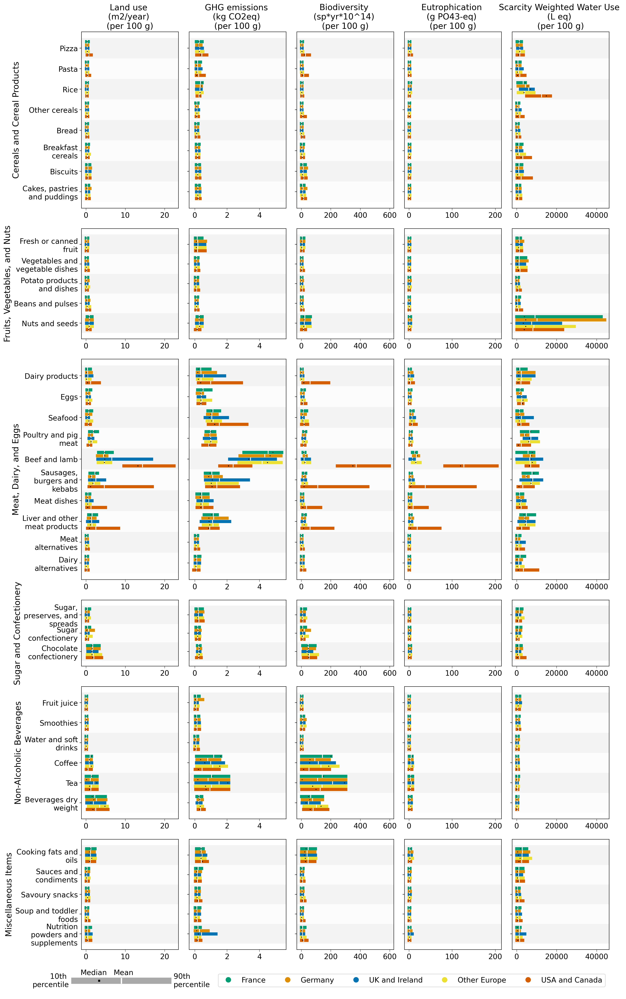

In [67]:
def wrap_tick_labels(ax, width=10):
    labels = ax.get_yticklabels()
    ticks = ax.get_yticks()  
    ax.set_yticks(ticks)
    wrapped_labels = []
    for lbl in labels:
        # textwrap.fill wraps the string to the given width
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_yticklabels(wrapped_labels)

groups_list = ['Cereals and Cereal Products', 'Fruits, Vegetables, and Nuts',
               'Meat, Dairy, and Eggs', 'Sugar and Confectionery', 
               'Non-Alcoholic Beverages', 'Miscellaneous Items']
scores_list = ['Land', 'GHG', 'Biodiversity', 'Eut', 'WatScar']

scores_dict = {'Land': "Land use \n(m2/year) \n(per 100 g)", 
               'GHG': "GHG emissions \n(kg CO2eq) \n(per 100 g)", 
               'Biodiversity': "Biodiversity \n(sp*yr*10^14) \n(per 100 g)", 
               'Eut': "Eutrophication \n(g PO43-eq) \n(per 100 g)", 
               'WatScar': "Scarcity Weighted Water Use \n(L eq) \n(per 100 g)"}

facet_counts = {}
for group in groups_list:
    for score in scores_list:
        data_sub = df_plot[(df_plot['groups'] == group) & (df_plot['score'] == score)]
        count = data_sub['labels'].nunique() 
        facet_counts[(group, score)] = count
        
inch_per_label = 0.7  
row_heights = []
for group in groups_list:
    max_count = max(facet_counts[(group, score)] for score in scores_list)
    row_heights.append(max_count * inch_per_label)

fig_width = len(scores_list) * 3.3 
fig_height = sum(row_heights)

fig = plt.figure(figsize=(fig_width, fig_height))
gs = GridSpec(nrows=len(groups_list), ncols=len(scores_list),
                       height_ratios=row_heights)

legend_handles = None

for j, score in enumerate(scores_list):
    master_ax = None
    for i, group in enumerate(groups_list):
        if master_ax is None:
            ax = fig.add_subplot(gs[i, j])
            master_ax = ax
        else:
            # sharex=master_ax ensures all subplots share the same y-scale
            ax = fig.add_subplot(gs[i, j], 
                                 sharex=master_ax
                                )
        # Filter data for this facet.
        data = df_plot[
            (df_plot['score'] == score) &
            (df_plot['groups'] == group)
        ]

        # Determine the x-label order for this group
        order = order_df[order_df['groups'] == group].sort_values(by='ID')['labels'].values
        
        # Plot with barplot
        sns.pointplot(
            y='labels',
            x='mean',
            hue='country',
            hue_order=['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'],
            data=data,
            order=order,  
            capsize=0,
            errorbar=('pi', 80),
            err_kws={'linewidth': 6},
            markers=".",
            linestyles='none',
            dodge=0.65,
            palette=sns.color_palette(["#029e73", "#de8f05", "#0173b2", "#ece133", "#d55e00"]),
            ax=ax
        )

        sns.pointplot(
            y='labels',
            x='mean',
            estimator='mean',
            hue='country',
            hue_order=['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'],
            data=data,
            order=order,  
            errorbar=None,
            markers="|",
            markersize=6,
            markeredgewidth=1.5,
            linestyles='none',
            dodge=0.65,
            ax=ax,
            palette=sns.color_palette(["white"] * 5),
            legend=False
        )

        sns.pointplot(
            y='labels',
            x='mean',
            estimator='median',
            hue='country',
            hue_order=['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'],
            data=data,
            order=order,  
            errorbar=None,
            markers="s",
            markersize=1,
            markeredgewidth=1,
            linestyles='none',
            dodge=0.65,
            ax=ax,
            palette='dark:black',
            legend=False
        )

        # Remove the subplot legend
        if ax.get_legend() is not None:
            ax.get_legend().remove()
        
        # Wrap y-axis labels
        wrap_tick_labels(ax, width=16)
        ax.tick_params(axis='both', which='major', labelsize=14)
        
        ax.tick_params(axis='x', which='major', bottom=True, top=False, length=4, width=0.5)
        ax.tick_params(axis='y', which='major', left=True, right=False)
        ax.set_xlabel("")
        if i == 0:
            ax.set_title(scores_dict[score], fontsize=16)
        if j==0:
            ax.set_ylabel(group, fontsize=16)
        else:
            ax.set_ylabel("")
            ax.set_yticklabels("")

        # add alternating row background shading (very subtle)
        yticks = ax.get_yticks()
        if len(yticks) > 1:
            # estimate half-distance between categories
            step = yticks[1] - yticks[0]
            for i, y in enumerate(yticks):
                if i % 2 == 0:
                    ax.axhspan(
                        y - step / 2,
                        y + step / 2,
                        facecolor='lightgrey',
                        alpha=0.25,
                        zorder=0,
                        clip_on=True
                    )
                else:
                    ax.axhspan(
                        y - step / 2,
                        y + step / 2,
                        facecolor='lightgrey',
                        alpha=0.05,
                        zorder=0,
                        clip_on=True
                    )

        if legend_handles is None:
            handles, labels = ax.get_legend_handles_labels()
            legend_handles = (handles, labels)

        # to ensure same margins irrespective of widths
        ax.set_ylim(len(order) - 1 + 0.8, -0.8)


handles, leg_labels = legend_handles
# Place the legend below all subplots.
fig.legend(handles, leg_labels, title="", loc="lower center",
           fontsize=14, ncol=5, bbox_to_anchor=(0.67, -0.025),
           markerscale=2.5)

# legend for bar style
leg_ax = fig.add_axes([0.11, -0.03, 0.18, 0.03])  #[left, bottom, width, height] 
leg_ax.set_xlim(0, 1)
leg_ax.set_ylim(0, 1)

# draw the grey 10th–90th percentile bar
leg_ax.hlines(
    y=0.5,
    xmin=0.05,
    xmax=0.95,
    colors='darkgrey',
    linewidth=12
)

# draw the mean line
leg_ax.vlines(
    x=0.5,
    ymin=0.40,
    ymax=0.60,
    colors='white',
    linewidth=2.5
)

# draw the median square
leg_ax.scatter(
    [0.3],
    [0.5],
    marker='s',
    s=10,
    color='black',
    zorder=3
)

# label the ends and the markers
leg_ax.text(
    0.03, 0.5, '10th \npercentile',
    va='center', ha='right', fontsize=14
)
leg_ax.text(
    0.97, 0.5, '90th \npercentile',
    va='center', ha='left', fontsize=14
)
leg_ax.text(
    0.43, 0.65, 'Mean',
    va='bottom', ha='left', fontsize=14
)
leg_ax.text(
    0.37, 0.65, 'Median',
    va='bottom', ha='right', fontsize=14
)
leg_ax.axis('off') # turn off all spines/ticks for the legend axes


# Adjust layout
plt.tight_layout(h_pad=1.8, w_pad=1.4
                )

plt.savefig('../../Product impacts paper/figures/deep_dive.jpg', bbox_inches='tight', dpi=300)
plt.show()

/var/folders/hz/lt88gkws0n58xdkp66k3nk340000gn/T/ipykernel_83794/1358549166.py:209: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(w_pad=2, h_pad=0)


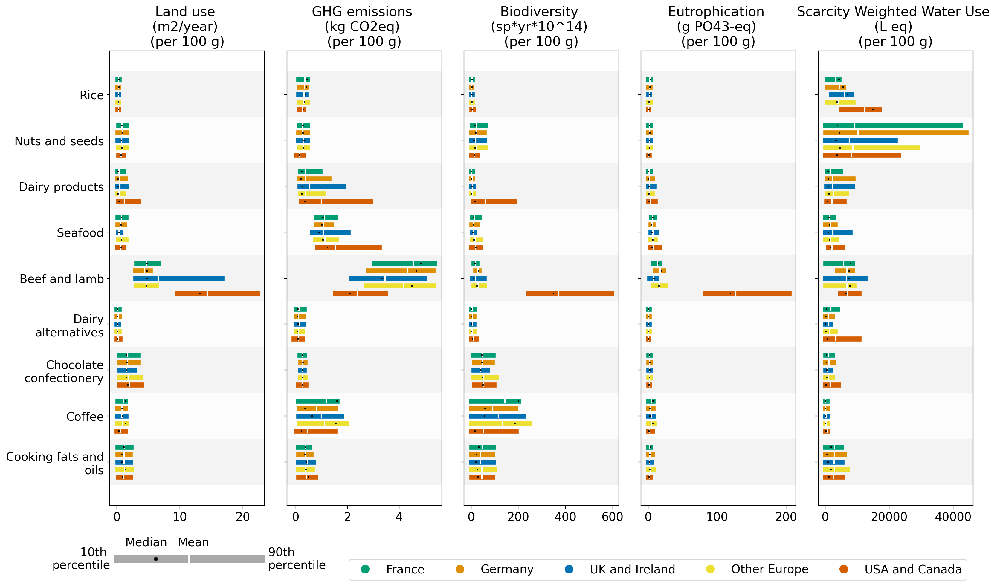

In [68]:
def wrap_tick_labels(ax, width=10):
    labels = ax.get_yticklabels()
    ticks = ax.get_yticks()  
    ax.set_yticks(ticks)
    wrapped_labels = []
    for lbl in labels:
        # textwrap.fill wraps the string to the given width
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_yticklabels(wrapped_labels)

# Subset of labels
subset_labels = ["Rice", "Nuts and seeds", 
                 'Dairy products', "Seafood", 
                 "Beef and lamb", "Dairy alternatives",
                 "Chocolate confectionery", "Coffee", 
                 "Cooking fats and oils"]

scores_list = ['Land', 'GHG', 'Biodiversity', 'Eut', 'WatScar']
scores_dict = {'Land': "Land use \n(m2/year) \n(per 100 g)", 
               'GHG': "GHG emissions \n(kg CO2eq) \n(per 100 g)", 
               'Biodiversity': "Biodiversity \n(sp*yr*10^14) \n(per 100 g)", 
               'Eut': "Eutrophication \n(g PO43-eq) \n(per 100 g)", 
               'WatScar': "Scarcity Weighted Water Use \n(L eq) \n(per 100 g)"}

fig, axes = plt.subplots(1, len(scores_list), figsize=(5*3.3, 1*len(subset_labels)), sharey=True)
legend_handles = None

# color palette for the countries
palette = sns.color_palette(["#029e73", "#de8f05", "#0173b2", "#ece133", "#d55e00"])
hue_order = ['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada']

for i, score in enumerate(scores_list):
    ax = axes[i]
    
    # data for this score and the desired labels
    data = df_plot[
        (df_plot['score'] == score) &
        (df_plot['labels'].isin(subset_labels))
    ].copy()
    
    order = subset_labels
    
    # First pointplot with error bars
    sns.pointplot(
        y='labels',
        x='mean',
        hue='country',
        hue_order=hue_order,
        data=data,
        order=order,
        capsize=0,
        errorbar=('pi', 80),
        err_kws={'linewidth': 6},
        markers=".",
        linestyles='none',
        dodge=0.65,
        palette=palette,
        ax=ax
    )

    # Second pointplot for the mean (white markers)
    sns.pointplot(
        y='labels',
        x='mean',
        estimator='mean',
        hue='country',
        hue_order=hue_order,
        data=data,
        order=order,
        errorbar=None,
        markers="|",
        markersize=6,
        markeredgewidth=1.5,
        linestyles='none',
        dodge=0.65,
        palette=["white"] * 5,
        ax=ax,
        legend=False
    )

    # Third pointplot for the median (dark square markers)
    sns.pointplot(
        y='labels',
        x='mean',
        estimator='median',
        hue='country',
        hue_order=hue_order,
        data=data,
        order=order,
        errorbar=None,
        markers="s",
        markersize=1,
        markeredgewidth=1,
        linestyles='none',
        dodge=0.65,
        palette=['black'] * 5,
        ax=ax,
        legend=False
    )
    
    # Remove extra legend on each axis
    if ax.get_legend() is not None:
        ax.get_legend().remove()

    # Axis labeling
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.tick_params(axis='x', which='major', bottom=True, top=False, length=4, width=0.5)
    ax.tick_params(axis='y', which='major', left=True, right=False)
    
    if i == 0:
        # Wrap y-axis labels
        wrap_tick_labels(ax, width=16)
        ax.tick_params(axis='y', labelleft=True)
    else:
        ax.tick_params(axis='y', labelleft=False)

    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.set_title(scores_dict[score], fontsize=16)
    
    # legend
    if (legend_handles is None) and (i == 0):
        handles, labels = ax.get_legend_handles_labels()
        legend_handles = (handles, labels)

    # add alternating row background shading (very subtle)
    yticks = ax.get_yticks()
    if len(yticks) > 1:
        # estimate half-distance between categories
        step = yticks[1] - yticks[0]
        for i, y in enumerate(yticks):
            if i % 2 == 0:
                ax.axhspan(
                    y - step / 2,
                    y + step / 2,
                    facecolor='lightgrey',
                    alpha=0.25,
                    zorder=0,
                    clip_on=True
                )
            else:
                    ax.axhspan(
                        y - step / 2,
                        y + step / 2,
                        facecolor='lightgrey',
                        alpha=0.05,
                        zorder=0,
                        clip_on=True
                    )

if legend_handles is not None:
    handles, leg_labels = legend_handles
    fig.legend(handles, leg_labels, title="", loc="lower center",
               fontsize=14, ncol=5, bbox_to_anchor=(0.67, -0.1),
               markerscale=2.5)

# legend for bar style
leg_ax = fig.add_axes([0.11, -0.075, 0.17, 0.05])  #[left, bottom, width, height] 
leg_ax.set_xlim(0, 1)
leg_ax.set_ylim(0, 1)

# draw the grey 10th–90th percentile bar
leg_ax.hlines(
    y=0.5,
    xmin=0.05,
    xmax=0.95,
    colors='darkgrey',
    linewidth=10
)

# draw the mean line
leg_ax.vlines(
    x=0.5,
    ymin=0.25,
    ymax=0.75,
    colors='white',
    linewidth=2.5
)

# draw the median square
leg_ax.scatter(
    [0.3],
    [0.5],
    marker='s',
    s=10,
    color='black',
    zorder=3
)

# label the ends and the markers
leg_ax.text(
    0.03, 0.5, '10th \npercentile',
    va='center', ha='right', fontsize=14
)
leg_ax.text(
    0.97, 0.5, '90th \npercentile',
    va='center', ha='left', fontsize=14
)
leg_ax.text(
    0.43, 0.9, 'Mean',
    va='bottom', ha='left', fontsize=14
)
leg_ax.text(
    0.37, 0.9, 'Median',
    va='bottom', ha='right', fontsize=14
)
leg_ax.axis('off') # turn off all spines/ticks for the legend axes

plt.tight_layout(w_pad=2, h_pad=0)

plt.savefig('../../Product impacts paper/figures/deep_dive_few_cats.jpg', bbox_inches='tight', dpi=300)
plt.show()

In [69]:
# Subset of labels
subset_labels = ["Rice", "Nuts and seeds", 
                 'Dairy products', "Seafood", 
                 "Beef and lamb", "Dairy alternatives",
                 "Chocolate confectionery", "Coffee", 
                 "Cooking fats and oils"]

df_plot = impacts[['country', 'groups', 'labels', 'ID', 'product_id', 'mean_Land', 'mean_GHG', 
                   'mean_Biodiversity', 'mean_Eut', 'mean_WatScar']]
df_plot = df_plot.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
                        right_on='Country').drop('Country', axis=1)
df_plot.loc[df_plot['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
df_plot.loc[df_plot['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

df_plot.loc[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df_plot[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

df_plot.loc[df_plot['country'].isin(['Americas']), 'country'] = 'Latin America'
df_plot.loc[df_plot['country'].isin(['Europe']), 'country'] = 'Other Europe'

# remove category-country combinations when number of products is less than 30 - removes about 100 products
df = df_plot.groupby(['country', 'labels'])[['product_id']].nunique().reset_index()
df_plot = df_plot[~df_plot['product_id'].isin(df_plot.merge(df[df['product_id']<30][['country', 'labels']])['product_id'].unique())]

df_plot = df_plot[df_plot['labels'].isin(subset_labels)]
df_plot = df_plot.groupby('labels').apply(lambda g: g.sample(100)).reset_index(drop=True)

/var/folders/hz/lt88gkws0n58xdkp66k3nk340000gn/T/ipykernel_83794/931979129.py:27: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_plot = df_plot.groupby('labels').apply(lambda g: g.sample(100)).reset_index(drop=True)


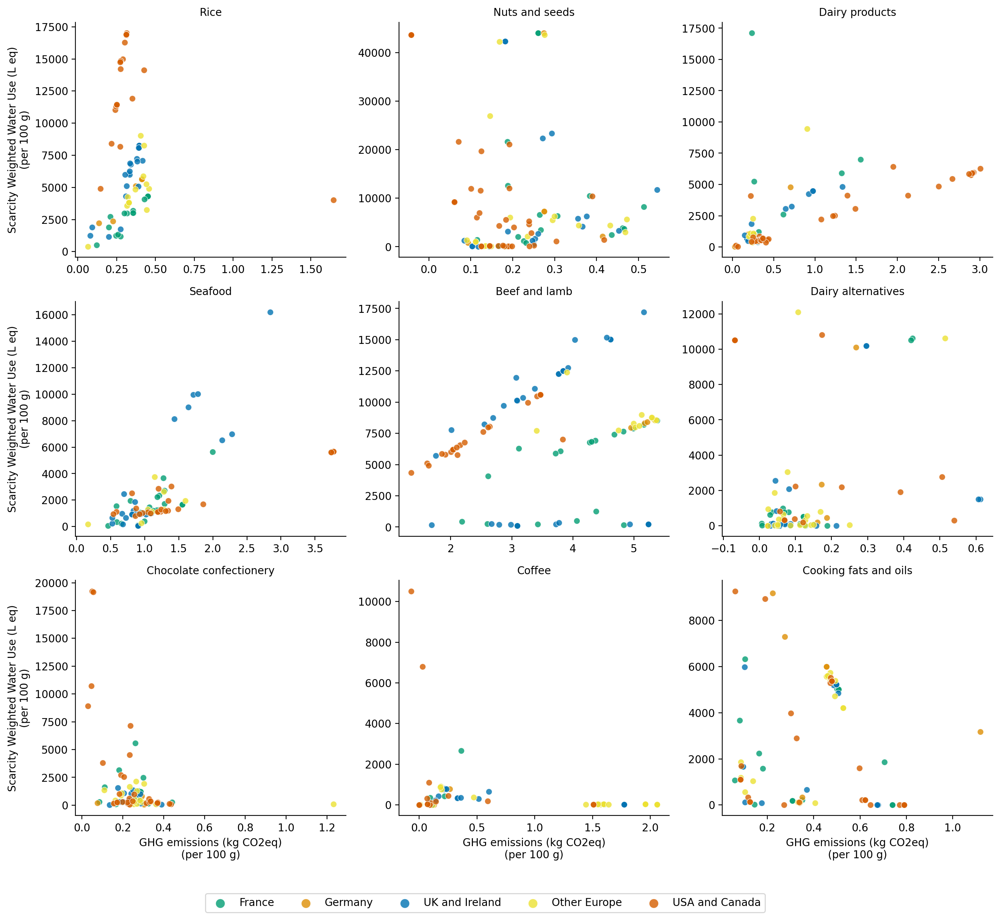

In [70]:
g = sns.FacetGrid(data=df_plot, 
                  col="labels", hue='country', 
                  col_order = subset_labels,
                  hue_order=['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'],
                  palette=sns.color_palette(["#029e73", "#de8f05", "#0173b2", "#ece133", "#d55e00"]),
                  height=3.8, aspect=1.2,
                  col_wrap=3, sharex=False, sharey=False)
g.map(sns.scatterplot, 'mean_GHG', 'mean_WatScar', s=35, alpha=0.8)

g.set_titles("{col_name}")
g.set_xlabels("GHG emissions (kg CO2eq)\n(per 100 g)", fontsize=10)
g.set_ylabels("Scarcity Weighted Water Use (L eq)\n(per 100 g)", fontsize=10)

g.add_legend(title='', ncol=5, bbox_to_anchor=(0.5, -0.05), frameon=True,
            markerscale=1.5)
    
plt.savefig('../../Product impacts paper/figures/deep_dive_few_prods.jpg', bbox_inches='tight', dpi=300)
plt.show()

#### zooming into specific categories - across more countries 

In [71]:
### BEEF

In [72]:
ids = impacts[impacts['labels'].isin(['Beef and lamb', 'Sausages, burgers and kebabs', 
                                      'Meat dishes', 
                                      'Liver and other meat products'
                                     ])]['product_id'].unique()
df_plot = impacts[(impacts['product_id'].isin(ids))
        & (impacts['product_id'].isin(composition[composition['Food_Category'].isin([
            'Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)'
        ])]['id'].unique()))]

df_plot = df_plot[['product_id', 'product_name', 'ingredients_text', 'country', 'store', 'groups', 'labels', 'ID', 'mean_norm_agg']]
composition_sub = composition[(composition['id'].isin(df_plot['product_id'].unique())) 
                              & (composition['Food_Category'].isin(['Bovine Meat (dairy herd)', 
                                                                    'Bovine Meat (beef herd)']))
].groupby(['id'])[['percent']].sum().reset_index()
df_plot = df_plot.merge(composition_sub, left_on='product_id', right_on='id').drop('id', axis=1)
df_plot = df_plot[df_plot['percent']>=10] #only looking at products with at least 10% beef

df_plot = df_plot.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
                          right_on='Country').drop('Country', axis=1)
df_plot.loc[df_plot['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
df_plot.loc[df_plot['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

df_plot.loc[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df_plot[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

df_plot.loc[df_plot['country'].isin(['Americas']), 'country'] = 'Latin America'
df_plot.loc[df_plot['country'].isin(['Europe']), 'country'] = 'Other Europe'

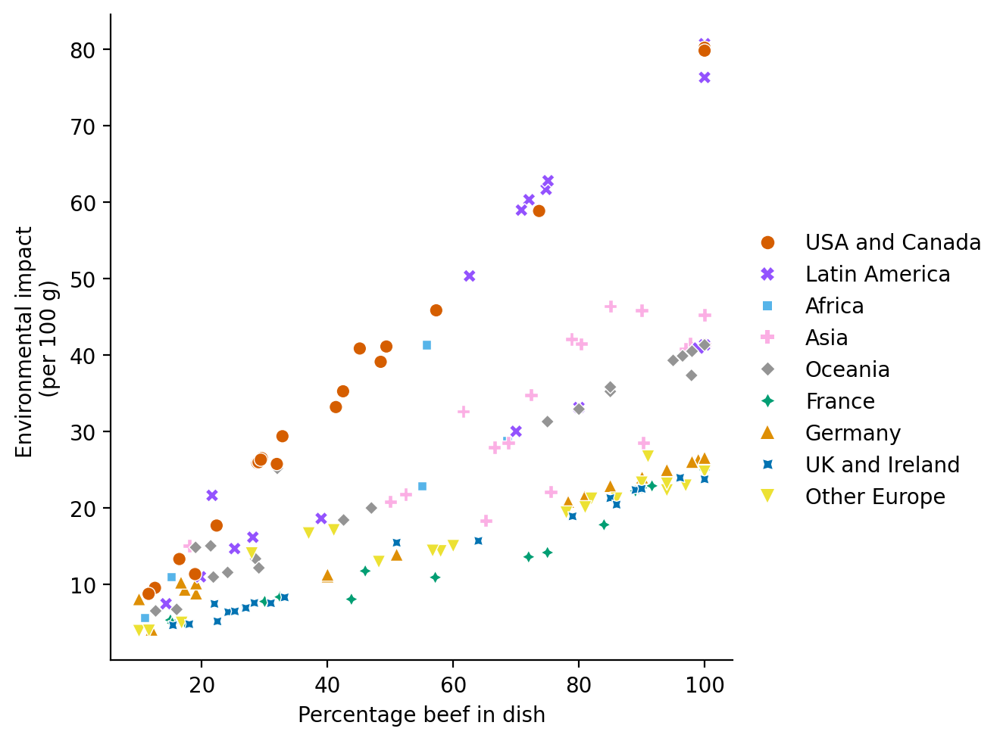

In [73]:
df_plot1 = df_plot[df_plot['country'].isin(['Africa', 'Asia'])] # as they have less than 20 obs
df_plot2 = df_plot[~df_plot['country'].isin(['Africa', 'Asia'])]
df_plot = pd.concat([df_plot1, df_plot2.groupby(['country']).sample(n=20, random_state=1)], axis=0, ignore_index=True)

g = sns.relplot(
    data=df_plot, x="percent", y="mean_norm_agg",
    hue="country", style='country',
    hue_order = ['USA and Canada', 'Latin America',
                 'Africa', 'Asia', 'Oceania',
                 'France', 'Germany', 'UK and Ireland', 'Other Europe'
                 ], 
    style_order = ['USA and Canada', 'Latin America',
                   'Africa', 'Asia', 'Oceania',
                   'France', 'Germany', 'UK and Ireland', 'Other Europe'
                   ], 
    kind="scatter", s=40, alpha=1,
    # palette=sns.color_palette("husl", df_plot['country'].nunique())
    palette = sns.color_palette(["#d55e00", "#9352fe", "#56b4e9", "#fbafe4", "#949494", 
                                 "#029e73", "#de8f05", "#0173b2", "#ece133"])
)
g.set(xlabel='Percentage beef in dish', ylabel='Environmental impact \n(per 100 g)')
if g._legend is not None:
    g._legend.set_title(None)  

plt.savefig('../../Product impacts paper/figures/beef.jpg', bbox_inches='tight', dpi=300)
plt.show()

In [74]:
### DAIRY - its not really possible to split dairy alt like this, but can just say in text that dairy alt in original chart contains 
            # all typles of prods like milk, cream, cheese, and all types of substitutes like oat, soy, almond 

In [75]:
df_plot = impacts[(impacts['labels']=='Dairy products') & (impacts['Shelf'].isin(
    ['Other milk', 'Other cheese', 'Ice cream',
    'Cream (including imitation cream)',
    'Reduced fat spread (polyunsaturated)', 'Yogurt', 'Cheddar cheese',
    'Cottage cheese', 'Butter',
    'Fromage frais and other dairy desserts',
    'Reduced fat spread (not polyunsaturated)',
    'Polyunsaturated low fat spread', 'Whole milk', '1% Milk',
    'Polyunsaturated margarine', 'Semi-skimmed milk', 'Infant formula',
    'Block margarine', 'Skimmed milk',
    'Soft margarine not polyunsaturated',
    'Low fat spread not polyunsaturated']
))]


df_plot.loc[df_plot['Shelf'].isin(['Cheddar cheese','Cottage cheese', 'Other cheese']), 'Shelf'] = 'Cheese'
df_plot.loc[df_plot['Shelf'].isin(['Whole milk', '1% Milk', 'Other milk', 
                                   'Semi-skimmed milk', 'Infant formula',
                                   'Skimmed milk']), 'Shelf'] = 'Milk'
df_plot.loc[df_plot['Shelf'].isin(['Yogurt', 'Ice cream', 'Fromage frais and other dairy desserts',
                                   'Cream (including imitation cream)']), 'Shelf'] = 'Yogurt, cream and ice cream'
df_plot.loc[df_plot['Shelf'].isin(['Butter', 'Reduced fat spread (polyunsaturated)', 
                                   'Reduced fat spread (not polyunsaturated)', 
                                   'Polyunsaturated low fat spread', 'Polyunsaturated margarine', 
                                   'Block margarine', 'Soft margarine not polyunsaturated', 
                                   'Low fat spread not polyunsaturated']), 'Shelf'] = 'Butter and spreads'

# some milk, cream etc wrongly categorized as cheese - remove for this visualization (note in paper, some 6k removed but from all countries not just the 6 from earlier)
ids = df_plot[(df_plot['Shelf']=='Cheese')]['product_id'].unique()
composition_sub = composition[(composition['id'].isin(ids)) 
                              & (composition['Food_Category'].isin(['Cheese']))]
df_plot.loc[(df_plot['Shelf']=='Cheese') & (~df_plot['product_id'].isin(composition_sub['id'].unique())), 'Shelf'] = 'mis'
df_plot = df_plot[df_plot['Shelf']!='mis']

df_plot = df_plot.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
                          right_on='Country').drop('Country', axis=1)
df_plot.loc[df_plot['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
df_plot.loc[df_plot['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

df_plot.loc[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df_plot[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

df_plot.loc[df_plot['country'].isin(['Americas']), 'country'] = 'Latin America'
df_plot.loc[df_plot['country'].isin(['Europe']), 'country'] = 'Other Europe'

# remove category-country combinations when number of products is less than 30 - removes about 100 products
df = df_plot.groupby(['country', 'Shelf'])[['product_id']].nunique().reset_index()
df_plot = df_plot[~df_plot['product_id'].isin(df_plot.merge(df[df['product_id']<30][['country', 'Shelf']])['product_id'].unique())]

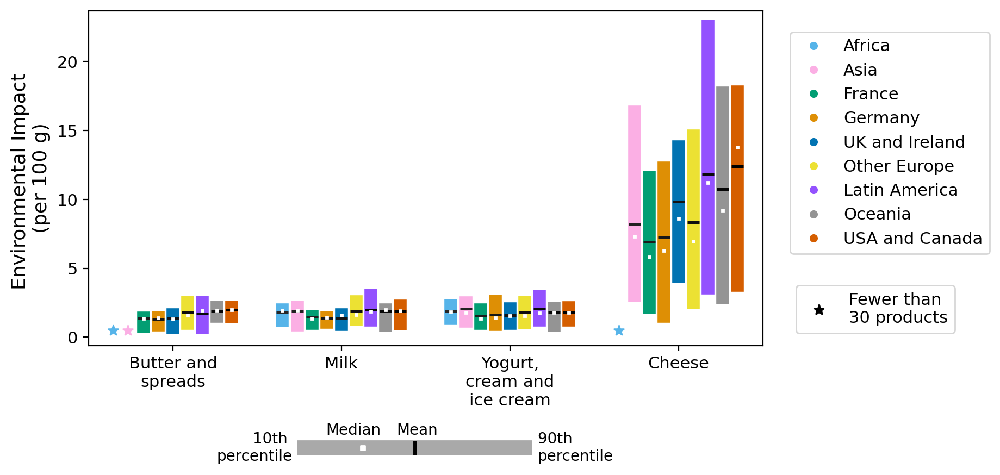

In [76]:
def wrap_tick_labels(ax, width=10):
    labels = ax.get_xticklabels()
    ticks = ax.get_xticks()  
    ax.set_xticks(ticks)
    wrapped_labels = []
    for lbl in labels:
        # textwrap.fill wraps the string to the given width
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_xticklabels(wrapped_labels, rotation=0)

fig, ax = plt.subplots(figsize=(8, 4))

countries_order = ['Africa', 'Asia', 'France', 'Germany', 'UK and Ireland',
                   'Other Europe', 'Latin America', 'Oceania',
                   'USA and Canada']
dodge = 0.7
order = ['Butter and spreads', 'Milk', 'Yogurt, cream and ice cream', 'Cheese']
palette = sns.color_palette(["#56b4e9", "#fbafe4", "#029e73", "#de8f05", "#0173b2", "#ece133", 
                                 #"#cc78bc", 
                                 "#9352fe",  "#949494", "#d55e00", #"#d7a377"
                                ])
country_colors = dict(zip(countries_order, palette))

sns.pointplot(
    x='Shelf',
    y='mean_norm_agg',
    hue='country',
    hue_order=countries_order,
    data=df_plot,
    order=order,
    capsize=0,
    errorbar=('pi', 80),
    err_kws={'linewidth': 8.5},
    markers=".",
    linestyles='none',
    dodge=dodge,
    palette=palette,
    ax=ax
)

sns.pointplot(
    x='Shelf',
    y='mean_norm_agg',
    estimator='mean',
    hue='country',
    hue_order=countries_order,
    data=df_plot,
    order=order,
    errorbar=None,
    markers="_",
    markersize=8,
    markeredgewidth=1.8,
    linestyles='none',
    dodge=dodge,
    ax=ax,
    palette='dark:black',
    legend=False
)

sns.pointplot(
    x='Shelf',
    y='mean_norm_agg',
    estimator='median',
    hue='country',
    hue_order=countries_order,
    data=df_plot,
    order=order,
    errorbar=None,
    markers="s",
    markersize=1.5,
    markeredgewidth=1,
    linestyles='none',
    dodge=dodge,
    ax=ax,
    palette=sns.color_palette(["white"] * 9),
    legend=False
)

ax.set_xlim(-0.5, len(order) - 0.5)

# add symbols for missing bars 
for i, shelf_i in enumerate(order):
    for j, country_j in enumerate(countries_order):
        # Check if there is data
        subset = df_plot[(df_plot['Shelf'] == shelf_i) & (df_plot['country'] == country_j)]
        if subset.empty:
            d = dodge + 0.1
            x_coord = i - d/2 + d/(2*len(countries_order)) + (j * d/len(countries_order))  
            y_coord = 0.5         
            ax.scatter(
                [x_coord], [y_coord],
                color=country_colors[country_j],
                marker="*",
                s=45
            )

if ax.get_legend() is not None:
    ax.get_legend().remove()

# Wrap x-axis labels
wrap_tick_labels(ax, width=12)
ax.tick_params(axis='both', which='major', labelsize=11)

# Clear x-axis label text, keep the subplot title
ax.set_xlabel("")
ax.set_ylabel("Environmental Impact \n(per 100 g)", fontsize=13)


# legend
handles, labels = ax.get_legend_handles_labels()

fig.legend(
    handles, labels,
    fontsize=11,
    bbox_to_anchor=(1.17, 0.85)
)

missing_handle = matplotlib.lines.Line2D(
    [], [], color="black", marker="*", linestyle="None",
    markersize=7, label="Missing"
)

fig.legend(
    [missing_handle],
    ["Fewer than \n30 products"], fontsize=11,
    loc="lower right",  
    bbox_to_anchor=(1.13, 0.12)
)

# legend for bar style
leg_ax = fig.add_axes([0.35, -0.15, 0.3, 0.05])  #[left, bottom, width, height] 
leg_ax.set_xlim(0, 1)
leg_ax.set_ylim(0, 1)

# draw the grey 10th–90th percentile bar
leg_ax.hlines(
    y=0.5,
    xmin=0.05,
    xmax=0.95,
    colors='darkgrey',
    linewidth=10
)

# draw the mean line
leg_ax.vlines(
    x=0.5,
    ymin=0.17,
    ymax=0.83,
    colors='black',
    linewidth=2.5
)

# draw the median square
leg_ax.scatter(
    [0.3],
    [0.5],
    marker='s',
    s=10,
    color='white',
    zorder=3
)

# label the ends and the markers
leg_ax.text(
    0.03, 0.5, '10th \npercentile',
    va='center', ha='right', fontsize=10
)
leg_ax.text(
    0.97, 0.5, '90th \npercentile',
    va='center', ha='left', fontsize=10
)
leg_ax.text(
    0.43, 0.95, 'Mean',
    va='bottom', ha='left', fontsize=10
)
leg_ax.text(
    0.37, 0.95, 'Median',
    va='bottom', ha='right', fontsize=10
)
leg_ax.axis('off') # turn off all spines/ticks for the legend axes

plt.savefig('../../Product impacts paper/figures/dairy.jpg', bbox_inches='tight', dpi=300)
plt.show()


In [77]:
# meat vs meat alternatives, dairy vs dairy alternatives
df = impacts[impacts['groups']=='Meat, Dairy, and Eggs']
df = df[['product_id', 'product_name', 'ingredients_text', 'country', 'store', 'groups', 'labels', 'ID', 'mean_norm_agg']]

df = df.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
              right_on='Country').drop('Country', axis=1)
df.loc[df['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
df.loc[df['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

df.loc[~df['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df[~df['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

df.loc[df['country'].isin(['Americas']), 'country'] = 'Latin America'
df.loc[df['country'].isin(['Europe']), 'country'] = 'Other Europe'
df = df.groupby(['country', 'labels'])[['mean_norm_agg']].mean().reset_index()

df_meat = df[~df['labels'].isin(['Dairy products', 'Dairy alternatives'])]
df_dairy = df[df['labels'].isin(['Dairy products', 'Dairy alternatives'])]

df_meat = df_meat.merge(df_meat[df_meat['labels']=='Meat alternatives'][[
    'country', 'mean_norm_agg']].rename(columns={'mean_norm_agg':'mean_norm_agg_alt'}))

df_dairy = df_dairy.merge(df_dairy[df_dairy['labels']=='Dairy alternatives'][[
    'country', 'mean_norm_agg']].rename(columns={'mean_norm_agg':'mean_norm_agg_alt'}))

df_meat['perc_change'] = (df_meat['mean_norm_agg_alt'] - df_meat['mean_norm_agg']) / df_meat['mean_norm_agg']
df_dairy['perc_change'] = (df_dairy['mean_norm_agg_alt'] - df_dairy['mean_norm_agg']) / df_dairy['mean_norm_agg']

In [78]:
df_dairy[df_dairy['labels']!='Dairy alternatives']

,country,labels,mean_norm_agg,mean_norm_agg_alt,perc_change
1,Africa,Dairy products,2.742105,2.489268,-0.092205
3,Asia,Dairy products,2.791221,2.266559,-0.187969
5,France,Dairy products,2.525190,1.847490,-0.268376
7,Germany,Dairy products,3.244877,1.368178,-0.578357
9,Latin America,Dairy products,4.099874,3.797671,-0.073710
11,Oceania,Dairy products,3.299835,1.946915,-0.409996
13,Other Europe,Dairy products,3.405527,1.561973,-0.541342
15,UK and Ireland,Dairy products,3.750922,1.368214,-0.635233
17,USA and Canada,Dairy products,5.984158,3.091251,-0.483428


In [79]:
df_meat[df_meat['labels']!='Meat alternatives'].sort_values(by='labels')

,country,labels,mean_norm_agg,mean_norm_agg_alt,perc_change
0,Africa,Beef and lamb,25.423557,1.925886,-0.924248
32,Latin America,Beef and lamb,41.559842,1.553321,-0.962624
40,Oceania,Beef and lamb,29.302419,1.074934,-0.963316
24,Germany,Beef and lamb,21.509800,0.878595,-0.959154
64,USA and Canada,Beef and lamb,50.854257,1.586691,-0.968799
8,Asia,Beef and lamb,34.041569,1.412162,-0.958517
48,Other Europe,Beef and lamb,20.934405,1.026997,-0.950942
16,France,Beef and lamb,20.321083,0.907921,-0.955321
56,UK and Ireland,Beef and lamb,18.562562,1.398845,-0.924642
41,Oceania,Eggs,3.306515,1.074934,-0.674904


#### confidence in results

In [80]:
# confidence in classification
# we dont have probabilities for food db. using a confidence of 0.95 for those
# for open food facts, confidence is 0.95 by default. when probabilities are lower than 0.5 for parent and/or subgroups, lower confidence is assigned
conf_class = impacts[['product_id', 'country', 'groups', 'labels', 'ID']].merge(categories[['product_id', 'parentcategory_prob', 'subfoodgroup_prob']])
conf_class['classification'] = 95
conf_class.loc[(conf_class['parentcategory_prob']>0.5) & (conf_class['subfoodgroup_prob']<0.5), 'classification'] = 90
conf_class.loc[(conf_class['parentcategory_prob']<0.5) & (conf_class['subfoodgroup_prob']>0.5), 'classification'] = 85
conf_class.loc[(conf_class['parentcategory_prob']<0.5) & (conf_class['subfoodgroup_prob']<0.5), 'classification'] = 80
conf_class = conf_class.drop(['parentcategory_prob', 'subfoodgroup_prob'], axis=1)

In [81]:
df_list = []
for fname in glob.glob(os.path.join('../../SFS/environmental_impacts/Outputs', "percent provided by ingredient*.csv")):
    df = pd.read_csv(fname, low_memory=False)
    df_list.append(df)

composition_known = pd.concat(df_list, axis=0, ignore_index=True)
composition_known['percent'] = 0
composition_known.loc[(composition_known['percent_not_embedded_provided']==1)
                      & (composition_known['percent_embedded_provided'].isna()), 
                        'percent'] = composition_known[(composition_known['percent_not_embedded_provided']==1)
                                                        & (composition_known['percent_embedded_provided'].isna())]['percent_not_embedded']
composition_known.loc[(composition_known['percent_not_embedded_provided']==1)
                      & (composition_known['percent_embedded_provided']==1), 
                        'percent'] = composition_known[(composition_known['percent_not_embedded_provided']==1)
                                                        & (composition_known['percent_embedded_provided']==1)]['percent_embedded']

composition_known['knwon'] = 0
composition_known.loc[composition_known['percent']>0, 'known'] = 1

composition_known = composition_known.rename(columns={'id': 'product_id'}).merge(impacts[['product_id']])

conf_comp = composition_known.groupby('product_id')[['percent']].sum().reset_index()

conf_comp['percent_conf'] = 50 + 0.5 * conf_comp['percent']
conf_comp.loc[conf_comp['percent_conf']>100, 'percent_conf'] = 100

/var/folders/hz/lt88gkws0n58xdkp66k3nk340000gn/T/ipykernel_83794/281058258.py:8: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[29.    1.   49.51 ...  2.   11.    3.5 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  composition_known.loc[(composition_known['percent_not_embedded_provided']==1)


In [82]:
# some numbers for paper (next 4 cells)
stats = composition_known.groupby(['product_id', 'product_name', 'country', 'Department', 'Aisle', 'Shelf'])[[
    'percent', 'known']].sum().reset_index().merge(
    composition_known.groupby('product_id')[['product_name']].count().reset_index().rename(
        columns={'product_name': 'all_ingredients'}))
stats['percent_ingredients_with_comp'] = 100 * stats['known'] / stats['all_ingredients']
stats.loc[stats['percent']>100, 'percent'] = 100
stats = stats.rename(columns={'percent': 'percent_composition_available', 'known': 'ingredients_with_compostion'})
stats = stats.merge(impacts[['product_id', 'country']]).merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], 
                                                              left_on='country', right_on='Country').drop('Country', axis=1)
stats.loc[stats['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
stats.loc[stats['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

stats.loc[~stats['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = stats[~stats['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

stats.loc[stats['country'].isin(['Americas']), 'country'] = 'Latin America'
stats.loc[stats['country'].isin(['Europe']), 'country'] = 'Other Europe'
stats.describe()

,product_id,percent_composition_available,ingredients_with_compostion,all_ingredients,percent_ingredients_with_comp
count,4.749550e+05,474955.000000,474955.000000,474955.000000,474955.000000
mean,2.291481e+14,18.968248,0.842309,10.968317,10.873381
std,1.191673e+14,32.112190,1.354162,9.148383,20.874432
min,1.188327e+07,0.000000,0.000000,1.000000,0.000000
25%,2.911202e+14,0.000000,0.000000,4.000000,0.000000
50%,2.911202e+14,0.000000,0.000000,9.000000,0.000000
75%,2.911202e+14,25.000000,1.000000,15.000000,12.500000
max,2.911202e+14,100.000000,30.000000,133.000000,100.000000


In [83]:
# because of the ingredients with percentages much higher than 100
stats[(stats['percent_composition_available']==100) & (stats['percent_ingredients_with_comp']<100)]['percent_ingredients_with_comp'].describe()

count    4129.000000
mean       39.746235
std        25.633755
min         2.325581
25%        15.384615
50%        33.333333
75%        66.666667
max        93.333333
Name: percent_ingredients_with_comp, dtype: float64

In [84]:
# stats[stats['percent_ingredients_with_comp']==100].sample(50)[['product_name', 
#     'country', 'Department', 'Aisle', 'Shelf' ]]

# stats[stats['percent_ingredients_with_comp']==100]['Aisle'].value_counts()

In [85]:
print(f'Avg percentage compostion available overall: {stats['percent_composition_available'].mean()}')
print(f'Avg percentage compostion available by country: {stats.groupby('country')['percent_composition_available'].mean()}')

print(f'Number of products with 100% composition available: {stats[stats['percent_ingredients_with_comp']==100].shape}')
print(f'Number of ingredients with associated compostion : {stats['ingredients_with_compostion'].sum()}')
print(f'Total number of ingredients : {stats['all_ingredients'].sum()}')
print(f'Percentage of ingredients with associated compostion (overall): {stats['ingredients_with_compostion'].sum()*100 / stats['all_ingredients'].sum()}')
stats = stats.groupby('country')[['ingredients_with_compostion', 'all_ingredients']].sum()
print(f'Percentage of ingredients with associated compostion (by country): {stats['ingredients_with_compostion']*100 / stats['all_ingredients']}')

Avg percentage compostion available overall: 18.96824764451369
Avg percentage compostion available by country: country
Africa            18.390704
Asia              25.171283
France            27.738983
Germany           25.950412
Latin America      5.537214
Oceania           25.621272
Other Europe      24.274741
UK and Ireland    29.116981
USA and Canada     1.579317
Name: percent_composition_available, dtype: float64
Number of products with 100% composition available: (14022, 13)
Number of ingredients with associated compostion : 400059.0
Total number of ingredients : 5209457
Percentage of ingredients with associated compostion (overall): 7.679475999130044
Percentage of ingredients with associated compostion (by country): country
Africa             8.162097
Asia              12.947108
France            13.114286
Germany           12.248833
Latin America      3.377424
Oceania            9.433157
Other Europe      11.887962
UK and Ireland     9.385398
USA and Canada     1.454033
dtype:

In [86]:
# getting information about availability of lca data in source countries for all ingredients
trade_info = pd.read_csv('../../SFS/environmental_impacts/Data Inputs/LCA_data_by_country/trade_info.csv')
trade_info = trade_info.fillna(0)
trade_info.loc[trade_info['using_global_avg']==1, ['supplying_countries', 
                                                   'supplying_intermediate_regions', 
                                                   'supplying_sub-regions',
                                                   'supplying_regions', 
                                                   'global']] = [0, 0, 0, 0, 100]

trade_info['lca_conf'] = trade_info['supplying_countries']*1 + trade_info['supplying_intermediate_regions']*0.9 \
+ trade_info['supplying_sub-regions']*0.8 + trade_info['supplying_regions']*0.7 + trade_info['global']*0.6

# fish - poore and nemecek only contains aquaculture and not wildcaught, 50/50 split 
    # wildcaught, obtained from blue foods, can have a confidence value of 0.7 by default 
    # and the remaining 50 can have a confidence value determined from poore and nemecek data
trade_info.loc[trade_info['Food_Category'].isin(
    ['Fish (farmed)', 'Crustaceans (farmed)']), 'lca_conf'] = (trade_info[trade_info['Food_Category'].isin(
    ['Fish (farmed)', 'Crustaceans (farmed)'])]['lca_conf']*0.5) + (0.5*70)

In [87]:
# to ensure matches between composition data and lca data 
composition1 = composition.copy()
composition1.loc[composition1['Food_Category']=='Animal Fats', 'Food_Category'] = 'Pig Meat'
composition1.loc[composition1['Food_Category']=='Butter, Cream & Ghee', 'Food_Category'] = 'Milk'
composition1.loc[composition1['Food_Category']=='Cereals & Oilcrops Misc.', 'Food_Category'] = 'Wheat & Rye (Bread)'
composition1.loc[composition1['Food_Category']=='Milk Chocolate', 'Food_Category'] = 'Dark Chocolate'
composition1.loc[composition1['Food_Category']=='Olives', 'Food_Category'] = 'Olive Oil'
composition1.loc[composition1['Food_Category']=='Sunflower seeds', 'Food_Category'] = 'Sunflower Oil'

composition1 = composition1[composition1['Food_Category'].notnull()]
composition1 = composition1.groupby(['id', 'country', 'Food_Category'])[['percent']].sum().reset_index().rename(columns={'id': 'product_id'})
composition1 = composition1.merge(impacts[['product_id']])

In [88]:
# scaling down if total composition is greater than 100 (but not if it is less than 100)
composition1 = composition1.merge(composition1.groupby('product_id')[['percent']].sum().reset_index().rename(columns={'percent': 'total'}))
composition1.loc[composition1['total']<=100, 'total'] = 100
composition1['percent'] = (composition1['percent'] / composition1['total']) * 100

In [89]:
# identified composition
composition1 = composition1.merge(country_groups, left_on='country', right_on='Country').drop([
    'M49 Code', 'Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name'], axis=1)
composition1 = composition1.merge(trade_info[['iso3', 'Food_Category', 'lca_conf']], how='left').fillna(100)
composition1['lca_conf'] = composition1['lca_conf'] * composition1['percent'] / 100
lca_conf = composition1.groupby(['product_id'])[['lca_conf']].sum().reset_index()

In [90]:
df_plot = conf_class.merge(conf_comp[['product_id', 'percent_conf']]).merge(lca_conf)
df_plot['overall_confidence'] = df_plot['lca_conf'] * (df_plot['percent_conf'] / 100) * (df_plot['classification'] / 100)

In [91]:
df_plot = df_plot.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
                          right_on='Country').drop('Country', axis=1)
df_plot.loc[df_plot['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
df_plot.loc[df_plot['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

df_plot.loc[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df_plot[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

df_plot.loc[df_plot['country'].isin(['Americas']), 'country'] = 'Latin America'
df_plot.loc[df_plot['country'].isin(['Europe']), 'country'] = 'Other Europe'

In [92]:
df_plot = (
    df_plot
    .groupby(['country', 'labels', 'ID'])
    .agg({
        'classification': 'mean',
        'percent_conf': 'mean',
        'lca_conf': 'mean',
        'overall_confidence': 'mean',
        'product_id': 'count'
    })
    .reset_index()
    .rename(columns={'classification': 'class_conf_mean', 'percent_conf': 'comp_conf_mean', 'lca_conf': 'lca_conf_mean',
                     'overall_confidence': 'conf_mean', 'product_id': 'count_id'})
)

df_plot['size_bin'] = pd.cut(
    df_plot['count_id'],
    bins=[0, 100, 1000, 10000, float('inf')],
    labels=['1-100', '100-1000', '1000-10000', '>10000']
)

size_mapping = {
    '1-100': 10,
    '100-1000': 90,
    '1000-10000': 170,
    '>10000': 250
}
df_plot['circle_size'] = df_plot['size_bin'].map(size_mapping)

In [93]:
# Convert each category to numeric codes
df_plot['labels'] = pd.Categorical(
    df_plot['labels'],
    categories=df_plot.sort_values('ID', ascending=False)['labels'].unique(),
    ordered=True
)
df_plot['labels_code'] = df_plot['labels'].cat.codes

df_plot['country'] = pd.Categorical(
    df_plot['country'],
    categories=['Africa', 'Asia', 'France', 'Germany', 
                'UK and Ireland', 'Other Europe',  
                'Latin America', 'Oceania', 'USA and Canada'],
    ordered=True
)
df_plot['country_code'] = df_plot['country'].cat.codes

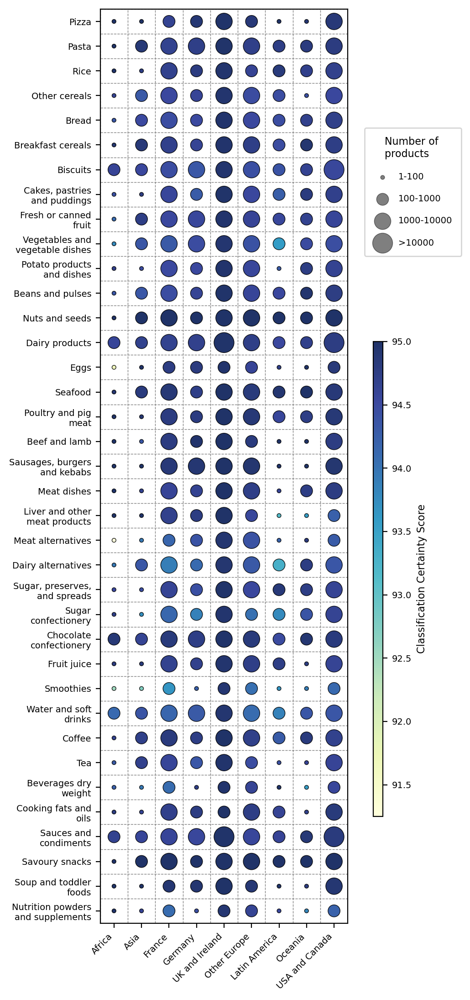

In [94]:
def wrap_tick_labels(ax, width=10):
    labels = ax.get_yticklabels()
    ticks = ax.get_yticks()  
    ax.set_yticks(ticks)
    wrapped_labels = []
    for lbl in labels:
        # textwrap.fill wraps the string to the given width
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_yticklabels(wrapped_labels, rotation=0)

fig, ax = plt.subplots(figsize=(3.5, 13))

scatter = ax.scatter(
    x=df_plot['country_code'],
    y=df_plot['labels_code'],
    s=df_plot['circle_size'],             
    c=df_plot['class_conf_mean'],               
    cmap='YlGnBu',
    alpha=0.9,
    edgecolors='k',
    linewidths=0.5
)

# Colorbar for conf_mean
cax = fig.add_axes([0.98, 0.2, 0.03, 0.4])
cbar = plt.colorbar(scatter, cax=cax)
cbar.set_label("Classification Certainty Score", rotation=90, fontsize=8)
cbar.ax.tick_params(labelsize=7)

# Set up ticks & labels for x and y
countries = df_plot[['country_code','country']].drop_duplicates().sort_values('country_code')
labels_   = df_plot[['labels_code','labels']].drop_duplicates().sort_values('labels_code')

ax.set_xticks(countries['country_code'])
ax.set_xticklabels(countries['country'], rotation=45, ha='right')

ax.set_yticks(labels_['labels_code'])
ax.set_yticklabels(labels_['labels'])
# Wrap y-axis labels
wrap_tick_labels(ax, width=18)
ax.tick_params(axis='both', which='major', labelsize=7)

ax.set_xlabel("")
ax.set_ylabel("")

# Create a custom legend for circle sizes
for label, size in size_mapping.items():
    ax.scatter([], [], s=size, c='k', linewidths=0.5, alpha=0.5, label=label)
ax.legend(
    title='Number of \nproducts',
    loc='center left',
    bbox_to_anchor=(1.05, 0.8),
    title_fontsize=8,               
    fontsize=7,                     
    labelspacing=1.5,
    borderpad=1.0  
)

# Add grid lines to give a "heatmap" look
ax.set_xlim(-0.5, df_plot['country_code'].nunique() - 0.5)
ax.set_ylim(-0.5, df_plot['labels_code'].nunique() - 0.5)
ax.set_xticks(np.arange(df_plot['country_code'].nunique()+1)-0.5, minor=True)
ax.set_yticks(np.arange(df_plot['labels_code'].nunique()+1)-0.5, minor=True)
ax.tick_params(axis='both', which='minor', length=0)
ax.grid(which='minor', color='grey', linestyle='--', linewidth=0.5)

plt.savefig('../../Product impacts paper/figures/classification_confidence.jpg', bbox_inches='tight', dpi=300)
plt.show()

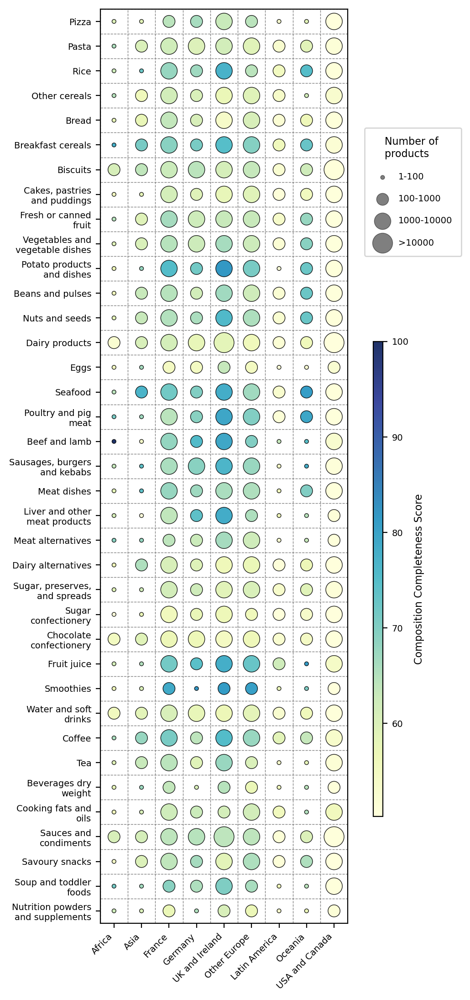

In [95]:
def wrap_tick_labels(ax, width=10):
    labels = ax.get_yticklabels()
    ticks = ax.get_yticks()  
    ax.set_yticks(ticks)
    wrapped_labels = []
    for lbl in labels:
        # textwrap.fill wraps the string to the given width
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_yticklabels(wrapped_labels, rotation=0)

fig, ax = plt.subplots(figsize=(3.5, 13))

scatter = ax.scatter(
    x=df_plot['country_code'],
    y=df_plot['labels_code'],
    s=df_plot['circle_size'],             
    c=df_plot['comp_conf_mean'], 
    cmap='YlGnBu',
    alpha=0.9,
    edgecolors='k',
    linewidths=0.5
)

# Colorbar for conf_mean
cax = fig.add_axes([0.98, 0.2, 0.03, 0.4])
cbar = plt.colorbar(scatter, cax=cax)
cbar.set_label("Composition Completeness Score", rotation=90, fontsize=8)
cbar.ax.tick_params(labelsize=7)

# Set up ticks & labels for x and y
countries = df_plot[['country_code','country']].drop_duplicates().sort_values('country_code')
labels_   = df_plot[['labels_code','labels']].drop_duplicates().sort_values('labels_code')

ax.set_xticks(countries['country_code'])
ax.set_xticklabels(countries['country'], rotation=45, ha='right')

ax.set_yticks(labels_['labels_code'])
ax.set_yticklabels(labels_['labels'])
# Wrap y-axis labels
wrap_tick_labels(ax, width=18)
ax.tick_params(axis='both', which='major', labelsize=7)

ax.set_xlabel("")
ax.set_ylabel("")

# Create a custom legend for circle sizes
for label, size in size_mapping.items():
    ax.scatter([], [], s=size, c='k', linewidths=0.5, alpha=0.5, label=label)
ax.legend(
    title='Number of \nproducts',
    loc='center left',
    bbox_to_anchor=(1.05, 0.8),
    title_fontsize=8,               
    fontsize=7,                     
    labelspacing=1.5,
    borderpad=1.0  
)

# Add grid lines to give a "heatmap" look
ax.set_xlim(-0.5, df_plot['country_code'].nunique() - 0.5)
ax.set_ylim(-0.5, df_plot['labels_code'].nunique() - 0.5)
ax.set_xticks(np.arange(df_plot['country_code'].nunique()+1)-0.5, minor=True)
ax.set_yticks(np.arange(df_plot['labels_code'].nunique()+1)-0.5, minor=True)
ax.tick_params(axis='both', which='minor', length=0)
ax.grid(which='minor', color='grey', linestyle='--', linewidth=0.5)

plt.savefig('../../Product impacts paper/figures/composition_confidence.jpg', bbox_inches='tight', dpi=300)
plt.show()

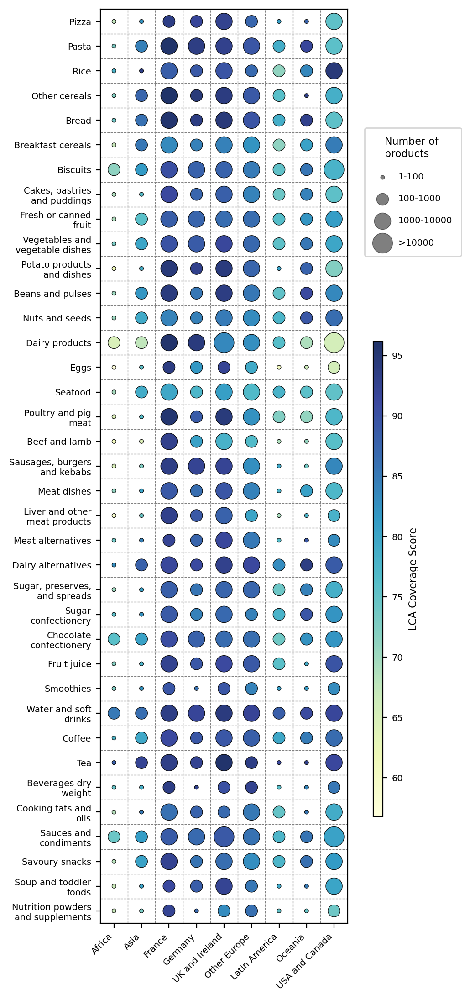

In [96]:
def wrap_tick_labels(ax, width=10):
    labels = ax.get_yticklabels()
    ticks = ax.get_yticks()  
    ax.set_yticks(ticks)
    wrapped_labels = []
    for lbl in labels:
        # textwrap.fill wraps the string to the given width
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_yticklabels(wrapped_labels, rotation=0)

fig, ax = plt.subplots(figsize=(3.5, 13))

scatter = ax.scatter(
    x=df_plot['country_code'],
    y=df_plot['labels_code'],
    s=df_plot['circle_size'],             
    c=df_plot['lca_conf_mean'],               
    cmap='YlGnBu',
    alpha=0.9,
    edgecolors='k',
    linewidths=0.5
)

# Colorbar for conf_mean
cax = fig.add_axes([0.98, 0.2, 0.03, 0.4])
cbar = plt.colorbar(scatter, cax=cax)
cbar.set_label("LCA Coverage Score", rotation=90, fontsize=8)
cbar.ax.tick_params(labelsize=7)

# Set up ticks & labels for x and y
countries = df_plot[['country_code','country']].drop_duplicates().sort_values('country_code')
labels_   = df_plot[['labels_code','labels']].drop_duplicates().sort_values('labels_code')

ax.set_xticks(countries['country_code'])
ax.set_xticklabels(countries['country'], rotation=45, ha='right')

ax.set_yticks(labels_['labels_code'])
ax.set_yticklabels(labels_['labels'])
# Wrap y-axis labels
wrap_tick_labels(ax, width=18)
ax.tick_params(axis='both', which='major', labelsize=7)

ax.set_xlabel("")
ax.set_ylabel("")

# Create a custom legend for circle sizes
for label, size in size_mapping.items():
    ax.scatter([], [], s=size, c='k', linewidths=0.5, alpha=0.5, label=label)
ax.legend(
    title='Number of \nproducts',
    loc='center left',
    bbox_to_anchor=(1.05, 0.8),
    title_fontsize=8,               
    fontsize=7,                     
    labelspacing=1.5,
    borderpad=1.0  
)

# Add grid lines to give a "heatmap" look
ax.set_xlim(-0.5, df_plot['country_code'].nunique() - 0.5)
ax.set_ylim(-0.5, df_plot['labels_code'].nunique() - 0.5)
ax.set_xticks(np.arange(df_plot['country_code'].nunique()+1)-0.5, minor=True)
ax.set_yticks(np.arange(df_plot['labels_code'].nunique()+1)-0.5, minor=True)
ax.tick_params(axis='both', which='minor', length=0)
ax.grid(which='minor', color='grey', linestyle='--', linewidth=0.5)

plt.savefig('../../Product impacts paper/figures/lca_confidence.jpg', bbox_inches='tight', dpi=300)
plt.show()

In [97]:
df_plot.describe()

,class_conf_mean,comp_conf_mean,lca_conf_mean,conf_mean,count_id,labels_code,country_code
count,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000
mean,94.615061,61.537488,82.906743,48.335637,1426.291291,18.000000,4.000000
std,0.441378,8.051116,8.129356,8.492264,2267.525869,10.693146,2.585875
min,91.250000,50.251137,56.798619,28.990511,1.000000,0.000000,0.000000
25%,94.486607,55.607778,77.512686,40.853776,104.000000,9.000000,2.000000
50%,94.705882,60.739754,84.266142,48.970408,413.000000,18.000000,4.000000
75%,94.914555,65.960050,89.165207,54.203937,1666.000000,27.000000,6.000000
max,95.000000,100.000000,96.164306,73.410262,16743.000000,36.000000,8.000000


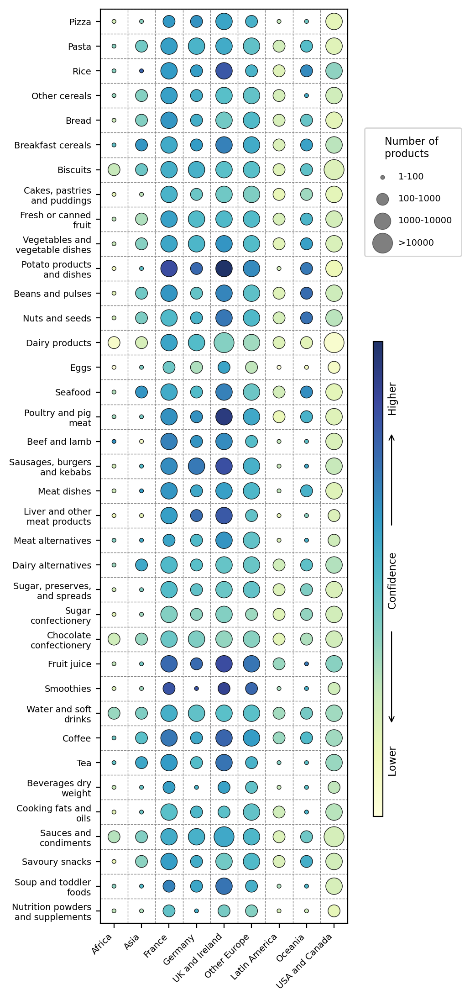

In [98]:
def wrap_tick_labels(ax, width=10):
    labels = ax.get_yticklabels()
    ticks = ax.get_yticks()  
    ax.set_yticks(ticks)
    wrapped_labels = []
    for lbl in labels:
        # textwrap.fill wraps the string to the given width
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_yticklabels(wrapped_labels, rotation=0)

fig, ax = plt.subplots(figsize=(3.5, 13))

scatter = ax.scatter(
    x=df_plot['country_code'],
    y=df_plot['labels_code'],
    s=df_plot['circle_size'],             
    c=df_plot['conf_mean'],               
    cmap='YlGnBu',
    alpha=0.9,
    edgecolors='k',
    linewidths=0.5
)

# Colorbar for conf_mean
cax = fig.add_axes([0.98, 0.2, 0.03, 0.4])
cbar = plt.colorbar(scatter, cax=cax)
# remove the numeric tick marks and labels
cbar.ax.yaxis.set_ticks([])
cbar.ax.yaxis.set_ticklabels([])

# remove the default colorbar label
cbar.set_label("")

# custom text for lower/higher confidence
cbar.set_label("Lower                                          Confidence                                          Higher", rotation=90, fontsize=8)

cbar.ax.annotate(
    '', 
    xy=(1.9, 37.5),           
    xytext=(1.9, 46.5),      
    arrowprops=dict(arrowstyle="->", lw=0.8, color='black'),
    annotation_clip=False,
    clip_on=False,
    transform=cbar.ax.transAxes,
    zorder=10
)

cbar.ax.annotate(
    '', 
    xy=(1.9, 65),           
    xytext=(1.9, 56),       
    arrowprops=dict(arrowstyle="->", lw=0.8, color='black'),
    annotation_clip=False,
    clip_on=False,
    transform=cbar.ax.transAxes,
    zorder=10
)

# Set up ticks & labels for x and y
countries = df_plot[['country_code','country']].drop_duplicates().sort_values('country_code')
labels_   = df_plot[['labels_code','labels']].drop_duplicates().sort_values('labels_code')

ax.set_xticks(countries['country_code'])
ax.set_xticklabels(countries['country'], rotation=45, ha='right')

ax.set_yticks(labels_['labels_code'])
ax.set_yticklabels(labels_['labels'])
# Wrap y-axis labels
wrap_tick_labels(ax, width=18)
ax.tick_params(axis='both', which='major', labelsize=7)

ax.set_xlabel("")
ax.set_ylabel("")

# Create a custom legend for circle sizes
for label, size in size_mapping.items():
    ax.scatter([], [], s=size, c='k', linewidths=0.5, alpha=0.5, label=label)
ax.legend(
    title='Number of \nproducts',
    loc='center left',
    bbox_to_anchor=(1.05, 0.8),
    title_fontsize=8,               
    fontsize=7,                     
    labelspacing=1.5,
    borderpad=1.0  
)

# Add grid lines to give a "heatmap" look
ax.set_xlim(-0.5, df_plot['country_code'].nunique() - 0.5)
ax.set_ylim(-0.5, df_plot['labels_code'].nunique() - 0.5)
ax.set_xticks(np.arange(df_plot['country_code'].nunique()+1)-0.5, minor=True)
ax.set_yticks(np.arange(df_plot['labels_code'].nunique()+1)-0.5, minor=True)
ax.tick_params(axis='both', which='minor', length=0)
ax.grid(which='minor', color='grey', linestyle='--', linewidth=0.5)

plt.savefig('../../Product impacts paper/figures/confidence.jpg', bbox_inches='tight', dpi=300)
plt.show()

In [99]:
df_plot['labels_code1'] = df_plot['labels_code'].max() - df_plot['labels_code'] 
df_plot['country_code1'] = df_plot['country_code'].max() - df_plot['country_code'] 

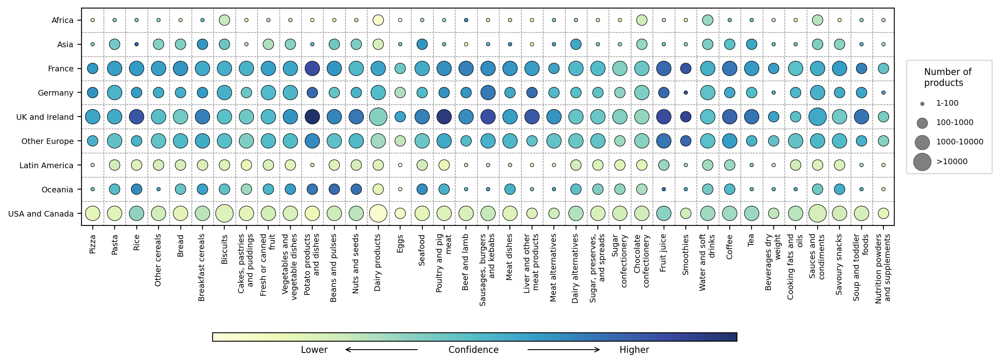

In [100]:
def wrap_xtick_labels(ax, width=10):
    """
    Wraps the x-axis tick labels of the given Axes to a specified width.
    """
    labels = ax.get_xticklabels()
    ticks = ax.get_xticks()  
    ax.set_xticks(ticks)
    wrapped_labels = []
    for lbl in labels:
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_xticklabels(wrapped_labels, rotation=90, ha='right', va='center', rotation_mode='anchor')

fig, ax = plt.subplots(figsize=(13, 3.5))

scatter = ax.scatter(
    x=df_plot['labels_code1'],      
    y=df_plot['country_code1'],    
    s=df_plot['circle_size'],             
    c=df_plot['conf_mean'],               
    cmap='YlGnBu',
    alpha=0.9,
    edgecolors='k',
    linewidths=0.5
)

cax = fig.add_axes([0.25, -0.3, 0.5, 0.03])
cbar = plt.colorbar(scatter, cax=cax, orientation='horizontal')

# Remove the numeric tick marks and labels
cbar.ax.xaxis.set_ticks([])
cbar.ax.xaxis.set_ticklabels([])

# Remove the default colorbar label
cbar.set_label("")

# Set a custom label; since the bar is horizontal, we set rotation=0
cbar.set_label("Lower                                          Confidence                                          Higher", rotation=0, fontsize=8)

# Add arrow annotations:
# Left arrow for Lower confidence
cbar.ax.annotate(
    '', 
    xy=(40, -1),          
    xytext=(46.5, -1),    
    arrowprops=dict(arrowstyle="->", lw=0.8, color='black'),
    annotation_clip=False,
    clip_on=False,
    transform=cbar.ax.transAxes,
    zorder=10
)

# Right arrow for Higher confidence
cbar.ax.annotate(
    '', 
    xy=(62, -1),          
    xytext=(55.5, -1),      
    arrowprops=dict(arrowstyle="->", lw=0.8, color='black'),
    annotation_clip=False,
    clip_on=False,
    transform=cbar.ax.transAxes,
    zorder=10
)


# For x-axis, we use food categories.
labels_ = df_plot[['labels_code1','labels']].drop_duplicates().sort_values('labels_code1')
ax.set_xticks(labels_['labels_code1'])
ax.set_xticklabels(labels_['labels'])

# For y-axis, we use geographies.
countries = df_plot[['country_code1','country']].drop_duplicates().sort_values('country_code1')
ax.set_yticks(countries['country_code1'])
ax.set_yticklabels(countries['country'])

# Wrap the x-axis tick labels (food categories) to prevent overly long labels.
wrap_xtick_labels(ax, width=18)
ax.tick_params(axis='both', which='major', labelsize=7)

# Remove x and y axis labels (if not needed)
ax.set_xlabel("")
ax.set_ylabel("")

# Create a custom legend for circle sizes (remains unchanged)
for label, size in size_mapping.items():
    ax.scatter([], [], s=size, c='k', linewidths=0.5, alpha=0.5, label=label)
ax.legend(
    title='Number of \nproducts',
    loc='center left',
    bbox_to_anchor=(1.01, 0.5),
    title_fontsize=8,               
    fontsize=7,                     
    labelspacing=1.5,
    borderpad=1.0  
)

# Add grid lines to give a "heatmap" look
ax.set_xlim(-0.5, df_plot['labels_code1'].nunique() - 0.5)
ax.set_ylim(-0.5, df_plot['country_code1'].nunique() - 0.5)
ax.set_xticks(np.arange(df_plot['labels_code1'].nunique()+1) - 0.5, minor=True)
ax.set_yticks(np.arange(df_plot['country_code1'].nunique()+1) - 0.5, minor=True)
ax.tick_params(axis='both', which='minor', length=0)
ax.grid(which='minor', color='grey', linestyle='--', linewidth=0.5)

plt.savefig('../../Product impacts paper/figures/confidence_h.jpg', bbox_inches='tight', dpi=300)
plt.show()


In [101]:
### compostion + availability of lca data for source countries --- should this be weight by percent composition or percent contribution to impact?
### num rows in lca / total weight????

#### specific examples

In [102]:
impacts[['mean_Land', 'mean_GHG', 'mean_Eut', 'mean_WatScar', 'mean_Biodiversity', 'mean_norm_agg']].describe()

,mean_Land,mean_GHG,mean_Eut,mean_WatScar,mean_Biodiversity,mean_norm_agg
count,474955.000000,474955.000000,474955.000000,474955.000000,474955.000000,474955.000000
mean,0.681418,0.368101,2.347627,1869.761327,18.576969,3.324691
std,1.397783,0.583927,9.613765,3624.586448,47.747417,5.384813
min,0.000000,-0.316062,0.000000,0.000000,0.000000,0.000000
25%,0.138313,0.096872,0.445174,204.602391,1.647240,0.815231
50%,0.279616,0.180201,0.875671,607.426360,5.155687,1.570934
75%,0.706756,0.332778,1.881009,1854.423638,15.704605,3.637083
max,71.301743,19.677128,207.126061,60408.957838,3871.904993,100.000000


In [103]:
impacts[['mean_Land', 'mean_GHG', 'mean_Eut', 'mean_WatScar', 'mean_Biodiversity', 'mean_norm_agg']].quantile(0.05)

mean_Land             0.033472
mean_GHG              0.032445
mean_Eut              0.117060
mean_WatScar         20.999310
mean_Biodiversity     0.324633
mean_norm_agg         0.242708
Name: 0.05, dtype: float64

In [104]:
impacts[['mean_Land', 'mean_GHG', 'mean_Eut', 'mean_WatScar', 'mean_Biodiversity', 'mean_norm_agg']].quantile(0.95)

mean_Land               2.569700
mean_GHG                1.384532
mean_Eut                6.938596
mean_WatScar         8271.632807
mean_Biodiversity      72.861461
mean_norm_agg          11.752402
Name: 0.95, dtype: float64

In [105]:
# impacts.sort_values(by='mean_norm_agg').head(20)[['product_name', 'ingredients_text', 'country', 'mean_norm_agg', 
#                                                   'mean_Land', 'mean_GHG', 'mean_Eut', 'mean_WatScar', 'mean_Biodiversity']]

In [106]:
# impacts.sort_values(
#     by='mean_norm_agg').tail(20)[['product_name', 'ingredients_text', 'country', 'mean_norm_agg', 
#                                   'mean_Land', 'mean_GHG', 'mean_Eut', 'mean_WatScar', 'mean_Biodiversity']]

In [107]:
# skewness
for score in ['Land', 'GHG', 'Eut', 'Biodiversity', 'WatScar', 'norm_agg']:
    print(score)
    print((impacts[f'mean_{score}'].quantile(0.95) - impacts[f'mean_{score}'].median()) / (
        impacts[f'mean_{score}'].median() - impacts[f'mean_{score}'].quantile(0.05)))

Land
9.303819459561254
GHG
8.150817547584078
Eut
7.992140018160754
Biodiversity
14.01470181584027
WatScar
13.069326259231802
norm_agg
7.665466781505158


In [108]:
### examples of beef being very bad
df = impacts[(impacts['product_id'].isin(composition[composition['Food_Category'].isin([
            'Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)'
        ])]['id'].unique()))]

df = df[['product_id', 'product_name', 'ingredients_text', 'country', 'store', 'groups', 'labels', 'ID', 'mean_norm_agg']]
composition_sub = composition[(composition['id'].isin(df['product_id'].unique())) 
                              & (composition['Food_Category'].isin(['Bovine Meat (dairy herd)', 
                                                                    'Bovine Meat (beef herd)']))
].groupby(['id'])[['percent']].sum().reset_index()
df = df.merge(composition_sub, left_on='product_id', right_on='id').drop('id', axis=1)
ids = df['product_id'].unique()
df = df[df['percent']>=30] #only looking at products with at least 30% beef
print(df['mean_norm_agg'].quantile(0.1)) # 10th percentile impact of products with more than 30% beef
print(impacts[~impacts['product_id'].isin(ids)]['mean_norm_agg'].quantile(0.9)) # 90th percentile impact of products with no beef
print(
    (df['mean_norm_agg'].quantile(0.1) - impacts[~impacts['product_id'].isin(ids)]['mean_norm_agg'].quantile(0.9)) / 
    impacts[~impacts['product_id'].isin(ids)]['mean_norm_agg'].quantile(0.9)
) # comparison of the two

11.015143759344287
7.6364899324981765
0.44243544569708204


In [109]:
# looking at products with no beef. what do products with greater than 90th percentile impact contain more of?
df = impacts[~impacts['product_id'].isin(ids)].copy()
df = df[df['mean_norm_agg']>df['mean_norm_agg'].quantile(0.9)]
df = df[['product_id', 'product_name', 'ingredients_text', 'country', 'store', 'groups', 'labels', 'ID', 'mean_norm_agg']]
print(len(df))

composition_sub = composition[(composition['id'].isin(df['product_id'].unique()))]
composition_sub.groupby('Food_Category')[['percent']].mean().reset_index().sort_values('percent')

46066


,Food_Category,percent
49,Vitamin,0.832739
23,Mineral,0.876751
29,Other Food Additive,0.910843
47,Tofu,1.000000
43,Soymilk,1.432520
40,Root Vegetables,1.496554
41,Salt,1.870829
12,Citrus Fruit,2.028057
36,Potatoes,2.362225
28,Onions & Leeks,2.562481


In [110]:
# looking at products with no beef. what do products with less than 10th percentile impact contain more of?
df = impacts[~impacts['product_id'].isin(ids)].copy()
df = df[df['mean_norm_agg']<=df['mean_norm_agg'].quantile(0.1)]
df = df[['product_id', 'product_name', 'ingredients_text', 'country', 'store', 'groups', 'labels', 'ID', 'mean_norm_agg']]
print(len(df))

composition_sub = composition[(composition['id'].isin(df['product_id'].unique()))]
composition_sub.groupby('Food_Category')[['percent']].mean().reset_index().sort_values('percent')

46066


,Food_Category,percent
46,Tea,0.653732
11,Cheese,0.739472
49,Vitamin,0.909011
14,Crustaceans (farmed),1.025886
26,Olive Oil,1.060939
0,Animal Fats,1.162952
29,Other Food Additive,1.201114
39,Rice,1.203609
16,Eggs,1.204872
42,Soybean Oil,1.500778


In [111]:
# what percent of meat containing products are above / below 90th percentile of total impacts?
perc90 = impacts['mean_norm_agg'].quantile(0.9)

composition_sub = composition[(composition['Food_Category'].isin(['Fish (farmed)', 'Crustaceans (farmed)', 
                                                                  'Poultry Meat', 'Pig Meat', 
                                                                  'Bovine Meat (dairy herd)', 'Bovine Meat (beef herd)', 
                                                                  'Lamb & Mutton']))
].groupby(['id'])[['percent']].sum().reset_index()

df = impacts.merge(composition_sub, left_on='product_id', right_on='id').drop('id', axis=1)
# df = df[df['percent']>30]
print(len(df))
print(len(df[df['mean_norm_agg']>perc90]))
print(len(df[df['mean_norm_agg']<=perc90]))
print(len(df[df['mean_norm_agg']>perc90]) / len(df))
print(len(df[df['mean_norm_agg']<=perc90]) / len(df))

79376
24477
54899
0.30836776859504134
0.6916322314049587


In [112]:
df = impacts[['country', 'groups', 'labels', 'ID', 'product_id', 'product_name', 'mean_norm_agg']]
df = df.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
                        right_on='Country').drop('Country', axis=1)
df.loc[df['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
df.loc[df['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

df.loc[~df['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df[~df['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

df.loc[df['country'].isin(['Americas']), 'country'] = 'Latin America'
df.loc[df['country'].isin(['Europe']), 'country'] = 'Other Europe'

In [113]:
df[df['product_name'].str.lower().str.contains('beef jerky')].groupby(['country']).aggregate({'mean_norm_agg': ['mean', 'count']})

mean_norm_agg      
                        mean count
country                           
France             14.919195    37
Germany            17.068104     8
Oceania            26.243425    11
Other Europe       16.686473    19
UK and Ireland     14.715924    50
USA and Canada     38.377764   313

In [114]:
df[df['product_name'].str.lower().str.contains('chicken and rice')].groupby(['country']).aggregate({'mean_norm_agg': ['mean', 'count']})

mean_norm_agg      
                        mean count
country                           
France              2.620949    10
Oceania             2.182207     1
UK and Ireland      4.240195     7
USA and Canada      2.597341    12

In [115]:
df[df['product_name'].str.lower().str.contains('pork sausage')].groupby(['country']).aggregate({'mean_norm_agg': ['mean', 'count']})

mean_norm_agg      
                        mean count
country                           
Asia                5.747388     3
France             11.617022    31
Latin America       6.603934     4
Oceania             7.824635     8
Other Europe       10.867149    16
UK and Ireland      8.553623   506
USA and Canada      4.628039   187

In [116]:
# df[(df['product_name'].str.lower().str.contains('chocolate')) & (df['product_name'].str.lower().str.contains('hazelnut'))
#  & (df['ID']=='4C')].sample(20)

In [117]:
df[(df['product_name'].str.lower().str.contains('chocolate')) & (df['product_name'].str.lower().str.contains('hazelnut'))
 & (df['ID']=='4C')].groupby(['country']).aggregate({'mean_norm_agg': ['mean', 'count']})

mean_norm_agg      
                        mean count
country                           
Africa              3.191998     4
Asia                6.506223     8
France              3.617662   290
Germany             3.874368    40
Latin America       3.619273     4
Oceania             5.364263     6
Other Europe        3.895412   148
UK and Ireland      3.670051   174
USA and Canada      4.321851   168

####  diet differences, food environments, and nutrition

In [118]:
df_plot = impacts[['country', 'groups', 'labels', 'ID', 'product_id', 'mean_norm_agg']]
df_plot = df_plot.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
                        right_on='Country').drop('Country', axis=1)
df_plot.loc[df_plot['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
df_plot.loc[df_plot['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

df_plot.loc[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df_plot[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

df_plot.loc[df_plot['country'].isin(['Americas']), 'country'] = 'Latin America'
df_plot.loc[df_plot['country'].isin(['Europe']), 'country'] = 'Other Europe'

In [119]:
df_plot.groupby(['country'])['mean_norm_agg'].describe()

,count,mean,std,min,25%,50%,75%,max
country,,,,,,,,
Africa,2132.0,3.220565,4.238262,3.347376e-04,1.171981,1.785047,3.109989,41.326816
Asia,4343.0,3.872156,5.664891,1.157123e-03,1.250241,1.972529,4.010428,88.292170
France,91723.0,3.259420,4.272052,0.000000e+00,0.726737,1.430180,4.204456,50.099336
Germany,25045.0,2.838040,3.920255,7.436559e-07,0.699934,1.417060,3.498160,40.189719
Latin America,8011.0,3.136032,5.044462,2.747043e-06,0.818145,1.525601,3.228257,100.000000
Oceania,7044.0,2.888091,4.266066,9.854479e-05,0.793438,1.538857,3.211854,61.173283
Other Europe,68816.0,3.043978,4.070695,7.124528e-06,0.810833,1.556456,3.451142,47.625839
UK and Ireland,121578.0,3.117330,4.247584,2.701973e-05,0.754357,1.582853,3.525802,73.995442
USA and Canada,146263.0,3.770013,7.312338,1.193123e-05,0.896862,1.670864,3.611331,80.347305


In [120]:
df_plot.groupby(['country'])['mean_norm_agg'].quantile(0.95)

country
Africa            11.619172
Asia              13.003275
France            12.062815
Germany            8.426433
Latin America     11.683429
Oceania            9.618562
Other Europe      10.770961
UK and Ireland    11.467811
USA and Canada    13.638318
Name: mean_norm_agg, dtype: float64

In [121]:
# df_plot.groupby(['country', 'labels'])[['mean_norm_agg']].mean().reset_index().sort_values(by='mean_norm_agg')

In [122]:
impacts[impacts['country'].isin(['United Kingdom', 'Ireland'])].groupby(
    ['database'])[['product_id']].count().reset_index()

,database,product_id
0,fooddb,101106
1,openfoodfacts,20472


In [123]:
df = impacts[impacts['country'].isin(['United Kingdom', 'Ireland'])][[
    'database', 'groups', 'labels', 'ID', 'product_id']]
df = df.groupby(['database', 'groups', 'labels'])[['product_id']].count().reset_index()
df = df.merge(df.groupby('database')[['product_id']].sum().reset_index().rename(
    columns={'product_id':'total'})).rename(columns={'product_id':'num_cat'})
df['perc'] = df['num_cat'] / df['total']
df = df.pivot(index=['groups', 'labels'], columns='database', values='perc').reset_index()
df.groupby('groups')[['fooddb', 'openfoodfacts']].sum()

database,fooddb,openfoodfacts
groups,,
Cereals and Cereal Products,0.243260,0.246336
"Fruits, Vegetables, and Nuts",0.124958,0.171551
"Meat, Dairy, and Eggs",0.291724,0.259086
Miscellaneous Items,0.153097,0.160610
Non-Alcoholic Beverages,0.092101,0.067946
Sugar and Confectionery,0.094861,0.094470


In [124]:
df

database,groups,labels,fooddb,openfoodfacts
0,Cereals and Cereal Products,Biscuits,0.063577,0.060473
1,Cereals and Cereal Products,Bread,0.034142,0.047186
2,Cereals and Cereal Products,Breakfast cereals,0.020483,0.034486
3,Cereals and Cereal Products,"Cakes, pastries and puddings",0.052153,0.023202
4,Cereals and Cereal Products,Other cereals,0.013412,0.020125
5,Cereals and Cereal Products,Pasta,0.033915,0.034682
6,Cereals and Cereal Products,Pizza,0.012828,0.012798
7,Cereals and Cereal Products,Rice,0.012749,0.013384
8,"Fruits, Vegetables, and Nuts",Beans and pulses,0.017605,0.028380
9,"Fruits, Vegetables, and Nuts",Fresh or canned fruit,0.026596,0.029406


In [125]:
# remove asia, africa, latam, oceania
df_plot = df_plot[~df_plot['country'].isin(['Africa', 'Asia', 'Latin America', 'Oceania'])]

In [126]:
df_mapping = df_plot[['groups', 'labels', 'ID']].drop_duplicates()
df_mapping['group_ID'] = df_mapping.apply(lambda row: row['ID'][:-1], axis=1)

parent_to_sub = {}
for parent in df_mapping['group_ID'].unique():
    subs = df_mapping[df_mapping['group_ID'] == parent]['ID'].tolist()
    subs_sorted = sorted(subs)
    parent_to_sub[parent] = subs_sorted
    
ordered_parents = sorted(parent_to_sub.keys())

# Create an overall ordered list of sub-categories, grouping by parent.
ordered_subs = []
for parent in ordered_parents:
    ordered_subs.extend(parent_to_sub[parent])

In [127]:
df = df_plot.groupby(['country', 'groups'])[['product_id']].count().reset_index().rename(columns={'product_id': 'num_cat'}).merge(
    df_plot.groupby('country')[['product_id']].count().reset_index().rename(columns={'product_id': 'total'}))
df['perc'] = df['num_cat'] / df['total']
df[df['groups']=='Meat, Dairy, and Eggs']

,country,groups,num_cat,total,perc
2,France,"Meat, Dairy, and Eggs",26426,91723,0.288107
8,Germany,"Meat, Dairy, and Eggs",6446,25045,0.257377
14,Other Europe,"Meat, Dairy, and Eggs",17787,68816,0.258472
20,UK and Ireland,"Meat, Dairy, and Eggs",34799,121578,0.286228
26,USA and Canada,"Meat, Dairy, and Eggs",30264,146263,0.206915


In [130]:
df = df_plot.groupby(['country', 'labels'])[['product_id']].count().reset_index().rename(columns={'product_id': 'num_cat'}).merge(
    df_plot.groupby('country')[['product_id']].count().reset_index().rename(columns={'product_id': 'total'}))
df['perc'] = df['num_cat'] / df['total']
df[df['labels'].isin(['Biscuits', 'Savoury snacks', 'Sauces and condiments'])].groupby('country')['perc'].sum()

country
France            0.135953
Germany           0.149970
Other Europe      0.148657
UK and Ireland    0.182451
USA and Canada    0.231268
Name: perc, dtype: float64

In [131]:
df = df_plot.groupby(['country', 'labels'])[['product_id']].count().reset_index().rename(columns={'product_id': 'num_cat'}).merge(
    df_plot.groupby('country')[['product_id']].count().reset_index().rename(columns={'product_id': 'total'}))
df['perc'] = df['num_cat'] / df['total']
df[df['labels']=='Sausages, burgers and kebabs'] # 'Biscuits', 'Chocolate confectionery', 'Cakes, pastries and puddings', 
#'Sausages, burgers and kebabs', 'Sugar confectionery'

,country,labels,num_cat,total,perc
27,France,"Sausages, burgers and kebabs",2414,91723,0.026318
64,Germany,"Sausages, burgers and kebabs",1001,25045,0.039968
101,Other Europe,"Sausages, burgers and kebabs",1573,68816,0.022858
138,UK and Ireland,"Sausages, burgers and kebabs",2475,121578,0.020357
175,USA and Canada,"Sausages, burgers and kebabs",3394,146263,0.023205


In [132]:
# Assign a base color to each parent (using a Seaborn palette)
base_colors = sns.color_palette("deep", len(ordered_parents))
base_colors = [base_colors[i] for i in [4, 2, 3, 5, 0, 1]]
parent_color_dict = {parent: base_colors[i] for i, parent in enumerate(ordered_parents)}

# For each parent, generate a palette for its sub-categories (variations on the parent's color)
sub_color_dict = {}
for parent in ordered_parents:
    n_sub = len(parent_to_sub[parent])
    # Get the parent's base color in hex format
    base_hex = matplotlib.colors.to_hex(parent_color_dict[parent])
    # Generate a light palette variant. reverse=True so the first sub-category gets the darkest shade.
    sub_palette = sns.light_palette(base_hex, n_colors=n_sub, reverse=True)
    for sub, color in zip(parent_to_sub[parent], sub_palette):
        sub_color_dict[sub] = color

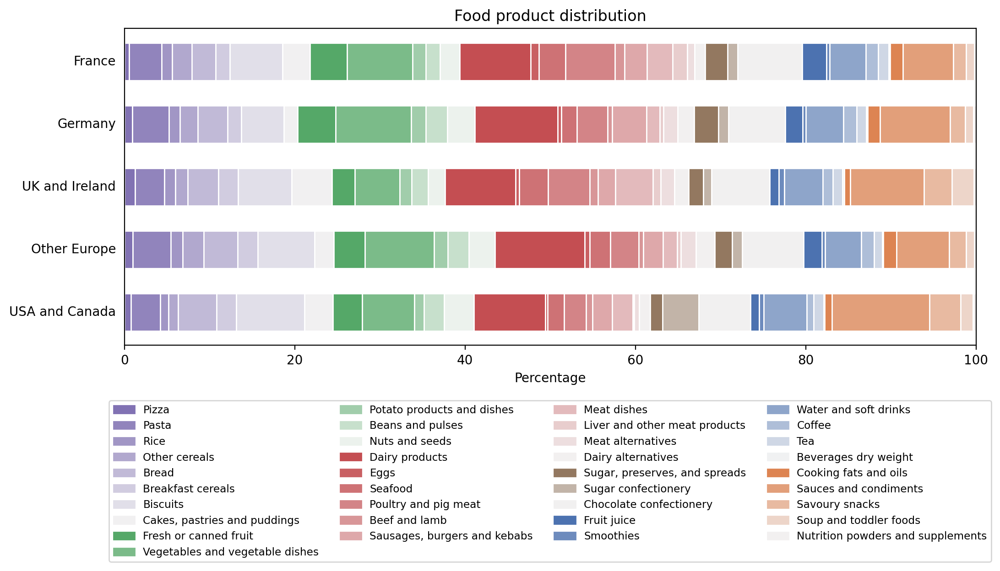

In [133]:
fig, ax = plt.subplots(figsize=(12, 4.5))

# Loop over countries. For each, compute percentages by sub_category and plot the stacked bar.
for i, country in enumerate(['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'][::-1]):
    df_country = df_plot[df_plot['country'] == country]
    counts = df_country['ID'].value_counts()
    total = counts.sum()
    left = 0  # starting position for stacking segments
    for sub in ordered_subs:
        count = counts.get(sub, 0)
        pct = (count / total * 100) if total > 0 else 0
        # Draw the horizontal bar segment for this sub_category.
        ax.barh(i, pct, left=left, color=sub_color_dict[sub], edgecolor='white', height=0.6)
        left += pct
    ax.text(-1, i, country, va='center', ha='right', fontsize=10)

ax.set_xlim(0, 100)
ax.set_yticks([])  # Hide default y-axis ticks since we annotated the country names.
ax.set_xlabel("Percentage")
ax.set_title("Food product distribution")

# Create legend for parent categories (using their base colors)
legend_handles = []
for sub, color in sub_color_dict.items():
    patch = mpatches.Patch(color=color, label=df_mapping[df_mapping['ID']==sub]['labels'].values[0])
    legend_handles.append(patch)

# ax.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left')
ax.legend(
    handles=legend_handles,
    loc='lower center',                
    bbox_to_anchor=(0.5, -0.7), 
    ncol=4,
    fontsize='small',
    # frameon=False
)

plt.savefig('../../Product impacts paper/figures/distribution1.jpg', bbox_inches='tight', dpi=300)
plt.show()


In [134]:
df_plot = composition.copy().rename(columns={'id': 'product_id'})
# nulls haven't been removed, counting the number of values in ingredients text, as opposed to ingredient categories
df_plot = df_plot.merge(impacts[['product_id', 'groups', 'labels', 'mean_norm_agg']])
df_plot.loc[(df_plot['Food_Category'].notnull()) & (df_plot['value'].isna()), 'value'] = df_plot[(
    df_plot['Food_Category'].notnull()) & (df_plot['value'].isna())]['Food_Category']
df_plot = df_plot.groupby(['product_id', 'country', 'groups', 'labels', 'mean_norm_agg'])[['value']].nunique().reset_index()

In [135]:
df_plot = df_plot.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
                        right_on='Country').drop('Country', axis=1)
df_plot.loc[df_plot['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
df_plot.loc[df_plot['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

df_plot.loc[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df_plot[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

df_plot.loc[df_plot['country'].isin(['Americas']), 'country'] = 'Latin America'
df_plot.loc[df_plot['country'].isin(['Europe']), 'country'] = 'Other Europe'

df_plot = df_plot[~df_plot['country'].isin(['Africa', 'Asia', 'Latin America', 'Oceania'])]

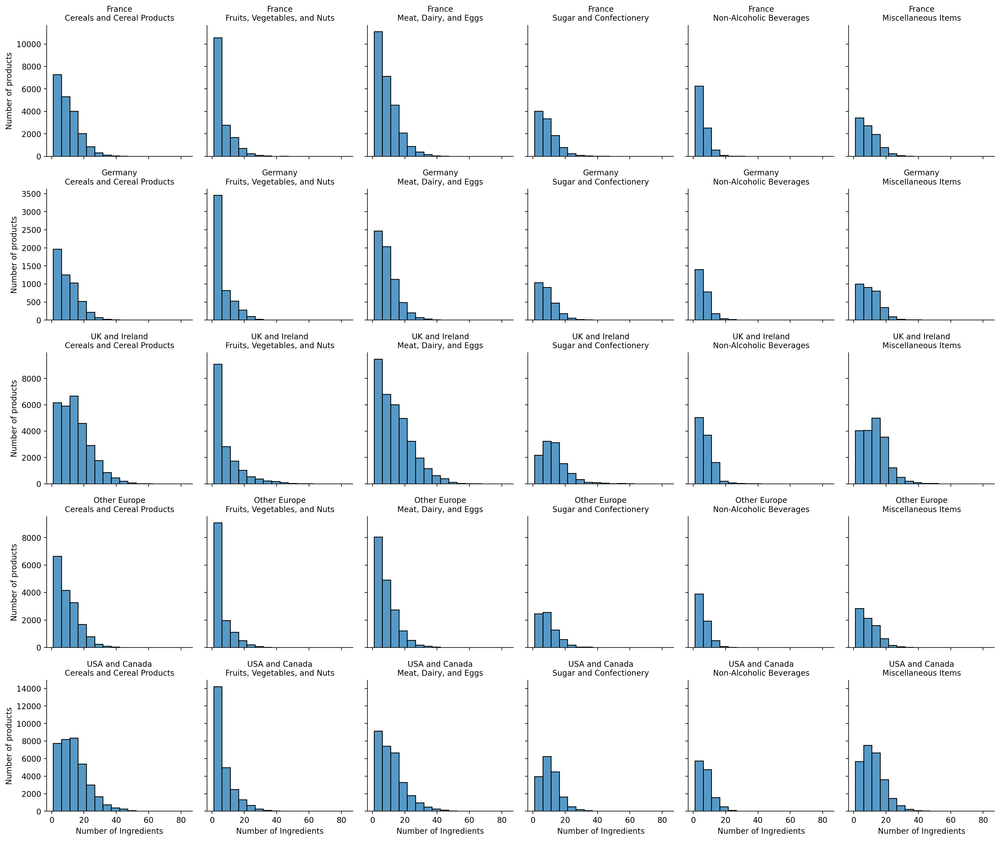

In [136]:
g = sns.displot(
    df_plot, x="value", col="groups", row="country",
    row_order=['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'],
    col_order=['Cereals and Cereal Products', 'Fruits, Vegetables, and Nuts',
               'Meat, Dairy, and Eggs', 'Sugar and Confectionery', 
               'Non-Alcoholic Beverages', 'Miscellaneous Items'],
    binwidth=5, height=3, facet_kws=dict(sharey='row'),
)

g.set_axis_labels("Number of Ingredients", "Number of products")
g.set_titles("{row_name}\n{col_name}")
g.fig.subplots_adjust(hspace=0.25, wspace=0.1)

plt.savefig('../../Product impacts paper/figures/distribution2.jpg', bbox_inches='tight', dpi=300)
plt.show()

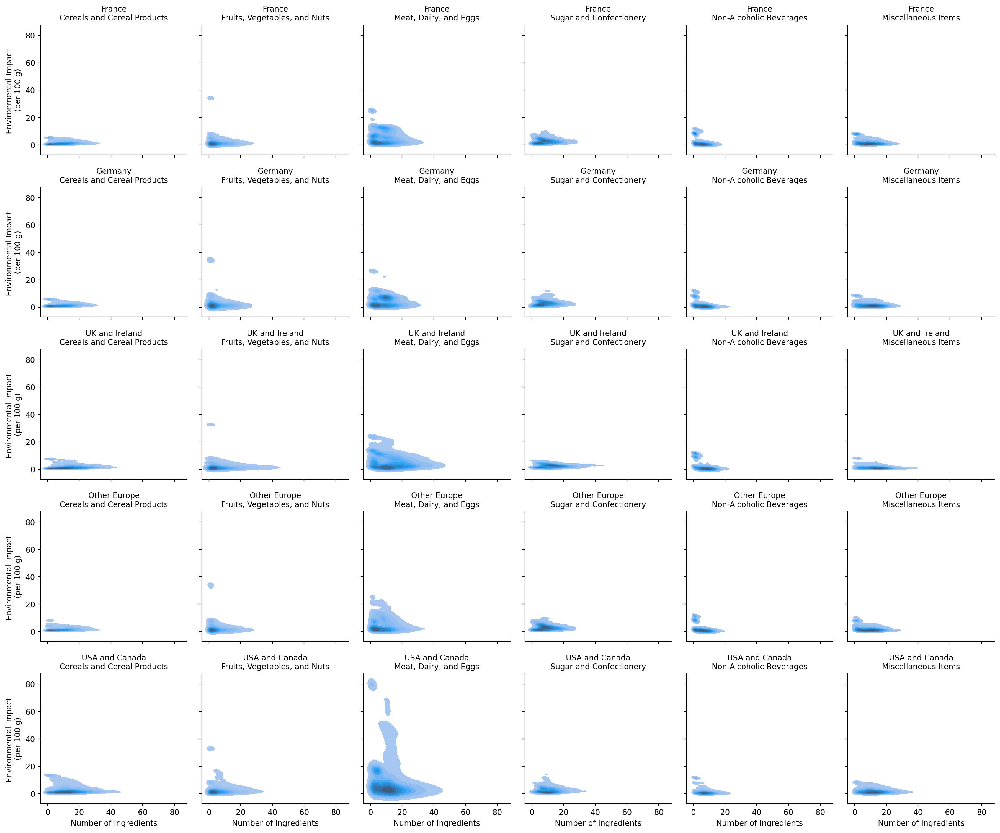

In [137]:
g = sns.FacetGrid(data=df_plot, 
                  col="groups", row='country',  
                  row_order=['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'],
                  col_order=['Cereals and Cereal Products', 'Fruits, Vegetables, and Nuts',
                             'Meat, Dairy, and Eggs', 'Sugar and Confectionery', 
                             'Non-Alcoholic Beverages', 'Miscellaneous Items'],
                  height=3)
g.map(sns.kdeplot, 'value', 'mean_norm_agg', fill=True)

g.set_axis_labels("Number of Ingredients", "Environmental Impact \n(per 100 g)")
g.set_titles("{row_name}\n{col_name}")
g.fig.subplots_adjust(hspace=0.25, wspace=0.1)

plt.savefig('../../Product impacts paper/figures/kde1.jpg', bbox_inches='tight', dpi=300)
plt.show()

#### ingredient/composition differences

In [138]:
df_list = []
for fname in glob.glob(os.path.join('../../SFS/environmental_impacts/Managed_Data', "Impact_Proportions_By_Product_*.csv")):
    df = pd.read_csv(fname)
    df_list.append(df)

props = pd.concat(df_list, axis=0, ignore_index=True)

In [139]:
props[['tmp.impact_Land', 'tmp.impact_GHG', 'tmp.impact_Eut', 
       #'tmp.impact_Acidification','tmp.impact_WaterUse',
      'tmp.impact_WatScar', 'tmp.impact_Biodiversity']] = props[[
    'tmp.impact_Land', 'tmp.impact_GHG', 'tmp.impact_Eut', 
    #'tmp.impact_Acidification', 'tmp.impact_WaterUse',
    'tmp.impact_WatScar', 'tmp.impact_Biodiversity']].fillna(0)

In [140]:
props = props.merge(impacts[['product_id', 'country', 'mean_Land', 'mean_GHG', 'mean_Eut',
                             'mean_WatScar', 'mean_Biodiversity',
                             'mean_Acidification', 'mean_WaterUse']], left_on='id', right_on='product_id')

In [141]:
props['tmp.impact_Land'] = (props['tmp.impact_Land']/props['amount']) * props['mean_Land']
props['tmp.impact_GHG'] = (props['tmp.impact_GHG']/props['amount']) * props['mean_GHG']
props['tmp.impact_Eut'] = (props['tmp.impact_Eut']/props['amount']) * props['mean_Eut']
props['tmp.impact_WatScar'] = (props['tmp.impact_WatScar']/props['amount']) * props['mean_WatScar'] 
props['tmp.impact_Biodiversity'] = (props['tmp.impact_Biodiversity']/props['amount']) * props['mean_Biodiversity'] 
# props['tmp.impact_Acidification'] = (props['tmp.impact_Acidification']/props['amount']) * props['mean_Acidification'] 
# props['tmp.impact_WaterUse'] = (props['tmp.impact_WaterUse']/props['amount']) * props['mean_WaterUse'] 

In [142]:
# d = props
# for col in ['tmp.impact_Land', 'tmp.impact_GHG', 'tmp.impact_Biodiversity', 'tmp.impact_Eut', 'tmp.impact_WatScar']:
#     d[col] = 100 * (d[col] - d[col].min()) / (d[col].max() - d[col].min())
# d.groupby('Food_Category')[['tmp.impact_Land', 'tmp.impact_GHG', 'tmp.impact_Biodiversity', 
#        'tmp.impact_Eut', 'tmp.impact_WatScar']].mean()

In [143]:
props[['tmp.impact_Land', 'tmp.impact_GHG', 'tmp.impact_Biodiversity', 
       'tmp.impact_Eut', 'tmp.impact_WatScar']].corr()

,tmp.impact_Land,tmp.impact_GHG,tmp.impact_Biodiversity,tmp.impact_Eut,tmp.impact_WatScar
tmp.impact_Land,1.000000,0.541947,0.736557,0.728918,0.163130
tmp.impact_GHG,0.541947,1.000000,0.527758,0.452059,0.255102
tmp.impact_Biodiversity,0.736557,0.527758,1.000000,0.573432,0.094705
tmp.impact_Eut,0.728918,0.452059,0.573432,1.000000,0.160157
tmp.impact_WatScar,0.163130,0.255102,0.094705,0.160157,1.000000


In [144]:
# props.groupby('Food_Category')[['tmp.impact_Land', 'tmp.impact_GHG', 'tmp.impact_Biodiversity', 
#        'tmp.impact_Eut', 'tmp.impact_WatScar']].corr()

In [145]:
# using the min and max scores from the overall impacts (with sourcing) to normalize - again, for comparability
impact_groups = props.copy()
for col in score_columns:
    min_score = impacts[f'mean_{col}'].min()
    max_score = impacts[f'mean_{col}'].max()
    impact_groups[f'tmp.impact_{col}'] = 100 * (impact_groups[f'tmp.impact_{col}'] - min_score) / (max_score - min_score)

impact_groups['impact'] = impact_groups[['tmp.impact_Land', 'tmp.impact_GHG', 'tmp.impact_Eut',
                         #  'tmp.impact_Acidification', 'tmp.impact_WaterUse',
                         'tmp.impact_WatScar', 'tmp.impact_Biodiversity']].mean(axis=1) 

min_score = impacts[[f'mean_{score_col}_norm' for score_col in score_columns]].mean(axis=1).min()
max_score = impacts[[f'mean_{score_col}_norm' for score_col in score_columns]].mean(axis=1).max()

impact_groups['impact'] = 100 * (impact_groups['impact'] - min_score) / (max_score - min_score)
    
impact_groups = impact_groups.groupby('Food_Category')[[
    'tmp.impact_Land', 'tmp.impact_GHG', 'tmp.impact_Eut',
    #  'tmp.impact_Acidification', 'tmp.impact_WaterUse',
    'tmp.impact_WatScar', 'tmp.impact_Biodiversity', 'impact'
]].mean().reset_index()

In [146]:
impact_groups

,Food_Category,tmp.impact_Land,tmp.impact_GHG,tmp.impact_Eut,tmp.impact_WatScar,tmp.impact_Biodiversity,impact
0,Almond milk,0.044968,2.488643,0.078315,17.011126,0.025045,8.003514e+00
1,Animal Fats,2.430800,7.395015,2.436573,11.732685,0.484430,1.014375e+01
2,Apples,0.073836,1.764362,0.032172,0.427763,0.023387,3.281059e-01
3,Bananas,0.715936,1.994735,0.301528,0.020688,1.439849,1.281061e+00
4,Barley (Beer),0.090185,2.087331,0.124320,0.097771,0.006023,3.653657e-01
5,Beet Sugar,0.199002,2.376517,0.188127,0.314713,0.009957,6.677845e-01
6,Berries & Grapes,0.226033,4.874447,0.258130,0.747832,0.070016,2.035784e+00
7,Bovine Meat (beef herd),18.510904,27.189081,5.950973,1.897936,0.720651,2.334028e+01
8,Bovine Meat (dairy herd),15.465296,20.995091,39.601573,16.545152,5.768316,4.287851e+01
9,Brassicas,0.099734,1.922076,0.150900,1.577107,0.015310,9.676019e-01


In [147]:
impact_groups['impact_groups'] = pd.qcut(impact_groups.impact, 5, labels=[1, 2, 3, 4, 5])

In [148]:
impact_groups.sort_values(by='impact')[['Food_Category', 'impact', 'impact_groups']]

,Food_Category,impact,impact_groups
53,Water,-1.990572e-07,1
45,Salt,-1.990572e-07,1
12,Cassava,1.554312e-01,1
31,Onions & Leeks,2.122484e-01,1
27,Oat milk,2.654345e-01,1
47,Soymilk,2.823597e-01,1
2,Apples,3.281059e-01,1
39,Potatoes,3.385375e-01,1
4,Barley (Beer),3.653657e-01,1
44,Root Vegetables,4.740456e-01,1


In [149]:
df_plot = impacts[['country', 'groups', 'labels', 'ID', 'product_id', 'mean_norm_agg']]
df_plot = df_plot.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
                        right_on='Country').drop('Country', axis=1)
df_plot.loc[df_plot['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
df_plot.loc[df_plot['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

df_plot.loc[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df_plot[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

df_plot.loc[df_plot['country'].isin(['Americas']), 'country'] = 'Latin America'
df_plot.loc[df_plot['country'].isin(['Europe']), 'country'] = 'Other Europe'

# remove asia, africa, latam, oceania
df_plot = df_plot[~df_plot['country'].isin(['Africa', 'Asia', 'Latin America', 'Oceania'])]

In [150]:
composition_sub = composition.drop('country', axis=1).merge(df_plot[['product_id', 'groups', 'labels', 'ID', 'country', 'mean_norm_agg']], 
                                    left_on='id', right_on='product_id')

# to account for almond, rice, oat, other nut milks
df_list = []
for food_cat in ['Almond milk','Oat milk', 'Other nut milk', 'Rice milk']:  
    alt_ids = props[props['Food_Category']==food_cat]['id'].unique()
    df = composition_sub[composition_sub['id'].isin(alt_ids)].groupby('id').first().reset_index()
    composition_sub = composition_sub[~composition_sub['id'].isin(alt_ids)]
    df['Food_Category'] = food_cat
    df['percent'] = 100
    df_list.append(df)
df_list.append(composition_sub)
composition_sub = pd.concat(df_list, axis=0, ignore_index=True)

composition_sub = composition_sub.groupby(['country', 'groups', 'labels', 
                                           'product_id', 'Food_Category'])[['percent']].sum().reset_index()

composition_sub.loc[composition_sub['Food_Category']=='Fish (farmed)', 'Food_Category'] = 'Fish'
composition_sub.loc[composition_sub['Food_Category']=='Crustaceans (farmed)', 'Food_Category'] = 'Crustaceans'
composition_sub = composition_sub.merge(impact_groups[['Food_Category', 'impact_groups']], how='left')
composition_sub.loc[composition_sub['impact_groups'].isna(), 'impact_groups'] = 1
composition_sub = composition_sub[composition_sub['labels']=='Beef and lamb'].groupby(['country', 'product_id', 'impact_groups'], 
                                                                                      observed=True, as_index=False)[['percent']].sum()

In [151]:
composition_sub[composition_sub['impact_groups']==5].groupby('country')['percent'].describe()

,count,mean,std,min,25%,50%,75%,max
country,,,,,,,,
France,1045.0,89.544672,17.093902,40.800000,81.000000,100.000000,100.000000,202.119977
Germany,137.0,86.666482,16.891903,40.491667,81.000000,93.000000,100.000000,100.000000
Other Europe,386.0,86.926218,15.917703,42.010526,79.914076,93.000000,100.000000,123.200000
UK and Ireland,1206.0,87.960118,23.682132,40.037747,75.000000,94.000000,100.000000,250.000000
USA and Canada,1130.0,67.872514,19.705154,40.198662,53.605441,60.565554,85.073161,102.947500


In [152]:
composition_sub = composition.drop('country', axis=1).merge(df_plot[['product_id', 'groups', 'labels', 'ID', 'country', 'mean_norm_agg']], 
                                    left_on='id', right_on='product_id')

# to account for almond, rice, oat, other nut milks
df_list = []
for food_cat in ['Almond milk','Oat milk', 'Other nut milk', 'Rice milk']:  
    alt_ids = props[props['Food_Category']==food_cat]['id'].unique()
    df = composition_sub[composition_sub['id'].isin(alt_ids)].groupby('id').first().reset_index()
    composition_sub = composition_sub[~composition_sub['id'].isin(alt_ids)]
    df['Food_Category'] = food_cat
    df['percent'] = 100
    df_list.append(df)
df_list.append(composition_sub)
composition_sub = pd.concat(df_list, axis=0, ignore_index=True)

composition_sub = composition_sub.groupby(['country', 'groups', 'labels', 
                                           'ID', 'Food_Category'])[['percent']].sum().reset_index()

def get_perc(g):
    g['percent'] = (g['percent'] / g['percent'].sum()) * 100
    return g

composition_sub = composition_sub.groupby(['country', 'ID']).apply(lambda g: get_perc(g)).reset_index(drop=True)

composition_sub.loc[composition_sub['Food_Category']=='Fish (farmed)', 'Food_Category'] = 'Fish'
composition_sub.loc[composition_sub['Food_Category']=='Crustaceans (farmed)', 'Food_Category'] = 'Crustaceans'
composition_sub = composition_sub.merge(impact_groups[['Food_Category', 'impact_groups']], how='left')
composition_sub.loc[composition_sub['impact_groups'].isna(), 'impact_groups'] = 1

composition_sub = composition_sub.groupby(['country', 'ID', 'impact_groups'])[['percent']].sum().reset_index()
composition_sub = composition_sub.merge(df_mapping)

/var/folders/hz/lt88gkws0n58xdkp66k3nk340000gn/T/ipykernel_83794/2789645023.py:23: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  composition_sub = composition_sub.groupby(['country', 'ID']).apply(lambda g: get_perc(g)).reset_index(drop=True)
/var/folders/hz/lt88gkws0n58xdkp66k3nk340000gn/T/ipykernel_83794/2789645023.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  composition_sub = composition_sub.groupby(['country', 'ID', 'impact_groups'])[['percent']].sum().reset_index()


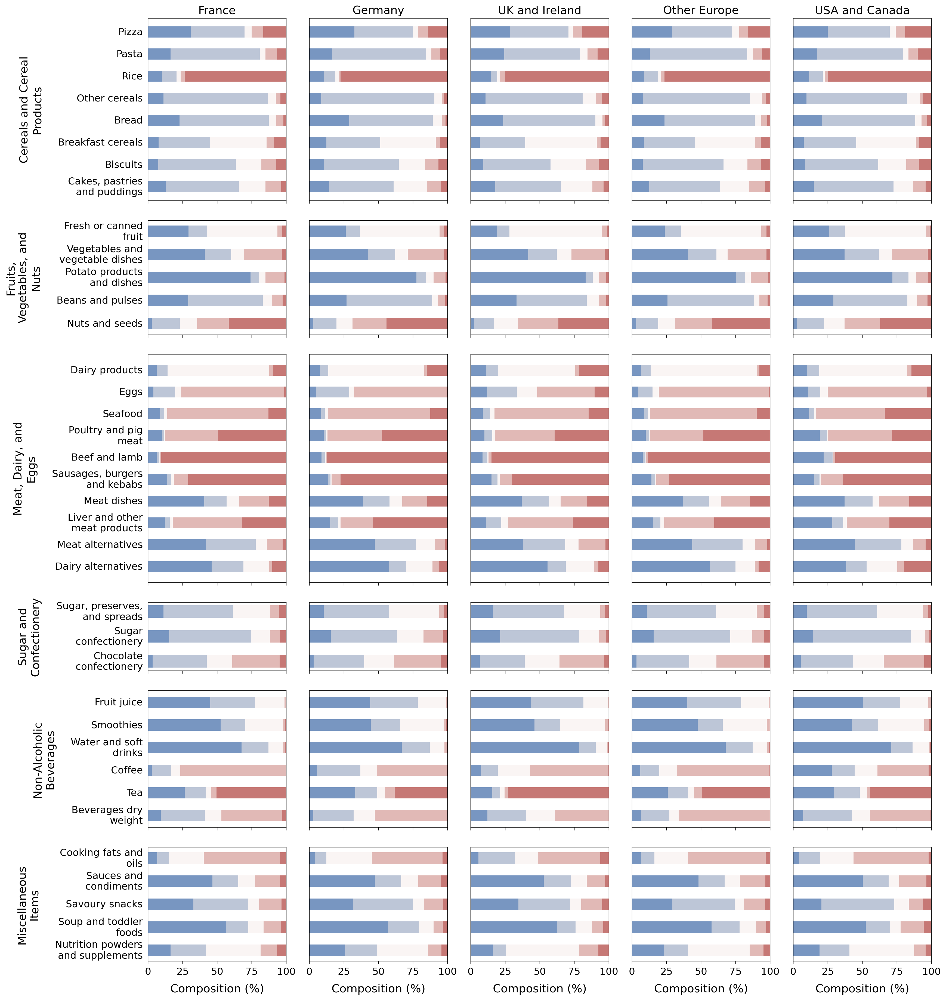

In [153]:
def wrap_tick_labels(ax, width=10):
    labels = ax.get_yticklabels()
    ticks = ax.get_yticks()  
    ax.set_yticks(ticks)
    wrapped_labels = []
    for lbl in labels:
        # textwrap.fill wraps the string to the given width
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_yticklabels(wrapped_labels)

groups_list = ['Cereals and Cereal Products', 'Fruits, Vegetables, and Nuts',
               'Meat, Dairy, and Eggs', 'Sugar and Confectionery', 
               'Non-Alcoholic Beverages', 'Miscellaneous Items']
countries_list = ['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada']


facet_counts = {}
for group in groups_list:
    for country in countries_list:
        data_sub = composition_sub[(composition_sub['groups'] == group) & (composition_sub['country'] == country)]
        count = data_sub['labels'].nunique() if not data_sub.empty else 0
        facet_counts[(group, country)] = count
        
inch_per_label = 0.5  
row_heights = []
for group in groups_list:
    max_count = max(facet_counts[(group, country)] for country in countries_list)
    row_heights.append(max_count * inch_per_label)

fig_width = len(countries_list) * 3.5  
fig_height = sum(row_heights)

fig = plt.figure(figsize=(fig_width, fig_height))
gs = GridSpec(nrows=len(groups_list), ncols=len(countries_list),
                       height_ratios=row_heights)

def plot_stacked_barh(ax, data):
    pivot = data.pivot(index=['ID', "labels"], columns="impact_groups", values="percent").reset_index()
    pivot = pivot.fillna(0)
    pivot = pivot.sort_values('ID', ascending=False)

    labels = pivot['labels'].tolist()
    n = len(labels)
    positions = np.arange(n)

    bar_height = 0.5
    pivot = pivot.drop('ID', axis=1).set_index('labels')
    impact_groups = sorted(pivot.columns)

    # Define a color palette (consistent across facets)
    palette = sns.color_palette("vlag", n_colors=len(impact_groups))
    color_map = dict(zip(impact_groups, palette))

    # Plot each segment of the stacked bar.
    left = np.zeros(n)  # starting offset for each bar
    for group in impact_groups:
        ax.barh(y=positions,
                width=pivot[group].values,
                left=left,
                height=bar_height,
                label=group,
                color=color_map[group])
        left += pivot[group].values  # update the offset

    # Set y-ticks and labels
    ax.set_yticks(positions)
    ax.set_yticklabels(labels)
    
    # Remove gridlines and spines for a cleaner look
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(0.5)
        
legend_handles = None

for i, group in enumerate(groups_list):
    for j, country in enumerate(countries_list):
        ax = fig.add_subplot(gs[i, j])
        
        # Filter data for this facet.
        data_sub = composition_sub[(composition_sub['groups'] == group) & (composition_sub['country'] == country)]
        if not data_sub.empty:
            plot_stacked_barh(ax, data_sub)
        else:
            ax.set_visible(False)

        wrap_tick_labels(ax, width=18)
        for label in ax.get_yticklabels():
            label.set_horizontalalignment('right')
            label.set_verticalalignment('center')  
            label.set_rotation_mode('anchor')
        
        ax.tick_params(axis='x', which='major', bottom=True, top=False, length=4, width=0.5)
        ax.tick_params(axis='both', which='major', labelsize=13)
        ax.tick_params(axis='y', which='major', left=False, right=False)

        ax.set_xlim(0, 100)
        
        if i == 0:
            ax.set_title(country, fontsize=15)
        if i!=len(groups_list)-1:
            ax.set_xticklabels("") 
        if i==len(groups_list)-1:
            ax.set_xlabel("Composition (%)", labelpad=10, fontsize=15)
        if j == 0:
            ax.set_ylabel(textwrap.fill(group, 18, break_long_words=False), 
                          labelpad=20, fontsize=15)
        else:
            ax.set_ylabel("")
            ax.set_yticklabels("")
            
        if legend_handles is None and not data_sub.empty:
            handles, labels = ax.get_legend_handles_labels()
            legend_handles = (handles, labels)
            
# Adjust layout
plt.tight_layout(h_pad=1.8, w_pad=1.4, 
                 # rect=[0, 0.05, 1, 1]
                )
plt.savefig('../../Product impacts paper/figures/composition.jpg', bbox_inches='tight', dpi=300)
plt.show()

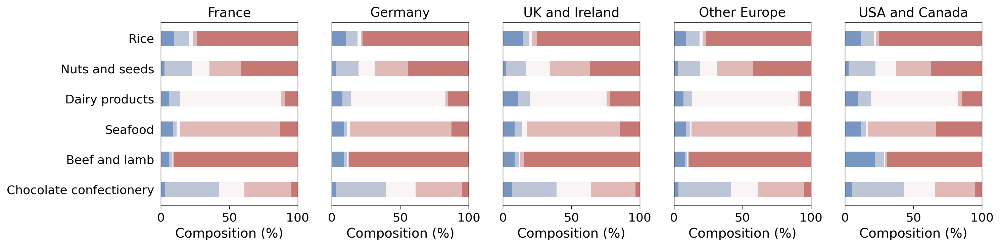

In [154]:
categories_of_interest = [
    "Rice", 
    "Nuts and seeds", 
    "Dairy products", 
    "Seafood", 
    "Beef and lamb", 
    "Chocolate confectionery"
]

def wrap_tick_labels(ax, width=10):
    labels = ax.get_yticklabels()
    ticks = ax.get_yticks()
    ax.set_yticks(ticks)
    wrapped_labels = []
    for lbl in labels:
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_yticklabels(wrapped_labels)

def plot_stacked_barh(ax, data):
    """
    Creates a horizontal stacked bar plot on the given Axes object (ax),
    using the 'impact_groups' as the stacked segments, 'percent' as the width,
    and 'labels' as the y-axis categories.
    """
    # Pivot so each row is a single item with columns for each impact group
    pivot = data.pivot(index=['ID', 'labels'], columns='impact_groups', values='percent').reset_index()
    pivot = pivot.fillna(0)
    # Sort so the top row is the first item in the table
    pivot = pivot.sort_values('ID', ascending=False)

    labels = pivot['labels'].tolist()
    n = len(labels)
    positions = np.arange(n)

    # We drop ID now that we've sorted
    pivot = pivot.drop('ID', axis=1).set_index('labels')
    impact_groups = sorted(pivot.columns)

    # A color palette for your stacked segments
    palette = sns.color_palette("vlag", n_colors=len(impact_groups))
    color_map = dict(zip(impact_groups, palette))

    # Start each bar at left=0
    left = np.zeros(n)
    bar_height = 0.5

    for group in impact_groups:
        ax.barh(
            y=positions,
            width=pivot[group].values,
            left=left,
            height=bar_height,
            label=group,
            color=color_map[group]
        )
        left += pivot[group].values  # shift the start of the next segment

    # Set y-ticks to the item names
    ax.set_yticks(positions)
    ax.set_yticklabels(labels)

    # Minor cosmetic adjustments
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(0.5)

# Your list of countries (columns)
countries_list = ['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada']

# Create a single row with one column per country
fig, axes = plt.subplots(nrows=1, ncols=len(countries_list), figsize=(15, 3.8), sharey=True)

legend_handles = None

for j, country in enumerate(countries_list):
    ax = axes[j]

    # Filter to the selected country and categories_of_interest
    data_sub = composition_sub[
        (composition_sub['country'] == country) &
        (composition_sub['labels'].isin(categories_of_interest))
    ].copy()
    
    plot_stacked_barh(ax, data_sub) 

    ax.set_title(country, fontsize=14)
    ax.set_xlabel("Composition (%)", fontsize=14)
    ax.tick_params(axis='x', which='major', bottom=True, top=False, length=4, width=0.5)
    ax.tick_params(axis='y', which='major', left=False, right=False)
    ax.tick_params(axis='both', which='major', labelsize=13)

    ax.set_xlim(0, 100)

    # Capture legend handles from the first non-empty subplot
    if legend_handles is None:
        handles, labels = ax.get_legend_handles_labels()
        legend_handles = (handles, labels)

plt.tight_layout(w_pad=2)

plt.savefig('../../Product impacts paper/figures/composition_few_categories.jpg', bbox_inches='tight', dpi=300)
plt.show()

In [155]:
composition_sub = composition.drop('country', axis=1).merge(df_plot[['product_id', 'groups', 'labels', 'ID', 'country', 'mean_norm_agg']], 
                                    left_on='id', right_on='product_id')

# to account for almond, rice, oat, other nut milks
df_list = []
for food_cat in ['Almond milk','Oat milk', 'Other nut milk', 'Rice milk']:  
    alt_ids = props[props['Food_Category']==food_cat]['id'].unique()
    df = composition_sub[composition_sub['id'].isin(alt_ids)].groupby('id').first().reset_index()
    composition_sub = composition_sub[~composition_sub['id'].isin(alt_ids)]
    df['Food_Category'] = food_cat
    df['percent'] = 100
    df_list.append(df)
df_list.append(composition_sub)
composition_sub = pd.concat(df_list, axis=0, ignore_index=True)

composition_sub = composition_sub.groupby(['country', 'Food_Category'])[['percent']].sum().reset_index()

def get_perc(g):
    g['percent'] = (g['percent'] / g['percent'].sum()) * 100
    return g

composition_sub = composition_sub.groupby(['country']).apply(lambda g: get_perc(g)).reset_index(drop=True)

composition_sub.loc[composition_sub['Food_Category']=='Fish (farmed)', 'Food_Category'] = 'Fish'
composition_sub.loc[composition_sub['Food_Category']=='Crustaceans (farmed)', 'Food_Category'] = 'Crustaceans'
composition_sub = composition_sub.merge(impact_groups[['Food_Category', 'impact_groups']], how='left')
composition_sub.loc[composition_sub['impact_groups'].isna(), 'impact_groups'] = 1

composition_sub = composition_sub.groupby(['country', 'impact_groups'])[['percent']].sum().reset_index()

/var/folders/hz/lt88gkws0n58xdkp66k3nk340000gn/T/ipykernel_83794/3012923415.py:22: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  composition_sub = composition_sub.groupby(['country']).apply(lambda g: get_perc(g)).reset_index(drop=True)
/var/folders/hz/lt88gkws0n58xdkp66k3nk340000gn/T/ipykernel_83794/3012923415.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  composition_sub = composition_sub.groupby(['country', 'impact_groups'])[['percent']].sum().reset_index()


In [156]:
composition_sub.pivot(index='country', columns='impact_groups', values='percent')

impact_groups,1,2,3,4,5
country,,,,,
France,22.541878,27.105578,18.357091,18.777083,13.218370
Germany,25.062363,27.193285,19.970642,14.833564,12.940145
Other Europe,22.749814,29.659123,20.341697,16.376476,10.872890
UK and Ireland,26.731050,25.938008,18.493266,15.719369,13.118306
USA and Canada,25.089479,31.597135,18.130991,13.929481,11.252914


#### importance of sourcing - also what does impacts figure look like without incorporating sourcing?

In [157]:
sourcing_diff = props.copy()

In [158]:
# using the min and max scores from the overall impacts (with sourcing) to normalize - again, for comparability
for col in score_columns:
    min_score = impacts[f'mean_{col}'].min()
    max_score = impacts[f'mean_{col}'].max()
    sourcing_diff[f'tmp.impact_{col}'] = 100 * (sourcing_diff[f'tmp.impact_{col}'] - min_score) / (max_score - min_score)

sourcing_diff['impact'] = sourcing_diff[['tmp.impact_Land', 'tmp.impact_GHG', 'tmp.impact_Eut',
                         #  'tmp.impact_Acidification', 'tmp.impact_WaterUse',
                         'tmp.impact_WatScar', 'tmp.impact_Biodiversity']].mean(axis=1) 

min_score = impacts[[f'mean_{score_col}_norm' for score_col in score_columns]].mean(axis=1).min()
max_score = impacts[[f'mean_{score_col}_norm' for score_col in score_columns]].mean(axis=1).max()

sourcing_diff['impact'] = 100 * (sourcing_diff['impact'] - min_score) / (max_score - min_score)

In [159]:
df_plot = sourcing_diff.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
                        right_on='Country').drop('Country', axis=1)
df_plot.loc[df_plot['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
df_plot.loc[df_plot['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

df_plot.loc[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df_plot[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

df_plot.loc[df_plot['country'].isin(['Americas']), 'country'] = 'Latin America'
df_plot.loc[df_plot['country'].isin(['Europe']), 'country'] = 'Other Europe'

# remove asia, africa, latam, oceania
df_plot = df_plot[~df_plot['country'].isin(['Africa', 'Asia', 'Latin America', 'Oceania'])]

df_plot = df_plot.merge(impact_groups[['Food_Category', 'impact_groups']])

In [160]:
# df_plot.groupby(['country', 'Food_Category'])[['impact']].mean().reset_index().sort_values(by='impact')

In [161]:
# combine salt and water
df_plot.loc[df_plot['Food_Category'].isin(['Water', 'Salt']), 'Food_Category'] = 'Salt & Water'

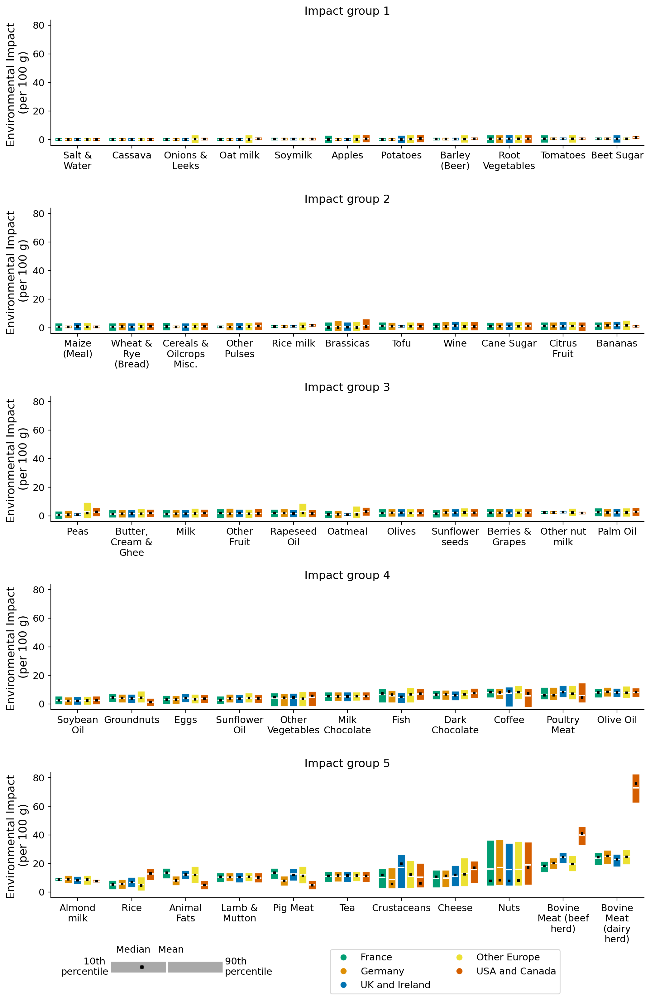

In [162]:
def wrap_tick_labels(ax, width=10):
    labels = ax.get_xticklabels()
    ticks = ax.get_xticks()  
    ax.set_xticks(ticks)
    wrapped_labels = []
    for lbl in labels:
        # textwrap.fill wraps the string to the given width
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_xticklabels(wrapped_labels, rotation=0)
         
dodge = 0.7
countries_order=['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada']
palette = sns.color_palette(["#029e73", "#de8f05", "#0173b2", "#ece133", "#d55e00"])
country_colors = dict(zip(countries_order, palette))

# Initialize the FacetGrid
g = sns.FacetGrid(df_plot, 
                  col='impact_groups',
                  col_wrap=1,
                  sharey=True, sharex=False,
                  height=3, aspect=3.5)

# Define the plotting function
def plot_errorbar(data, color, **kwargs):
    order=data.groupby('Food_Category')[['impact']].mean().reset_index().sort_values(
        by='impact').reset_index(drop=True)['Food_Category'].values.tolist()
    sns.pointplot(
        x='Food_Category', 
        y='impact',
        hue='country',
        hue_order=countries_order,
        data=data,
        order=order,  
        capsize=0,
        errorbar=('pi', 80),
        err_kws={'linewidth': 8},
        markers=".",
        markersize=1,
        linestyles='none',
        dodge=dodge,
        palette = palette
    )

    # adding this for some constant impact categories - since its a single point it was not visible - so adding a flat line for means in original colors
    sns.pointplot(
        x='Food_Category', 
        y='impact',
        estimator='mean',
        hue='country',
        hue_order=countries_order,
        data=data,
        order=order,  
        errorbar=None,
        markers="_",
        markersize=8,
        markeredgewidth=3,
        linestyles='none',
        dodge=dodge,
        palette=palette,
        legend=False
    )
    
    sns.pointplot(
        x='Food_Category', 
        y='impact',
        estimator='mean',
        hue='country',
        hue_order=countries_order,
        data=data,
        order=order,  
        errorbar=None,
        markers="_",
        markersize=7.5,
        markeredgewidth=1.5,
        linestyles='none',
        dodge=dodge,
        palette=sns.color_palette(["white"] * 5),
        legend=False
    )
    
    sns.pointplot(
        x='Food_Category', 
        y='impact',
        estimator='median',
        hue='country',
        hue_order=countries_order,
        data=data,
        order=order,  
        errorbar=None,
        markers="s",
        markersize=1.5,
        markeredgewidth=1.5,
        linestyles='none',
        dodge=dodge,
        palette=sns.color_palette(["black"] * 5),
        legend=False
    )

# Map the plotting function to each facet
g.map_dataframe(plot_errorbar)

# Add axis labels
g.set_ylabels("Environmental Impact \n(per 100 g)", size=13)
g.set_titles("Impact group {col_name}", size=13)
g.figure.subplots_adjust(hspace=0.5)
        
for ax in g.axes.flatten():
    # Remove the subplot legend
    if ax.get_legend() is not None:
        ax.get_legend().remove()
    # Wrap and rotate x-axis labels
    wrap_tick_labels(ax, width=10)
    ax.tick_params(axis='both', which='major', labelsize=11)
    # Clear x-axis label text
    ax.set_xlabel("")

g.add_legend(title='', 
             ncol=2, 
             markerscale=10, fontsize=11,
             bbox_to_anchor=(0.64, -0.04), 
             frameon=True)

# legend for bar style
fig = g.fig
leg_ax = fig.add_axes([0.12, -0.05, 0.14, 0.03])  #[left, bottom, width, height] 
leg_ax.set_xlim(0, 1)
leg_ax.set_ylim(0, 1)

# draw the grey 10th–90th percentile bar
leg_ax.hlines(
    y=0.5,
    xmin=0.05,
    xmax=0.95,
    colors='darkgrey',
    linewidth=12.5
)

# draw the mean line
leg_ax.vlines(
    x=0.5,
    ymin=0.2,
    ymax=0.8,
    colors='white',
    linewidth=2.5
)

# draw the median square
leg_ax.scatter(
    [0.3],
    [0.5],
    marker='s',
    s=10,
    color='black',
    zorder=3
)

# label the ends and the markers
leg_ax.text(
    0.03, 0.5, '10th \npercentile',
    va='center', ha='right', fontsize=11
)
leg_ax.text(
    0.97, 0.5, '90th \npercentile',
    va='center', ha='left', fontsize=11
)
leg_ax.text(
    0.43, 0.95, 'Mean',
    va='bottom', ha='left', fontsize=11
)
leg_ax.text(
    0.37, 0.95, 'Median',
    va='bottom', ha='right', fontsize=11
)
leg_ax.axis('off') # turn off all spines/ticks for the legend axes

plt.savefig('../../Product impacts paper/figures/impact_groups.jpg', bbox_inches='tight', dpi=300)
plt.show()

In [163]:
df_plot = impacts_global[['country', 'groups', 'labels', 'ID', 'product_id', 'mean_norm_agg']]
df_plot = df_plot.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
                        right_on='Country').drop('Country', axis=1)
df_plot.loc[df_plot['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
df_plot.loc[df_plot['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

df_plot.loc[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df_plot[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

df_plot.loc[df_plot['country'].isin(['Americas']), 'country'] = 'Latin America'
df_plot.loc[df_plot['country'].isin(['Europe']), 'country'] = 'Other Europe'

# remove category-country combinations when number of products is less than 30 - removes about 100 products
df = df_plot.groupby(['country', 'labels'])[['product_id']].nunique().reset_index()
df_plot = df_plot[~df_plot['product_id'].isin(df_plot.merge(df[df['product_id']<30][['country', 'labels']])['product_id'].unique())]

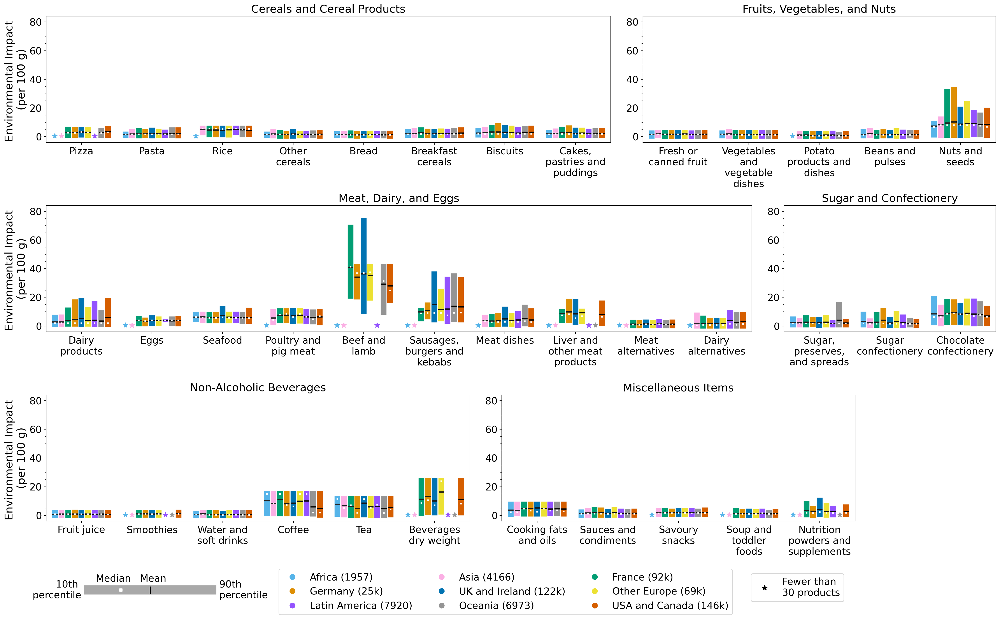

In [164]:
# order
groups = ['Cereals and Cereal Products', 'Fruits, Vegetables, and Nuts',
          'Meat, Dairy, and Eggs', 'Sugar and Confectionery', 
          'Non-Alcoholic Beverages', 'Miscellaneous Items']

countries_order = ['Africa', 'Asia', 'France', 'Germany', 'UK and Ireland',
                   'Other Europe', 'Latin America', 'Oceania',
                   'USA and Canada']

# n rows
groups_split = np.array_split(groups, 3)

fig = plt.figure(figsize=(28, 15))

# outer GridSpec with 3 rows
# defining a second column as the last row has fewer categories than the first 2 
outer_gs = GridSpec(
    nrows=3, ncols=2,
    width_ratios=[11.5, 2],  
    height_ratios=[1, 1, 1],
    wspace=0, hspace=0.5
)

master_ax = None

def wrap_tick_labels(ax, width=10):
    labels = ax.get_xticklabels()
    ticks = ax.get_xticks()  
    ax.set_xticks(ticks)
    wrapped_labels = []
    for lbl in labels:
        # textwrap.fill wraps the string to the given width
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_xticklabels(wrapped_labels, rotation=0)

for row_idx, row_groups in enumerate(groups_split):
    
    # For each row, compute width ratios based on the number of labels per group
    width_ratios = []
    for grp in row_groups:
        n_labels = len(order_df[order_df['groups'] == grp]['labels'].unique())
        width_ratios.append(n_labels)
    
    # subgridspec for this row
    if row_idx!=2:
        inner_gs = outer_gs[row_idx, :].subgridspec(
            1, len(row_groups),
            width_ratios=width_ratios,
            wspace=0.07
        )
    else:
        inner_gs = outer_gs[row_idx, 0].subgridspec(
            1, len(row_groups),
            width_ratios=width_ratios,
            wspace=0.082
        )
    
    for col_idx, grp in enumerate(row_groups):
        # If we haven't assigned a master axis yet, do so now.
        if master_ax is None:
            ax = fig.add_subplot(inner_gs[col_idx])
            master_ax = ax
        else:
            # sharey=master_ax ensures all subplots share the same y-scale
            ax = fig.add_subplot(inner_gs[col_idx], 
                                 sharey=master_ax
                                )
        
        # Subset data for this group
        data = df_plot[
            (df_plot['groups'] == grp)
        ]
         
        # Determine the x-label order for this group
        order = order_df[order_df['groups'] == grp].sort_values(by='ID')['labels'].values
        dodge = 0.75
        palette = sns.color_palette(["#56b4e9", "#fbafe4", "#029e73", "#de8f05", "#0173b2", "#ece133", 
                                         #"#cc78bc", 
                                         "#9352fe",  "#949494", "#d55e00", #"#d7a377"
                                        ])
        country_colors = dict(zip(countries_order, palette))     
        
        sns.pointplot(
            x='labels',
            y='mean_norm_agg',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            capsize=0,
            errorbar=('pi', 80),
            err_kws={'linewidth': 9.5},
            markers=".",
            markersize=5,
            linestyles='none',
            dodge=dodge,
            palette = palette,
            ax=ax
        )

        # adding this for eggs in latin america - since its a single point it was not visible - so adding a flat line for means in original colors
        sns.pointplot(
            x='labels',
            y='mean_norm_agg',
            estimator='mean',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            errorbar=None,
            markers="_",
            markersize=9,
            markeredgewidth=5,
            linestyles='none',
            dodge=dodge,
            ax=ax,
            palette=palette,
            legend=False
        )

        sns.pointplot(
            x='labels',
            y='mean_norm_agg',
            estimator='mean',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            errorbar=None,
            markers="_",
            markersize=9,
            markeredgewidth=2,
            linestyles='none',
            dodge=dodge,
            ax=ax,
            palette='dark:black',
            legend=False
        )

        sns.pointplot(
            x='labels',
            y='mean_norm_agg',
            estimator='median',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            errorbar=None,
            markers="s",
            markersize=1,
            markeredgewidth=2,
            linestyles='none',
            dodge=dodge,
            ax=ax,
            palette=sns.color_palette(["white"] * 9),
            legend=False
        )

        # to ensure same margins irrespective of widths
        ax.set_xlim(-0.5, len(order) - 0.5)
        ax.set_ylim(-3, 71) # to match main figure

        # add symbols for missing bars 
        for i, label_i in enumerate(order):
            for j, country_j in enumerate(countries_order):
                # Check if there is data
                subset = data[(data['labels'] == label_i) & (data['country'] == country_j)]
                if subset.empty:
                    d = dodge + 0.1
                    x_coord = i - d/2 + d/(2*len(countries_order)) + (j * d/len(countries_order))  
                    y_coord = 0.5         
                    ax.scatter(
                        [x_coord], [y_coord],
                        color=country_colors[country_j],
                        marker="*",
                        s=70
                    )
        
        # Remove the subplot legend
        if ax.get_legend() is not None:
            ax.get_legend().remove()
        
        # Wrap x-axis labels
        wrap_tick_labels(ax, width=12)
        
        # tick label font size
        ax.tick_params(axis='both', which='major', labelsize=16)
        # Enable minor ticks on the y-axis
        ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
        # Style the minor ticks (shorter length, no labels)
        ax.tick_params(axis='y', which='minor', length=2, labelsize=0)
        
        # Clear x-axis label text, keep the subplot title
        ax.set_xlabel("")
        ax.set_title(grp, fontsize=18)

        ax.yaxis.set_major_locator(ticker.FixedLocator([0, 20, 40, 60, 80]))
        ax.set_ylim(-4, 84)
        
        # Only set y-label on the leftmost subplot in each row
        if col_idx == 0:
            ax.set_ylabel("Environmental Impact \n(per 100 g)", fontsize=18)
        else:
            ax.set_ylabel("")

# legend
reorder=lambda hl,nc:(sum((lis[i::nc]for i in range(nc)),[])for lis in hl)
handles_labels = master_ax.get_legend_handles_labels()

def short_num(n):
    if n >= 10000:
        return f"{round(n/1000)}k"
    else:
        return str(n)

handles_labels = (handles_labels[0], [f'{c} ({short_num(len(df_plot[df_plot['country']==c]))})' for c in handles_labels[1]])

fig.legend(
    *reorder(handles_labels, 3),
    fontsize=16,
    markerscale=3,
    loc='lower center',
    bbox_to_anchor=(0.5, -0.04),
    ncol=3
)

missing_handle = matplotlib.lines.Line2D(
    [], [], color="black", marker="*", linestyle="None",
    markersize=10, label="Missing"
)

fig.legend(
    [missing_handle],
    ["Fewer than \n30 products"], fontsize=16,
    loc="lower right",  
    bbox_to_anchor=(0.78, -0.02)
)

# legend for bar style
leg_ax = fig.add_axes([0.15, -0.02, 0.12, 0.05])  #[left, bottom, width, height] 
leg_ax.set_xlim(0, 1)
leg_ax.set_ylim(0, 1)

# draw the grey 10th–90th percentile bar
leg_ax.hlines(
    y=0.5,
    xmin=0.05,
    xmax=0.95,
    colors='darkgrey',
    linewidth=15
)

# draw the mean line
leg_ax.vlines(
    x=0.5,
    ymin=0.39,
    ymax=0.61,
    colors='black',
    linewidth=2.5
)

# draw the median square
leg_ax.scatter(
    [0.3],
    [0.5],
    marker='s',
    s=20,
    color='white',
    zorder=3
)

# label the ends and the markers
leg_ax.text(
    0.03, 0.5, '10th \npercentile',
    va='center', ha='right', fontsize=16
)
leg_ax.text(
    0.97, 0.5, '90th \npercentile',
    va='center', ha='left', fontsize=16
)
leg_ax.text(
    0.43, 0.7, 'Mean',
    va='bottom', ha='left', fontsize=16
)
leg_ax.text(
    0.37, 0.7, 'Median',
    va='bottom', ha='right', fontsize=16
)
leg_ax.axis('off') # turn off all spines/ticks for the legend axes

plt.savefig('../../Product impacts paper/figures/no_sourcing.jpg', bbox_inches='tight', dpi=300)
plt.show()

In [165]:
# df_plot.groupby(['country', 'labels'])[['mean_norm_agg']].mean().reset_index().sort_values(by='mean_norm_agg')

In [166]:
df_plot = impacts[['country', 'groups', 'labels', 'ID', 'product_id', 'product_name', 
                   'ingredients_text', 'mean_norm_agg']].merge(impacts_global[['product_id', 'mean_norm_agg']].rename(
    columns={'mean_norm_agg': 'mean_norm_agg_global'}))
df_plot['impacts_diff'] =  df_plot['mean_norm_agg'] - df_plot['mean_norm_agg_global']
df_plot['impacts_diff_prop'] = df_plot['impacts_diff'] / df_plot['mean_norm_agg']
df_plot = df_plot.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
                        right_on='Country').drop('Country', axis=1)
df_plot.loc[df_plot['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
df_plot.loc[df_plot['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

df_plot.loc[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df_plot[~df_plot['country'].isin([
    'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

df_plot.loc[df_plot['country'].isin(['Americas']), 'country'] = 'Latin America'
df_plot.loc[df_plot['country'].isin(['Europe']), 'country'] = 'Other Europe'

# remove category-country combinations when number of products is less than 30 - removes about 100 products
df = df_plot.groupby(['country', 'labels'])[['product_id']].nunique().reset_index()
df_plot = df_plot[~df_plot['product_id'].isin(df_plot.merge(df[df['product_id']<30][['country', 'labels']])['product_id'].unique())]

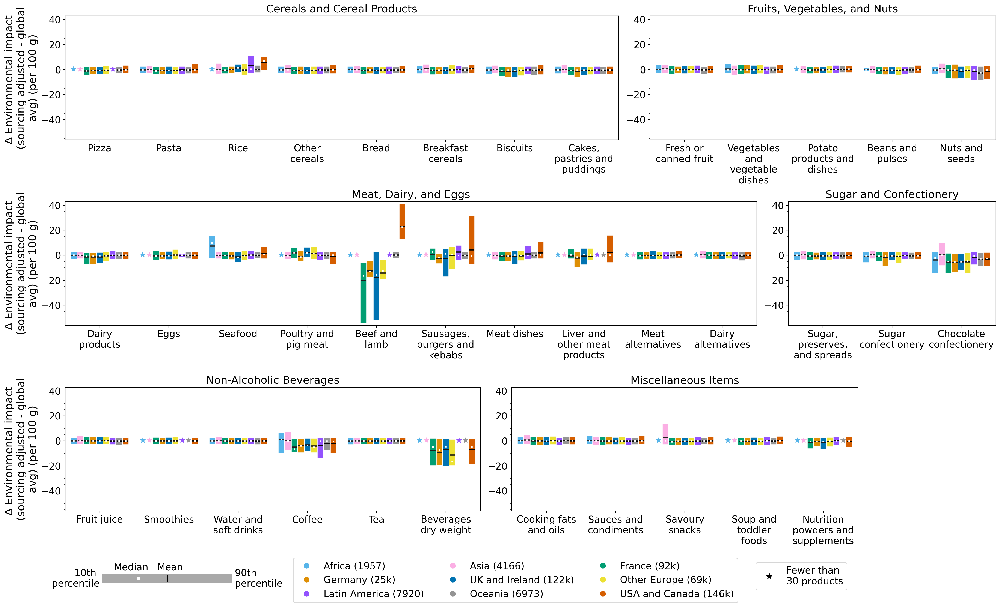

In [167]:
# order
groups = ['Cereals and Cereal Products', 'Fruits, Vegetables, and Nuts',
          'Meat, Dairy, and Eggs', 'Sugar and Confectionery', 
          'Non-Alcoholic Beverages', 'Miscellaneous Items']

countries_order = ['Africa', 'Asia', 'France', 'Germany', 'UK and Ireland',
                   'Other Europe', 'Latin America', 'Oceania',
                   'USA and Canada']

# n rows
groups_split = np.array_split(groups, 3)

fig = plt.figure(figsize=(28, 15))

# outer GridSpec with 3 rows
# defining a second column as the last row has fewer categories than the first 2 
outer_gs = GridSpec(
    nrows=3, ncols=2,
    width_ratios=[11.5, 2],  
    height_ratios=[1, 1, 1],
    wspace=0, hspace=0.5
)

master_ax = None

def wrap_tick_labels(ax, width=10):
    labels = ax.get_xticklabels()
    ticks = ax.get_xticks()  
    ax.set_xticks(ticks)
    wrapped_labels = []
    for lbl in labels:
        # textwrap.fill wraps the string to the given width
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_xticklabels(wrapped_labels, rotation=0)

for row_idx, row_groups in enumerate(groups_split):
    
    # For each row, compute width ratios based on the number of labels per group
    width_ratios = []
    for grp in row_groups:
        n_labels = len(order_df[order_df['groups'] == grp]['labels'].unique())
        width_ratios.append(n_labels)
    
    # subgridspec for this row
    if row_idx!=2:
        inner_gs = outer_gs[row_idx, :].subgridspec(
            1, len(row_groups),
            width_ratios=width_ratios,
            wspace=0.07
        )
    else:
        inner_gs = outer_gs[row_idx, 0].subgridspec(
            1, len(row_groups),
            width_ratios=width_ratios,
            wspace=0.082
        )
    
    for col_idx, grp in enumerate(row_groups):
        # If we haven't assigned a master axis yet, do so now.
        if master_ax is None:
            ax = fig.add_subplot(inner_gs[col_idx])
            master_ax = ax
        else:
            # sharey=master_ax ensures all subplots share the same y-scale
            ax = fig.add_subplot(inner_gs[col_idx], 
                                 sharey=master_ax
                                )
        
        # Subset data for this group
        data = df_plot[
            (df_plot['groups'] == grp)
        ]
         
        # Determine the x-label order for this group
        order = order_df[order_df['groups'] == grp].sort_values(by='ID')['labels'].values
        dodge = 0.75
        palette = sns.color_palette(["#56b4e9", "#fbafe4", "#029e73", "#de8f05", "#0173b2", "#ece133", 
                                         #"#cc78bc", 
                                         "#9352fe",  "#949494", "#d55e00", #"#d7a377"
                                        ])
        country_colors = dict(zip(countries_order, palette))     
        
        sns.pointplot(
            x='labels',
            y='impacts_diff',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            capsize=0,
            errorbar=('pi', 80),
            err_kws={'linewidth': 9.5},
            markers=".",
            markersize=5,
            linestyles='none',
            dodge=dodge,
            palette = palette,
            ax=ax
        )

        # adding this for eggs in latin america - since its a single point it was not visible - so adding a flat line for means in original colors
        sns.pointplot(
            x='labels',
            y='impacts_diff',
            estimator='mean',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            errorbar=None,
            markers="_",
            markersize=9,
            markeredgewidth=5,
            linestyles='none',
            dodge=dodge,
            ax=ax,
            palette=palette,
            legend=False
        )

        sns.pointplot(
            x='labels',
            y='impacts_diff',
            estimator='mean',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            errorbar=None,
            markers="_",
            markersize=9,
            markeredgewidth=2,
            linestyles='none',
            dodge=dodge,
            ax=ax,
            palette='dark:black',
            legend=False
        )

        sns.pointplot(
            x='labels',
            y='impacts_diff',
            estimator='median',
            hue='country',
            hue_order=countries_order,
            data=data,
            order=order,  
            errorbar=None,
            markers="s",
            markersize=1,
            markeredgewidth=2,
            linestyles='none',
            dodge=dodge,
            ax=ax,
            palette=sns.color_palette(["white"] * 9),
            legend=False
        )

        # to ensure same margins irrespective of widths
        ax.set_xlim(-0.5, len(order) - 0.5)

        # add symbols for missing bars 
        for i, label_i in enumerate(order):
            for j, country_j in enumerate(countries_order):
                # Check if there is data
                subset = data[(data['labels'] == label_i) & (data['country'] == country_j)]
                if subset.empty:
                    d = dodge + 0.1
                    x_coord = i - d/2 + d/(2*len(countries_order)) + (j * d/len(countries_order))  
                    y_coord = 0.5         
                    ax.scatter(
                        [x_coord], [y_coord],
                        color=country_colors[country_j],
                        marker="*",
                        s=70
                    )
        
        # Remove the subplot legend
        if ax.get_legend() is not None:
            ax.get_legend().remove()
        
        # Wrap x-axis labels
        wrap_tick_labels(ax, width=12)
        
        # tick label font size
        ax.tick_params(axis='both', which='major', labelsize=16)
        # Enable minor ticks on the y-axis
        ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
        # Style the minor ticks (shorter length, no labels)
        ax.tick_params(axis='y', which='minor', length=2, labelsize=0)
        
        # Clear x-axis label text, keep the subplot title
        ax.set_xlabel("")
        ax.set_title(grp, fontsize=18)
        
        # Only set y-label on the leftmost subplot in each row
        if col_idx == 0:
            ax.set_ylabel("Δ Environmental impact \n(sourcing adjusted - global\navg) (per 100 g)", fontsize=18)
        else:
            ax.set_ylabel("")

# legend
reorder=lambda hl,nc:(sum((lis[i::nc]for i in range(nc)),[])for lis in hl)
handles_labels = master_ax.get_legend_handles_labels()

def short_num(n):
    if n >= 10000:
        return f"{round(n/1000)}k"
    else:
        return str(n)

handles_labels = (handles_labels[0], [f'{c} ({short_num(len(df_plot[df_plot['country']==c]))})' for c in handles_labels[1]])

fig.legend(
    *reorder(handles_labels, 3),
    fontsize=16,
    markerscale=3,
    loc='lower center',
    bbox_to_anchor=(0.5, -0.04),
    ncol=3
)

missing_handle = matplotlib.lines.Line2D(
    [], [], color="black", marker="*", linestyle="None",
    markersize=10, label="Missing"
)

fig.legend(
    [missing_handle],
    ["Fewer than \n30 products"], fontsize=16,
    loc="lower right",  
    bbox_to_anchor=(0.78, -0.02)
)

# legend for bar style
leg_ax = fig.add_axes([0.15, -0.02, 0.12, 0.05])  #[left, bottom, width, height] 
leg_ax.set_xlim(0, 1)
leg_ax.set_ylim(0, 1)

# draw the grey 10th–90th percentile bar
leg_ax.hlines(
    y=0.5,
    xmin=0.05,
    xmax=0.95,
    colors='darkgrey',
    linewidth=15
)

# draw the mean line
leg_ax.vlines(
    x=0.5,
    ymin=0.39,
    ymax=0.61,
    colors='black',
    linewidth=2.5
)

# draw the median square
leg_ax.scatter(
    [0.3],
    [0.5],
    marker='s',
    s=20,
    color='white',
    zorder=3
)

# label the ends and the markers
leg_ax.text(
    0.03, 0.5, '10th \npercentile',
    va='center', ha='right', fontsize=16
)
leg_ax.text(
    0.97, 0.5, '90th \npercentile',
    va='center', ha='left', fontsize=16
)
leg_ax.text(
    0.43, 0.7, 'Mean',
    va='bottom', ha='left', fontsize=16
)
leg_ax.text(
    0.37, 0.7, 'Median',
    va='bottom', ha='right', fontsize=16
)
leg_ax.axis('off') # turn off all spines/ticks for the legend axes

plt.savefig('../../Product impacts paper/figures/global_sourcing_deltas.jpg', bbox_inches='tight', dpi=300)
plt.show()

In [168]:
df_plot.groupby(['country', 'labels'])[['impacts_diff']].mean().reset_index().sort_values(
    'impacts_diff').tail(10)

,country,labels,impacts_diff
278,USA and Canada,Meat dishes,1.857054
248,UK and Ireland,Poultry and pig meat,2.219006
276,USA and Canada,Liver and other meat products,2.235272
145,Latin America,"Sausages, burgers and kebabs",2.507177
41,Asia,Savoury snacks,2.739360
143,Latin America,Rice,3.382057
288,USA and Canada,"Sausages, burgers and kebabs",4.241457
286,USA and Canada,Rice,5.640959
15,Africa,Seafood,7.383877
262,USA and Canada,Beef and lamb,22.825543


In [169]:
df_plot.groupby(['country', 'labels'])[['impacts_diff']].mean().reset_index().sort_values(
    'impacts_diff').head(20)

,country,labels,impacts_diff
49,France,Beef and lamb,-20.463429
225,UK and Ireland,Beef and lamb,-17.876855
188,Other Europe,Beef and lamb,-14.160361
86,Germany,Beef and lamb,-12.515871
189,Other Europe,Beverages dry weight,-11.308261
87,Germany,Beverages dry weight,-9.163901
50,France,Beverages dry weight,-7.499129
226,UK and Ireland,Beverages dry weight,-6.933081
263,USA and Canada,Beverages dry weight,-6.895477
92,Germany,Chocolate confectionery,-5.627139


In [170]:
df_compare = impacts[['country', 'groups', 'labels', 'ID', 
                      'product_id', 'mean_norm_agg']].merge(impacts_global[['product_id', 'mean_norm_agg']].rename(columns={
    'mean_norm_agg': 'mean_norm_agg_global'}))

In [171]:
df_compare['mean_norm_agg'].corr(df_compare['mean_norm_agg_global'])

np.float64(0.8023137772969798)

In [172]:
df_compare.describe()

,product_id,mean_norm_agg,mean_norm_agg_global
count,4.749550e+05,474955.000000,4.749550e+05
mean,2.291481e+14,3.324691,3.945964e+00
std,1.191673e+14,5.384813,5.714985e+00
min,1.188327e+07,0.000000,-7.406112e-08
25%,2.911202e+14,0.815231,1.161533e+00
50%,2.911202e+14,1.570934,1.877428e+00
75%,2.911202e+14,3.637083,4.633091e+00
max,2.911202e+14,100.000000,1.227561e+02


In [173]:
df_compare.groupby('labels')[['mean_norm_agg','mean_norm_agg_global']].corr().unstack().iloc[:,1].sort_values()

labels
Beef and lamb                        0.099706
Beverages dry weight                 0.530038
Rice                                 0.583712
Chocolate confectionery              0.649735
Liver and other meat products        0.660133
Beans and pulses                     0.665749
Sausages, burgers and kebabs         0.693132
Meat dishes                          0.707930
Eggs                                 0.709054
Vegetables and vegetable dishes      0.785976
Other cereals                        0.788721
Sugar confectionery                  0.799348
Soup and toddler foods               0.803632
Pasta                                0.823905
Breakfast cereals                    0.827056
Biscuits                             0.828961
Sauces and condiments                0.829400
Bread                                0.834609
Meat alternatives                    0.840658
Poultry and pig meat                 0.843486
Cakes, pastries and puddings         0.845984
Nutrition powders and suppl

In [174]:
# maybe these should be the corrs to report - the corrs between normalized aggregated scores don't make much sense
for score in score_columns:
    df_compare = impacts[['country', 'groups', 'labels', 'ID', 
                          'product_id', f'mean_{score}']].merge(impacts_global[['product_id', f'mean_{score}']].rename(columns={
        f'mean_{score}': f'mean_{score}_global'}))
    print(score)
    print(df_compare[f'mean_{score}'].corr(df_compare[f'mean_{score}_global']))
    print(df_compare.groupby('labels')[[f'mean_{score}', f'mean_{score}_global']].corr().unstack().iloc[:,1].sort_values())
    print('')

Land
0.697004737662239
labels
Beef and lamb                        0.271069
Sausages, burgers and kebabs         0.591558
Soup and toddler foods               0.636151
Meat dishes                          0.651733
Liver and other meat products        0.673619
Sauces and condiments                0.686698
Beans and pulses                     0.710373
Pasta                                0.722871
Seafood                              0.730725
Poultry and pig meat                 0.745481
Other cereals                        0.757439
Pizza                                0.768110
Bread                                0.772521
Meat alternatives                    0.780092
Eggs                                 0.789608
Vegetables and vegetable dishes      0.835159
Savoury snacks                       0.836437
Dairy products                       0.854063
Nutrition powders and supplements    0.874770
Fruit juice                          0.892585
Rice                                 0.892727
Brea

In [175]:
# stats test to show composition doesnt explain regional differences
composition_sub = composition.drop('country', axis=1).merge(df_plot[['product_id', 'groups', 'labels', 'ID', 'country', 'mean_norm_agg']], 
                                    left_on='id', right_on='product_id')

# to account for almond, rice, oat, other nut milks
df_list = []
for food_cat in ['Almond milk','Oat milk', 'Other nut milk', 'Rice milk']:  
    alt_ids = props[props['Food_Category']==food_cat]['id'].unique()
    df = composition_sub[composition_sub['id'].isin(alt_ids)].groupby('id').first().reset_index()
    composition_sub = composition_sub[~composition_sub['id'].isin(alt_ids)]
    df['Food_Category'] = food_cat
    df['percent'] = 100
    df_list.append(df)
df_list.append(composition_sub)
composition_sub = pd.concat(df_list, axis=0, ignore_index=True)

composition_sub.loc[composition_sub['Food_Category']=='Fish (farmed)', 'Food_Category'] = 'Fish'
composition_sub.loc[composition_sub['Food_Category']=='Crustaceans (farmed)', 'Food_Category'] = 'Crustaceans'
composition_sub = composition_sub.merge(impact_groups[['Food_Category', 'impact_groups']], how='left')
composition_sub.loc[composition_sub['impact_groups'].isna(), 'impact_groups'] = 1
composition_sub.shape

df_list = []
for g in [1,2,3,4,5]:
    df = composition_sub[composition_sub['impact_groups']==g]
    df = df.groupby(['id', 'ID', 'country'])[['percent']].sum().reset_index()
    df['impact_group'] = g
    df_list.append(df)

df = pd.concat(df_list, axis=0, ignore_index=True)
df_t = df.groupby('id')[['percent']].sum().reset_index().rename(columns={'percent': 'percent_total'})
df = df.merge(df_t)
df['percent'] = df['percent'] / df['percent_total']
df = df.pivot(index=['id', 'ID', 'country'], columns='impact_group', values='percent').reset_index().fillna(0)
df = df.merge(df_mapping)
df = df.merge(impacts[['product_id', 'mean_norm_agg']], left_on='id', right_on='product_id').rename(
    columns={1: 'group1', 2: 'group2', 3: 'group3', 4: 'group4', 5: 'group5', 'mean_norm_agg': 'impacts_sourcing'})

df = df.merge(impacts_global[['product_id', 'mean_norm_agg']]).rename(columns={'mean_norm_agg': 'impacts_global'})

In [176]:
for label in df['labels'].unique():
    
    print(label)
    df_sub = df[df['labels']==label]
    
    # comp vs country
    m_comp = smf.ols("group5 ~ country",
                     data=df_sub).fit()
    print(m_comp.summary(slim=True))

    # impact (with sourcing) vs composition
    m_imp = smf.ols("impacts_sourcing ~ group2 + group3 + group4 + group5",
                     data=df_sub).fit()
    print(m_imp.summary(slim=True))
    
    # impact (with sourcing) vs country
    m_imp = smf.ols("impacts_sourcing ~ country",
                     data=df_sub).fit()
    print(m_imp.summary(slim=True))
    print('\n')

Poultry and pig meat
                            OLS Regression Results                            
Dep. Variable:                 group5   R-squared:                       0.035
Model:                            OLS   Adj. R-squared:                  0.034
No. Observations:               18480   F-statistic:                     95.11
Covariance Type:            nonrobust   Prob (F-statistic):          5.25e-137
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                     0.2612      0.055      4.720      0.000       0.153       0.370
country[T.France]             0.2209      0.056      3.971      0.000       0.112       0.330
country[T.Germany]            0.2003      0.057      3.511      0.000       0.088       0.312
country[T.Latin America]     -0.0214      0.067     -0.318      0.751      -0.153       0.111
country[T.Oceania]  

In [177]:
for label in df['labels'].unique():
    
    print(label)
    df_sub = df[df['labels']==label]

    # impact (no sourcing) vs composition
    m_imp = smf.ols("impacts_global ~ group2 + group3 + group4 + group5",
                     data=df_sub).fit()
    print(m_imp.summary(slim=True))
    
    # impact (no sourcing) vs country
    m_imp = smf.ols("impacts_global ~ country",
                     data=df_sub).fit()
    print(m_imp.summary(slim=True))
    print('\n')

Poultry and pig meat
                            OLS Regression Results                            
Dep. Variable:         impacts_global   R-squared:                       0.496
Model:                            OLS   Adj. R-squared:                  0.496
No. Observations:               18480   F-statistic:                     4550.
Covariance Type:            nonrobust   Prob (F-statistic):               0.00
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.3324      0.134      9.927      0.000       1.069       1.595
group2        -2.5462      0.323     -7.892      0.000      -3.179      -1.914
group3         0.8997      0.560      1.607      0.108      -0.198       1.997
group4         4.9022      0.154     31.767      0.000       4.600       5.205
group5         9.6193      0.154     62.405      0.000       9.317       9.921

Notes:
[1] Standard Errors ass

#### summary of all other countries

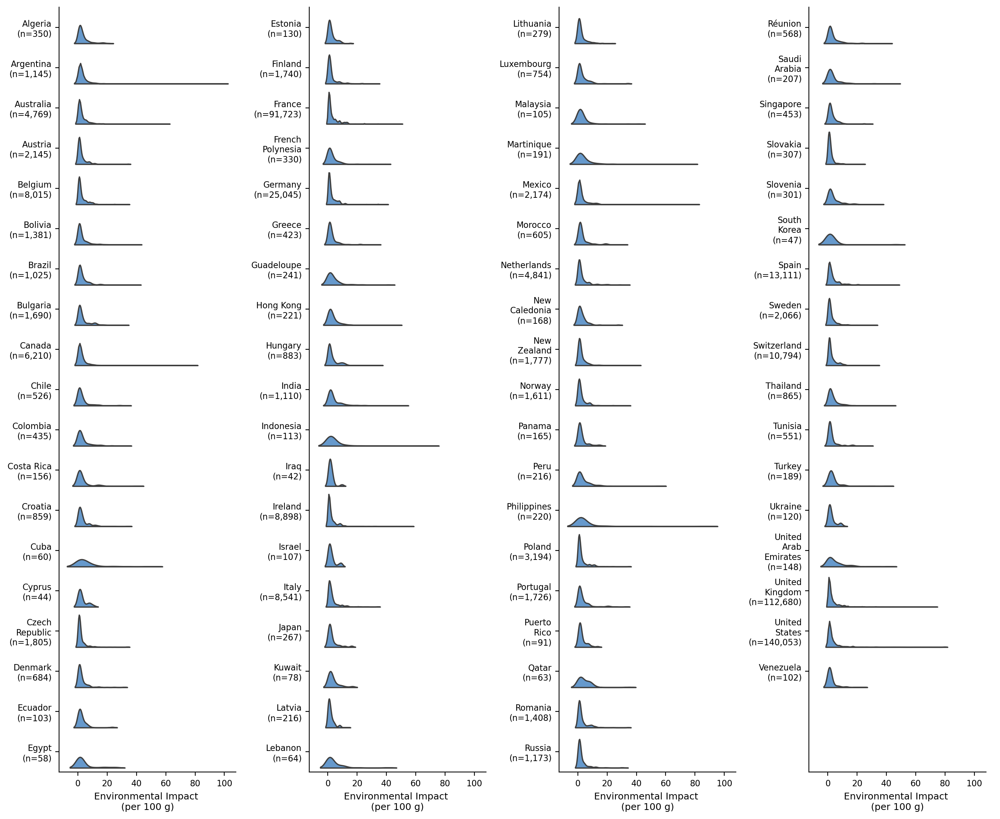

In [178]:
def wrap_tick_labels(ax, width=10):
    labels = ax.get_yticklabels()
    wrapped_labels = []
    for lbl in labels:
        # textwrap.fill wraps the string to the given width
        wrapped_labels.append(textwrap.fill(lbl.get_text(), width=width, break_long_words=False))
    ax.set_yticklabels(wrapped_labels, rotation=0)

sns.set_color_codes()
unique_countries = sorted(impacts['country'].unique())
n_per_facet = 19
country_to_facet = {country: i // n_per_facet for i, country in enumerate(unique_countries)}
impacts['facet'] = impacts['country'].map(country_to_facet)
country_counts = impacts['country'].value_counts()

g = sns.catplot(
    data=impacts,
    kind="violin",
    split=True,
    inner=None,
    x="mean_norm_agg",
    y="country",
    order=unique_countries,
    col="facet",
    sharex=True,  
    sharey=False,
    height=11,
    aspect=0.3
)

for i,ax in enumerate(g.axes.flat):
    ax.set_xlabel("Environmental Impact \n(per 100 g)", fontsize=9)
    ax.set_ylabel("")
    new_labels = []
    for label in ax.get_yticklabels():
        country = label.get_text()
        # Lookup the count; default to 0 if country is not found (shouldn't happen)
        count = country_counts.get(country, 0)
        # Format count with commas (e.g., 1,000)
        new_labels.append(f"{country} (n={count:,})")
    # Wrap y-axis labels
    ticks = ax.get_yticks()  
    ax.set_yticks(ticks)
    ax.set_yticklabels(new_labels)
    wrap_tick_labels(ax, width=10)
    ax.tick_params(axis='both', which='major', labelsize=8)
    ax.set_ylim(n_per_facet*(i+1)-0.5, n_per_facet*i-0.5)
    i+=1

    for pc in ax.findobj(mcoll.PolyCollection):
        # Set the fill color (if you want a single color for all violins)
        pc.set_facecolor("#6699CC")  # or any valid color string
        # Set the transparency (alpha)
        # pc.set_alpha(0.5)
    
g.set_titles("")

plt.tight_layout()

plt.savefig('../../Product impacts paper/figures/all_countries.jpg', bbox_inches='tight', dpi=300)
plt.show()

In [179]:
impacts[['mean_Land', 'mean_GHG', 'mean_Eut', 'mean_WatScar', 'mean_Biodiversity']].describe() # this is not normalized (just checking that all indicators are right skewed)

,mean_Land,mean_GHG,mean_Eut,mean_WatScar,mean_Biodiversity
count,474955.000000,474955.000000,474955.000000,474955.000000,474955.000000
mean,0.681418,0.368101,2.347627,1869.761327,18.576969
std,1.397783,0.583927,9.613765,3624.586448,47.747417
min,0.000000,-0.316062,0.000000,0.000000,0.000000
25%,0.138313,0.096872,0.445174,204.602391,1.647240
50%,0.279616,0.180201,0.875671,607.426360,5.155687
75%,0.706756,0.332778,1.881009,1854.423638,15.704605
max,71.301743,19.677128,207.126061,60408.957838,3871.904993


In [180]:
impacts[impacts['mean_norm_agg']<0.05].sample(10)[['product_name', 'country']].values

array([['Chek, Lemon Lime Soda, Lemon Lime', 'United States'],
       ['Coca-cola', 'Finland'],
       ['Waitrose Ginger Beer No Added Sugar', 'United Kingdom'],
       ['Rich Beef Stock Pot', 'France'],
       ['Almond SoFresh Unsweetened Vanilla', 'France'],
       ['Maple water', 'United States'],
       ['Fruit Shoot Apple & Blackcurrant', 'United Kingdom'],
       ['Bahama Blueberry, Flavored Juice Drink From The',
        'United States'],
       ['Shasta, twist, soda, lemon lime', 'United States'],
       ['Mixed up salt', 'United States']], dtype=object)

In [181]:
impacts[impacts['mean_norm_agg']>60].sample(10)[['product_name', 'country']].values

array([['beef & beef broth', 'United States'],
       ['Angus chuck steak burger', 'United States'],
       ['100% Grass-Fed Beef Polish Sausage', 'United States'],
       ['Beef smoked sausage, beef', 'United States'],
       ['Quarter Pounders Patties', 'United States'],
       ['Spicy Beef Sticks', 'United States'],
       ['Garlic & parsley artisan grass-fed beef protein snack',
        'United States'],
       ['Organic prairie, uncured beef summer sausage', 'United States'],
       ['Organic grass fed beef top sirloin', 'United States'],
       ['Ground Beef Chuck', 'United States']], dtype=object)

#### nutrition stuff

In [1]:
# df_list = []
# for fname in glob.glob(os.path.join('../../SFS/environmental_impacts/Managed_Data', "NutriScore*.csv")):
#     df = pd.read_csv(fname)
#     df_list.append(df)

# nutri = pd.concat(df_list, axis=0, ignore_index=True)

In [2]:
# nutri = nutri.merge(impacts[['groups', 'labels', 'ID', 'product_id', 'mean_norm_agg']], left_on='id', right_on='product_id')
# nutri['NutriScorePoints'] = 100 * (nutri['NutriScorePoints'] - nutri['NutriScorePoints'].min()) / (nutri['NutriScorePoints'].max() - nutri['NutriScorePoints'].min())

In [3]:
# df_plot = nutri.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
#                         right_on='Country').drop('Country', axis=1)
# df_plot.loc[df_plot['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
# df_plot.loc[df_plot['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

# df_plot.loc[~df_plot['country'].isin([
#     'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df_plot[~df_plot['country'].isin([
#     'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

# df_plot.loc[df_plot['country'].isin(['Americas']), 'country'] = 'Latin America'
# df_plot.loc[df_plot['country'].isin(['Europe']), 'country'] = 'Other Europe'

In [4]:
# df_plot['NutriScorePoints'].corr(df_plot['mean_norm_agg'])

In [5]:
# df_plot.groupby('groups')[['mean_norm_agg','NutriScorePoints']].corr().unstack().iloc[:,1].sort_values()

In [6]:
# df = df_plot.groupby(['country', 'groups', 'labels', 'ID'])[['mean_norm_agg', 'NutriScorePoints']].mean().reset_index()

In [7]:
# g = sns.FacetGrid(data=df, 
#                   col="country",  col_wrap=3, hue='groups', 
#                   hue_order=['Cereals and Cereal Products', 'Fruits, Vegetables, and Nuts',
#                              'Meat, Dairy, and Eggs', 'Sugar and Confectionery', 
#                              'Non-Alcoholic Beverages', 'Miscellaneous Items'],
#                   col_order=['Africa', 'Asia', 'France', 'Germany', 'UK and Ireland',
#                              'Other Europe', 'Latin America', 'Oceania', 'USA and Canada'],
#                   height=4, aspect=1,
#                   palette=sns.color_palette(["#fbafe4", "#0173b2", "#ece133", "#9352fe",  "#56b4e9", "#d55e00"]))
# g.map(sns.scatterplot, 'NutriScorePoints', 'mean_norm_agg', s=50)

# g.set_titles("{col_name}")
# g.set_ylabels("Environmental Impact \n(per 100 g)", fontsize=12)
# g.set_xlabels("Nutritional score", fontsize=12)

# for ax in g.axes.flatten():
#     ax.set_yscale('log')
#     major_ticks = [0.3, 1, 3, 10, 30]
#     ax.yaxis.set_major_locator(ticker.FixedLocator(major_ticks))
#     ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: f"{y:g}"))
#     ax.minorticks_off()  

# g.add_legend(title='', ncol=3, bbox_to_anchor=(0.5, -0.05), frameon=True)

# plt.savefig('../../Product impacts paper/figures/nutri1.jpg', bbox_inches='tight', dpi=300)
# plt.show()

In [8]:
# df_plot = df_plot[df_plot['country'].isin([ 'France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'])]
# df = df_plot.groupby('labels').apply(lambda g: g.sample(100)).reset_index(drop=True)

In [9]:
# grp = 'Cereals and Cereal Products'

# g = sns.FacetGrid(data=df[df['groups']==grp].sort_values(by='ID'), 
#                   col="labels", hue='country', 
#                   col_order = order_df[order_df['groups'] == grp].sort_values(by='ID')['labels'].values,
#                   hue_order=['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'],
#                   palette=sns.color_palette(["#029e73", "#de8f05", "#0173b2", "#ece133", "#d55e00"]),
#                   height=3, aspect=1,
#                   col_wrap=4)
# g.map(sns.scatterplot, 'NutriScorePoints', 'mean_norm_agg', s=40, alpha=0.8)

# g.set_titles("{col_name}")
# g.set_ylabels("Environmental Impact \n(per 100 g)", fontsize=10)
# g.set_xlabels("Nutritional score", fontsize=10)

# for ax in g.axes.flatten():
#     ax.set_yscale('log')
#     major_ticks = [0.3, 1, 3, 10, 30, 100]
#     ax.yaxis.set_major_locator(ticker.FixedLocator(major_ticks))
#     ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: f"{y:g}"))
#     ax.minorticks_off() 
#     ax.set_xlim(0, 100)
#     ax.set_ylim(0.1, 100)

# g.add_legend(title='', ncol=5, bbox_to_anchor=(0.5, -0.05), frameon=True)
    
# plt.savefig('../../Product impacts paper/figures/nutri_cereals.jpg', bbox_inches='tight', dpi=300)
# plt.show()

In [10]:
# grp = 'Fruits, Vegetables, and Nuts'

# g = sns.FacetGrid(data=df[df['groups']==grp].sort_values(by='ID'), 
#                   col="labels", hue='country', 
#                   col_order = order_df[order_df['groups'] == grp].sort_values(by='ID')['labels'].values,
#                   hue_order=['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'],
#                   palette=sns.color_palette(["#029e73", "#de8f05", "#0173b2", "#ece133", "#d55e00"]),
#                   height=3, aspect=1,
#                   col_wrap=4)
# g.map(sns.scatterplot, 'NutriScorePoints', 'mean_norm_agg', s=40, alpha=0.8)

# g.set_titles("{col_name}")
# g.set_ylabels("Environmental Impact \n(per 100 g)", fontsize=10)
# g.set_xlabels("Nutritional score", fontsize=10)

# for ax in g.axes.flatten():
#     ax.set_yscale('log')
#     major_ticks = [0.3, 1, 3, 10, 30, 100]
#     ax.yaxis.set_major_locator(ticker.FixedLocator(major_ticks))
#     ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: f"{y:g}"))
#     ax.minorticks_off() 
#     ax.set_xlim(0, 100)
#     ax.set_ylim(0.1, 100)

# g.add_legend(title='', ncol=5, bbox_to_anchor=(0.5, -0.05), frameon=True)
    
# plt.savefig('../../Product impacts paper/figures/nutri_veg.jpg', bbox_inches='tight', dpi=300)
# plt.show()

In [11]:
# grp = 'Meat, Dairy, and Eggs'

# g = sns.FacetGrid(data=df[df['groups']==grp].sort_values(by='ID'), 
#                   col="labels", hue='country', 
#                   col_order = order_df[order_df['groups'] == grp].sort_values(by='ID')['labels'].values,
#                   hue_order=['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'],
#                   palette=sns.color_palette(["#029e73", "#de8f05", "#0173b2", "#ece133", "#d55e00"]),
#                   height=3, aspect=1,
#                   col_wrap=4)
# g.map(sns.scatterplot, 'NutriScorePoints', 'mean_norm_agg', s=40, alpha=0.8)

# g.set_titles("{col_name}")
# g.set_ylabels("Environmental Impact \n(per 100 g)", fontsize=10)
# g.set_xlabels("Nutritional score", fontsize=10)

# for ax in g.axes.flatten():
#     ax.set_yscale('log')
#     major_ticks = [0.3, 1, 3, 10, 30, 100]
#     ax.yaxis.set_major_locator(ticker.FixedLocator(major_ticks))
#     ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: f"{y:g}"))
#     ax.minorticks_off() 
#     ax.set_xlim(0, 100)
#     ax.set_ylim(0.1, 100)

# g.add_legend(title='', ncol=5, bbox_to_anchor=(0.5, -0.05), frameon=True)
    
# plt.savefig('../../Product impacts paper/figures/nutri_meat.jpg', bbox_inches='tight', dpi=300)
# plt.show()

In [12]:
# grp = 'Sugar and Confectionery'

# g = sns.FacetGrid(data=df[df['groups']==grp].sort_values(by='ID'), 
#                   col="labels", hue='country', 
#                   col_order = order_df[order_df['groups'] == grp].sort_values(by='ID')['labels'].values,
#                   hue_order=['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'],
#                   palette=sns.color_palette(["#029e73", "#de8f05", "#0173b2", "#ece133", "#d55e00"]),
#                   height=3, aspect=1,
#                   col_wrap=4)
# g.map(sns.scatterplot, 'NutriScorePoints', 'mean_norm_agg', s=40, alpha=0.8)

# g.set_titles("{col_name}")
# g.set_ylabels("Environmental Impact \n(per 100 g)", fontsize=10)
# g.set_xlabels("Nutritional score", fontsize=10)

# for ax in g.axes.flatten():
#     ax.set_yscale('log')
#     major_ticks = [0.3, 1, 3, 10, 30, 100]
#     ax.yaxis.set_major_locator(ticker.FixedLocator(major_ticks))
#     ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: f"{y:g}"))
#     ax.minorticks_off() 
#     ax.set_xlim(0, 100)
#     ax.set_ylim(0.1, 100)

# g.add_legend(title='', ncol=5, bbox_to_anchor=(0.5, -0.05), frameon=True)
    
# plt.savefig('../../Product impacts paper/figures/nutri_sugar.jpg', bbox_inches='tight', dpi=300)
# plt.show()

In [13]:
# grp = 'Non-Alcoholic Beverages'

# g = sns.FacetGrid(data=df[df['groups']==grp].sort_values(by='ID'), 
#                   col="labels", hue='country', 
#                   col_order = order_df[order_df['groups'] == grp].sort_values(by='ID')['labels'].values,
#                   hue_order=['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'],
#                   palette=sns.color_palette(["#029e73", "#de8f05", "#0173b2", "#ece133", "#d55e00"]),
#                   height=3, aspect=1,
#                   col_wrap=4)
# g.map(sns.scatterplot, 'NutriScorePoints', 'mean_norm_agg', s=40, alpha=0.8)

# g.set_titles("{col_name}")
# g.set_ylabels("Environmental Impact \n(per 100 g)", fontsize=10)
# g.set_xlabels("Nutritional score", fontsize=10)

# for ax in g.axes.flatten():
#     ax.set_yscale('log')
#     major_ticks = [0.3, 1, 3, 10, 30, 100]
#     ax.yaxis.set_major_locator(ticker.FixedLocator(major_ticks))
#     ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: f"{y:g}"))
#     ax.minorticks_off() 
#     ax.set_xlim(0, 100)
#     ax.set_ylim(0.1, 100)

# g.add_legend(title='', ncol=5, bbox_to_anchor=(0.5, -0.05), frameon=True)
    
# plt.savefig('../../Product impacts paper/figures/nutri_bev.jpg', bbox_inches='tight', dpi=300)
# plt.show()

In [14]:
# grp = 'Miscellaneous Items'

# g = sns.FacetGrid(data=df[df['groups']==grp].sort_values(by='ID'), 
#                   col="labels", hue='country', 
#                   col_order = order_df[order_df['groups'] == grp].sort_values(by='ID')['labels'].values,
#                   hue_order=['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'],
#                   palette=sns.color_palette(["#029e73", "#de8f05", "#0173b2", "#ece133", "#d55e00"]),
#                   height=3, aspect=1,
#                   col_wrap=4)
# g.map(sns.scatterplot, 'NutriScorePoints', 'mean_norm_agg', s=40, alpha=0.8)

# g.set_titles("{col_name}")
# g.set_ylabels("Environmental Impact \n(per 100 g)", fontsize=10)
# g.set_xlabels("Nutritional score", fontsize=10)

# for ax in g.axes.flatten():
#     ax.set_yscale('log')
#     major_ticks = [0.3, 1, 3, 10, 30, 100]
#     ax.yaxis.set_major_locator(ticker.FixedLocator(major_ticks))
#     ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: f"{y:g}"))
#     ax.minorticks_off() 
#     ax.set_xlim(0, 100)
#     ax.set_ylim(0.1, 100)

# g.add_legend(title='', ncol=5, bbox_to_anchor=(0.5, -0.05), frameon=True)
    
# plt.savefig('../../Product impacts paper/figures/nutri_misc.jpg', bbox_inches='tight', dpi=300)
# plt.show()

In [15]:
# # number of ingredients vs nutri score

# df_plot = composition.copy().rename(columns={'id': 'product_id'})
# # nulls haven't been removed, counting the number of values in ingredients text, as opposed to ingredient categories
# df_plot = df_plot.merge(nutri[['product_id', 'groups', 'labels', 'mean_norm_agg', 'NutriScorePoints']])
# df_plot.loc[(df_plot['Food_Category'].notnull()) & (df_plot['value'].isna()), 'value'] = df_plot[(
#     df_plot['Food_Category'].notnull()) & (df_plot['value'].isna())]['Food_Category']
# df_plot = df_plot.groupby(['product_id', 'country', 'groups', 'labels', 'mean_norm_agg', 'NutriScorePoints'])[['value']].nunique().reset_index()

# df_plot = df_plot.merge(country_groups[['Country', 'Intermediate Region Name', 'Sub-region Name', 'Region Name']], left_on='country',
#                         right_on='Country').drop('Country', axis=1)
# df_plot.loc[df_plot['country'].isin(['United Kingdom', 'Ireland']), 'country'] = 'UK and Ireland'
# df_plot.loc[df_plot['country'].isin(['United States', 'Canada']), 'country'] = 'USA and Canada'

# df_plot.loc[~df_plot['country'].isin([
#     'France', 'Germany', 'UK and Ireland', 'USA and Canada']), 'country'] = df_plot[~df_plot['country'].isin([
#     'France', 'Germany', 'UK and Ireland', 'USA and Canada'])]['Region Name']

# df_plot.loc[df_plot['country'].isin(['Americas']), 'country'] = 'Latin America'
# df_plot.loc[df_plot['country'].isin(['Europe']), 'country'] = 'Other Europe'

# df_plot = df_plot[~df_plot['country'].isin(['Africa', 'Asia', 'Latin America', 'Oceania'])]

In [16]:
# g = sns.FacetGrid(data=df_plot, 
#                   col="groups", row='country',  
#                   row_order=['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'],
#                   col_order=['Cereals and Cereal Products', 'Fruits, Vegetables, and Nuts',
#                              'Meat, Dairy, and Eggs', 'Sugar and Confectionery', 
#                              'Non-Alcoholic Beverages', 'Miscellaneous Items'],
#                   height=3)
# g.map(sns.kdeplot, 'value', 'NutriScorePoints', fill=True)

# g.set_axis_labels("Number of Ingredients", "Nutritional score")
# g.set_titles("{row_name}\n{col_name}")
# g.fig.subplots_adjust(hspace=0.25, wspace=0.1)
    
# plt.savefig('../../Product impacts paper/figures/kde2.jpg', bbox_inches='tight', dpi=300)
# plt.show()

In [17]:
# g = sns.FacetGrid(data=df_plot, 
#                   col="groups", row='country',  
#                   row_order=['France', 'Germany', 'UK and Ireland', 'Other Europe', 'USA and Canada'],
#                   col_order=['Cereals and Cereal Products', 'Fruits, Vegetables, and Nuts',
#                              'Meat, Dairy, and Eggs', 'Sugar and Confectionery', 
#                              'Non-Alcoholic Beverages', 'Miscellaneous Items'],
#                   height=3)
# g.map(sns.kdeplot, 'NutriScorePoints', 'mean_norm_agg', fill=True)

# g.set_axis_labels("Nutritional score", "Environmental Impact \n(per 100 g)")
# g.set_titles("{row_name}\n{col_name}")
# g.fig.subplots_adjust(hspace=0.25, wspace=0.1)
    
# plt.savefig('../../Product impacts paper/figures/kde3.jpg', bbox_inches='tight', dpi=300)
# plt.show()